# Fitting line profiles with lorentzian and Gausian

In [1]:
import sys
sys.path.append('E:/solar flares/data/2017-09-06')
import use_nessi3 as un
import data_analysis as da
import numpy as np
import matplotlib.pyplot as plt
import use_nessi as un
import use_nessi2 as un2
import os
from importlib import reload
# from matplotlib import cm
# import matplotlib.cbook as cbook
# import matplotlib.colors as colors
# from scipy.interpolate import interp1d
import voigt_fit as vf

[2.         2.28333333 2.56666667 2.85       3.15       3.43333333
 3.71666667 4.         4.28333333 4.56666667 4.85       5.15
 5.43333333 5.71666667 6.        ]
dict_keys(['area_theta_He15b', 'FOV_He15b', 'quiet_sun_He15b', 'nessi_He15b', 'True_nessi_He15b', 'TIME_He15b'])
The average is 0.9999948053738351
frame 0 at time 2.0 with param_fit[-1] = (array([-7.65108895e-05,  5.87751221e+03,  1.33123273e-01,  2.20944829e+00]), array([1.82928149e-01, 8.89737881e-01, 4.39984319e+04, 6.13221355e-01])). Here comes the plot:


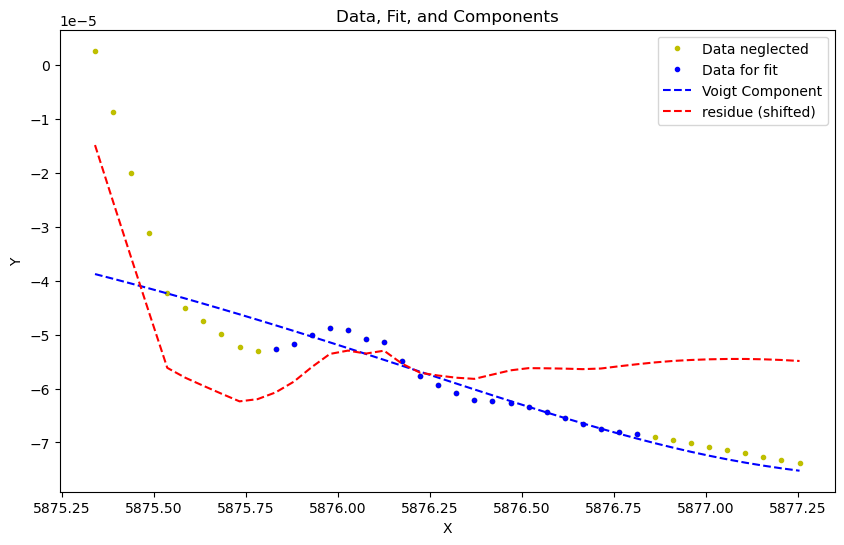

At frame 2 at time 2.5666666666667197 the voigt fitting was not succesfull and average guess ([-3.03931264e-05  5.87691399e+03 -2.09433303e-01  1.15033306e+00]) is used as params and as std of params. 
frame 4 at time 3.1499999999999773 with param_fit[-1] = (array([-7.83052642e-06,  5.87643409e+03,  5.37905096e-01,  2.94441451e-01]), array([5.55533723e-07, 3.20086365e-02, 1.63927297e-01, 8.86888045e-01])). Here comes the plot:


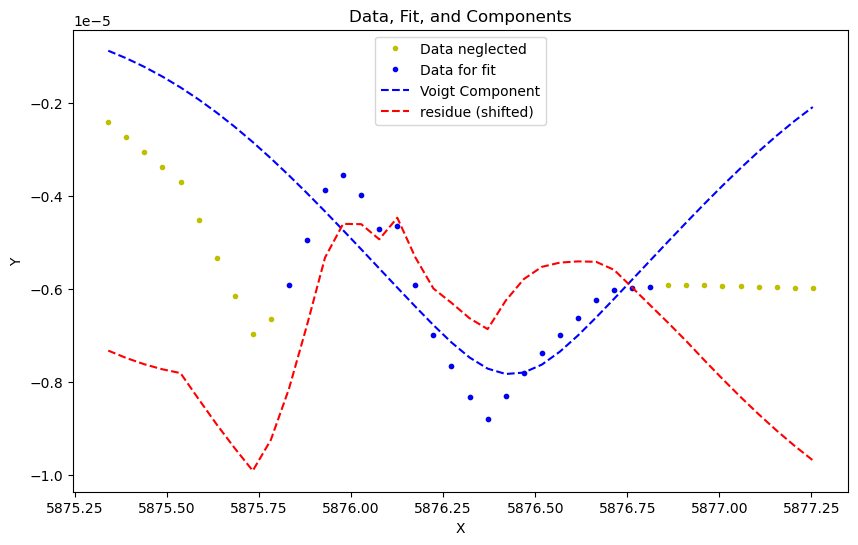

frame 6 at time 3.716666666666697 with param_fit[-1] = (array([-7.63143190e-06,  5.87629849e+03, -1.48538693e-01,  9.53347895e-01]), array([3.28043667e-07, 4.73394284e-02, 1.40231695e+00, 1.03706615e+00])). Here comes the plot:


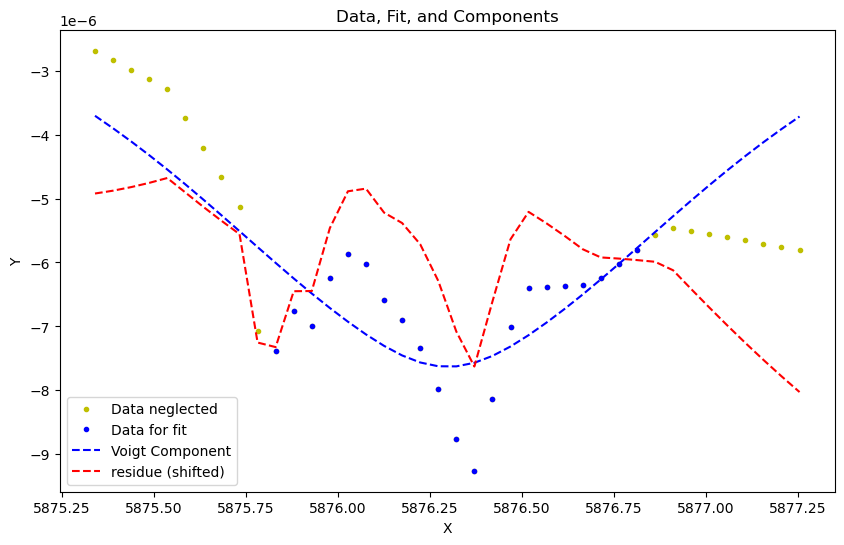

frame 8 at time 4.283333333333303 with param_fit[-1] = (array([-8.59853174e-06,  5.87625227e+03, -6.24524863e-01,  6.59457958e-04]), array([6.20169461e-05, 3.50615706e-02, 7.41477370e-02, 2.13549923e+03])). Here comes the plot:


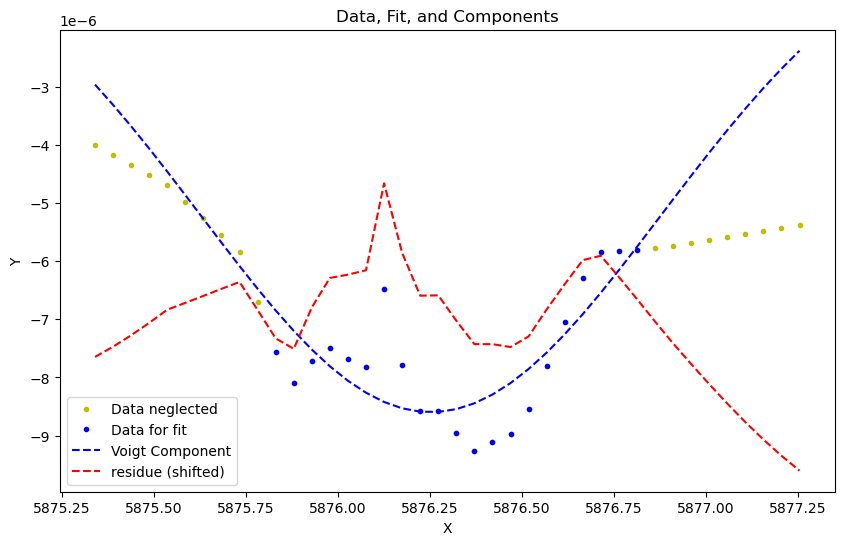

frame 10 at time 4.850000000000023 with param_fit[-1] = (array([-7.43563968e-06,  5.87610394e+03, -7.54029205e-01,  3.36544223e-01]), array([1.76184538e-07, 2.53227931e-02, 1.79233376e-01, 5.30810639e-01])). Here comes the plot:


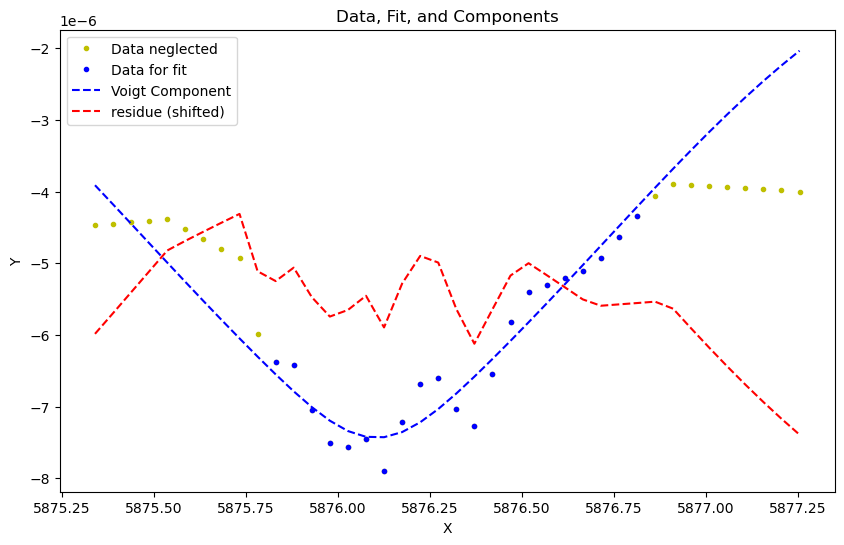

frame 12 at time 5.43333333333328 with param_fit[-1] = (array([-6.26674010e-06,  5.87623781e+03, -4.77025922e-01, -2.08997126e-01]), array([2.21308537e-07, 1.99301841e-02, 1.31618204e-01, 4.06151755e-01])). Here comes the plot:


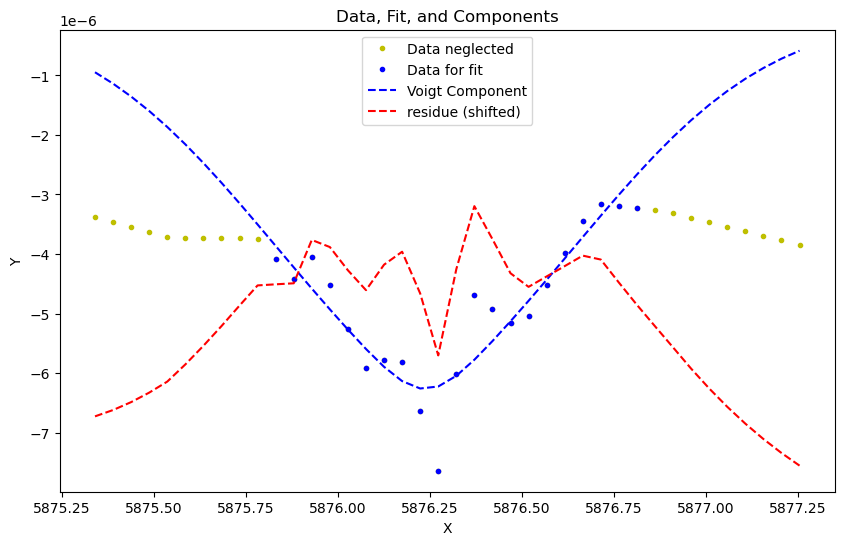

At frame 13 at time 5.716666666666697 the voigt fitting was not succesfull and average guess ([-7.74357903e-06  5.87620445e+03 -3.34483747e-01  1.18255971e-01]) is used as params and as std of params. 
frame 14 at time 6.0 with param_fit[-1] = (array([-3.14828187e-06,  5.87674432e+03,  2.90509735e-03,  1.15936207e-01]), array([1.06204893e-01, 2.00701465e-02, 7.80891162e+04, 3.09165116e-02])). Here comes the plot:


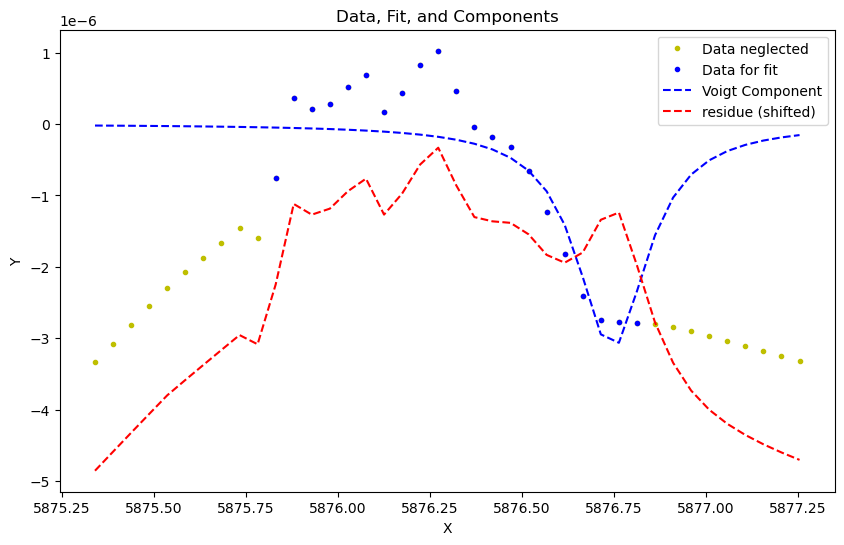

vmax = 3.1488057691184716e-05, vmin = -2.4471860324472134e-05


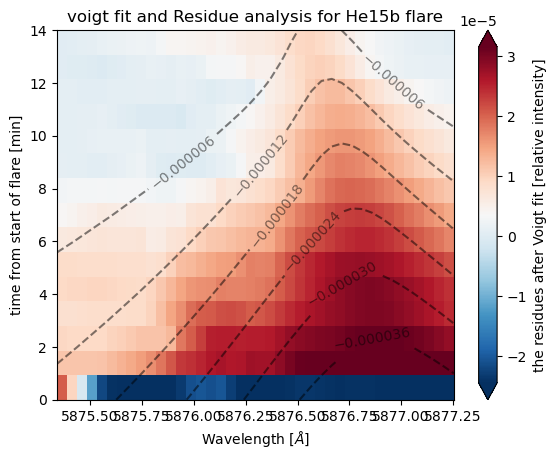

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [7]:
reload(un)
reload(un2)
reload(vf)
lines = [ "He15b"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) 
print(data["TIME_He15b"])
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":2}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-7.04217575e-06,  5.87645793e+03, -2.32074350e-01,  1.18592840e+00]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-9),[], [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

E:\solar flares/data/2017-09-06\use_nessi2.py:288: SyntaxWarning: invalid escape sequence '\H'
  
E:\solar flares/data/2017-09-06\use_nessi2.py:382: SyntaxWarning: invalid escape sequence '\D'
  if seperate_colorbar:
E:\solar flares/data/2017-09-06\use_nessi2.py:488: SyntaxWarning: invalid escape sequence '\{'
  
E:\solar flares/data/2017-09-06\use_nessi2.py:488: SyntaxWarning: invalid escape sequence '\s'
  


dict_keys(['area_theta_CaIR22', 'FOV_CaIR22', 'quiet_sun_CaIR22', 'nessi_CaIR22', 'True_nessi_CaIR22', 'TIME_CaIR22'])


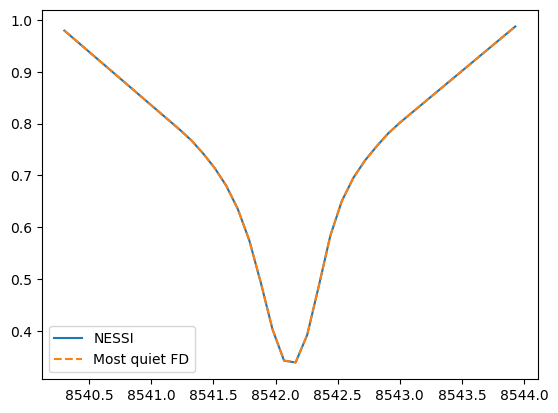

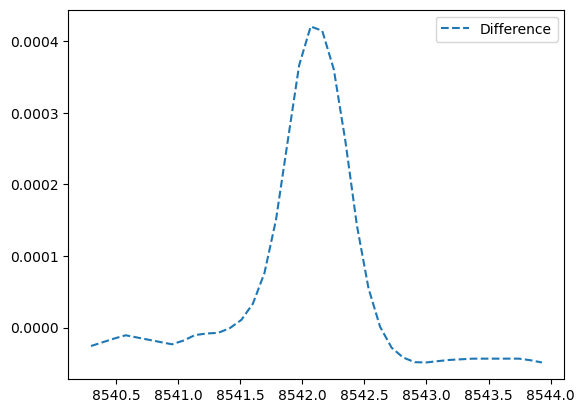

The average is 1.0000151812638085
frame 0 at time 9.866666666666674 with param_fit[-1] = (array([ 4.93284774e-04,  8.54216270e+03, -2.29088138e-01,  2.40654903e-01]), array([1.79864199e-05, 9.26418331e-03, 2.84309456e-02, 3.12752473e-02])). Here comes the plot:


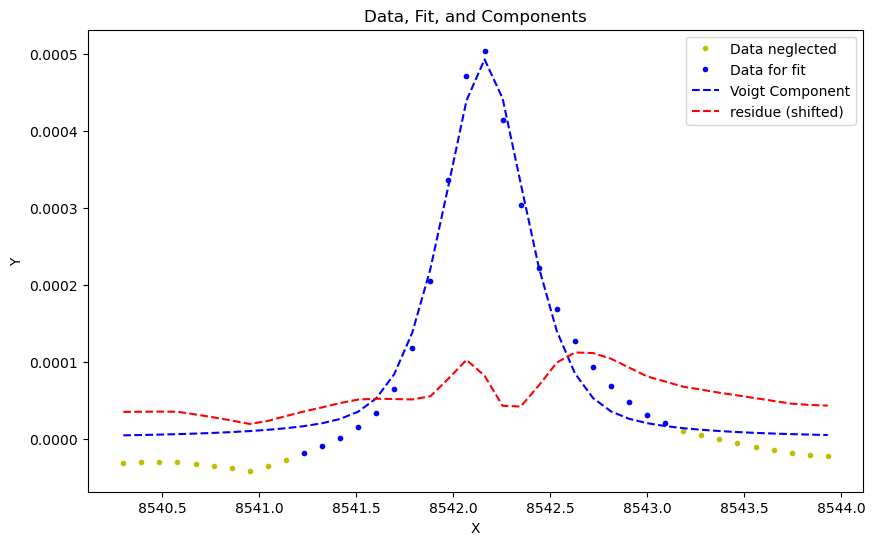

frame 50 at time 27.76666666666665 with param_fit[-1] = (array([1.49864356e-04, 8.54215754e+03, 1.94141037e-01, 1.80525498e-02]), array([9.00766720e-06, 8.63149605e-03, 9.75429920e-03, 8.95236317e-02])). Here comes the plot:


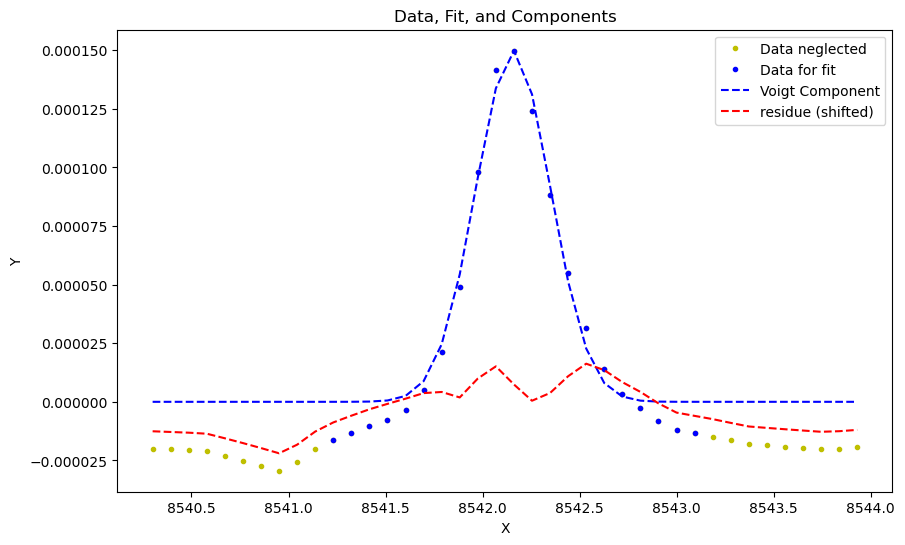

frame 100 at time 45.68333333333334 with param_fit[-1] = (array([ 7.47425771e-05,  8.54215602e+03,  1.96566221e-01, -7.28192991e-02]), array([3.20529124e-06, 7.36819947e-03, 1.12633521e-02, 5.52841004e-02])). Here comes the plot:


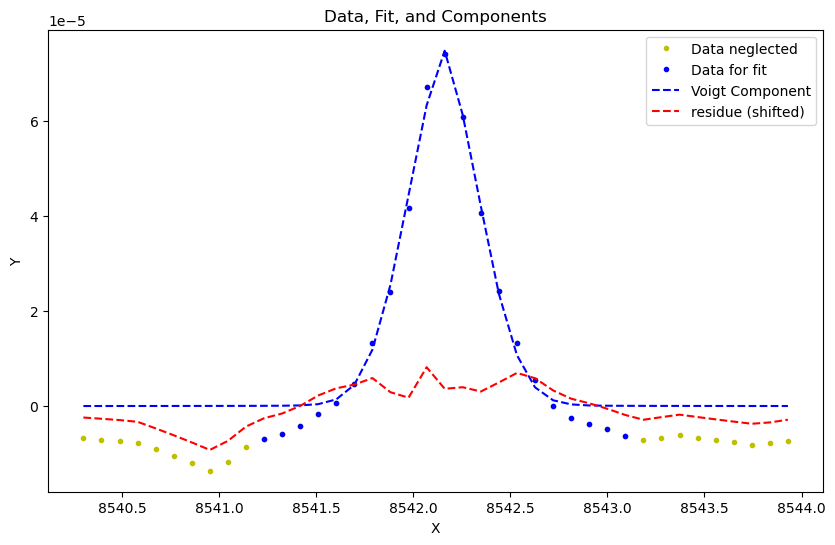

frame 150 at time 63.58333333333337 with param_fit[-1] = (array([-3.00426184e-05,  8.54208792e+03, -1.83936564e-01, -2.05397203e-01]), array([1.12492449e-06, 7.79475069e-03, 2.35818972e-02, 2.10912312e-02])). Here comes the plot:


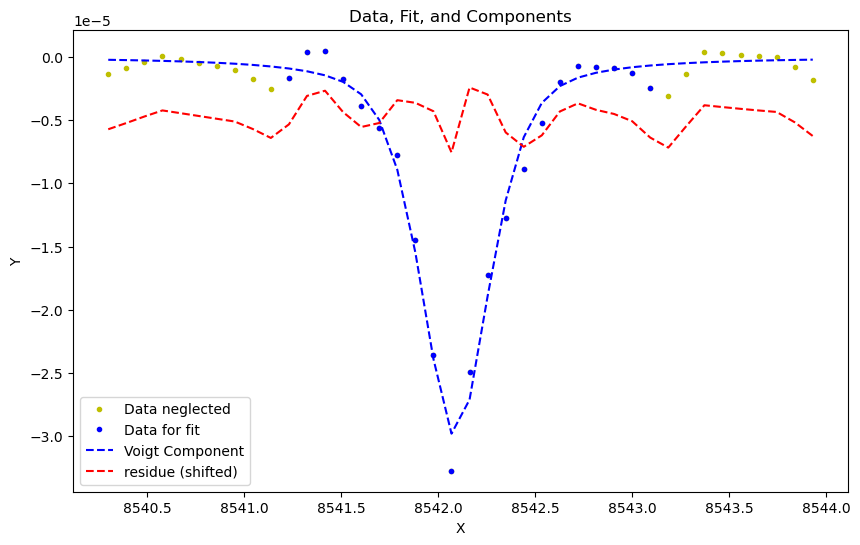

vmax = 2.2253239887451102e-05, vmin = -3.3272565719376254e-05


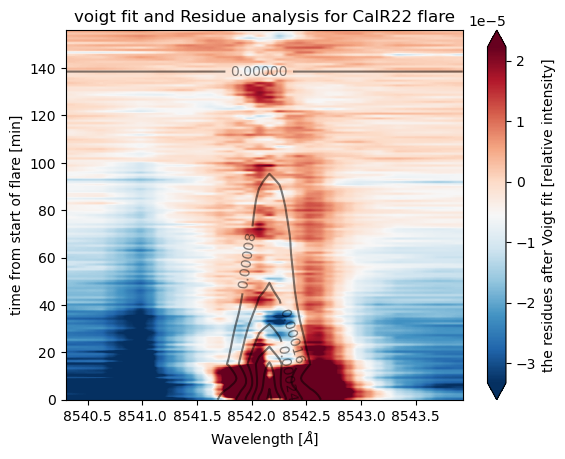

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [19]:
reload(un)
reload(un2)
reload(vf)
lines = [ "CaIR22"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-9),[], [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Ha23a', 'FOV_Ha23a', 'quiet_sun_Ha23a', 'nessi_Ha23a', 'True_nessi_Ha23a', 'TIME_Ha23a', 'area_theta_CaIR23a', 'FOV_CaIR23a', 'quiet_sun_CaIR23a', 'nessi_CaIR23a', 'True_nessi_CaIR23a', 'TIME_CaIR23a', 'area_theta_CaK23a', 'FOV_CaK23a', 'quiet_sun_CaK23a', 'nessi_CaK23a', 'True_nessi_CaK23a', 'TIME_CaK23a', 'area_theta_Hbeta23a', 'FOV_Hbeta23a', 'quiet_sun_Hbeta23a', 'nessi_Hbeta23a', 'True_nessi_Hbeta23a', 'TIME_Hbeta23a', 'area_theta_He23a', 'FOV_He23a', 'quiet_sun_He23a', 'nessi_He23a', 'True_nessi_He23a', 'TIME_He23a'])


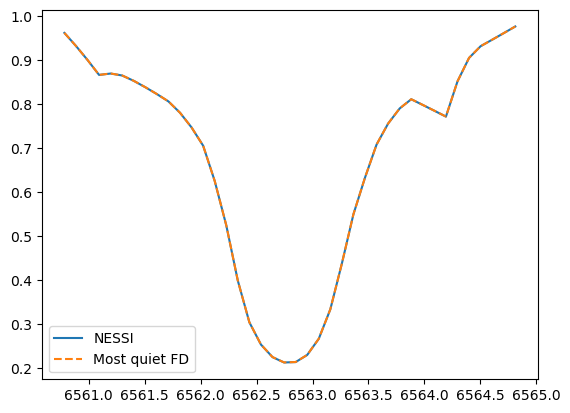

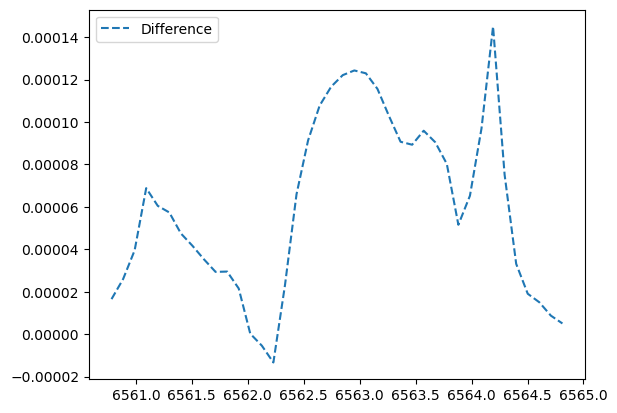

The average is 1.0000042252241197
frame 0 at time 6.56666666666672 with param_fit[-1] = (array([7.66852514e-05, 6.56272122e+03, 3.14659081e-01, 4.96297650e-01]), array([1.69380164e-06, 9.19748754e-03, 4.46292432e-02, 1.64365384e-02])). Here comes the plot:


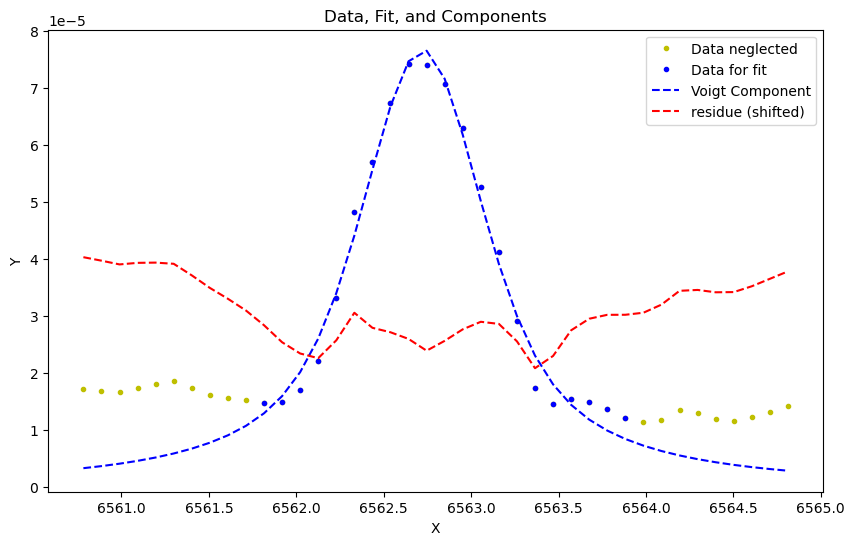

At frame 4 at time 10.133333333333326 the voigt fitting was not succesfull and average guess ([3.68291318e-05 6.56282628e+03 2.98056385e-01 1.89025879e-01]) is used as params and as std of params. 
vmax = 2.3986374826585538e-05, vmin = -2.45579560829697e-05


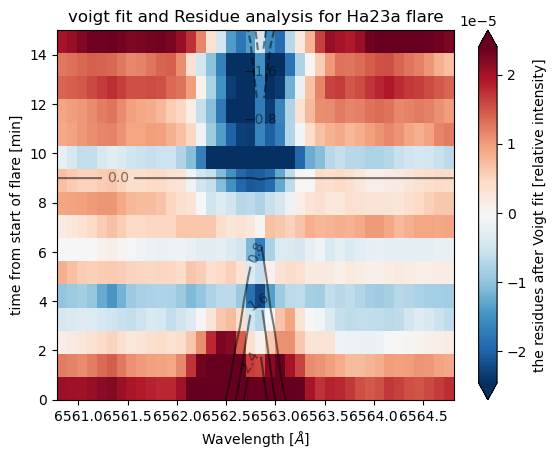

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


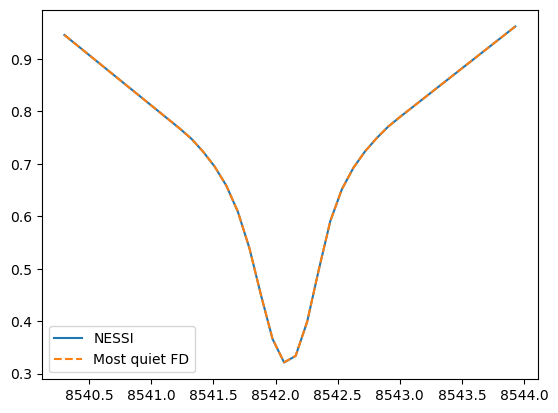

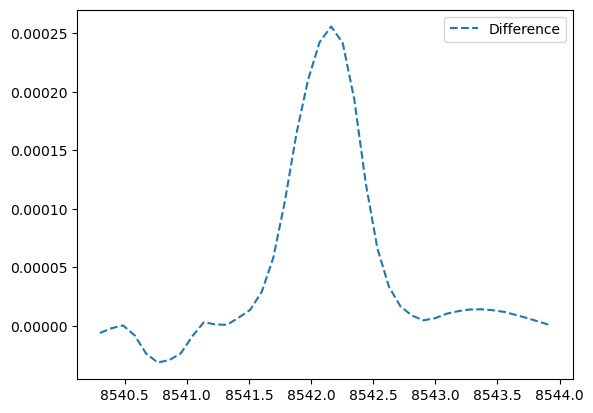

The average is 1.0000013172883206
frame 0 at time 6.2333333333333485 with param_fit[-1] = (array([7.65343314e-05, 8.54208590e+03, 1.34746217e-01, 3.15253464e-01]), array([1.71814542e-06, 5.05127718e-03, 3.63819559e-02, 1.49988968e-02])). Here comes the plot:


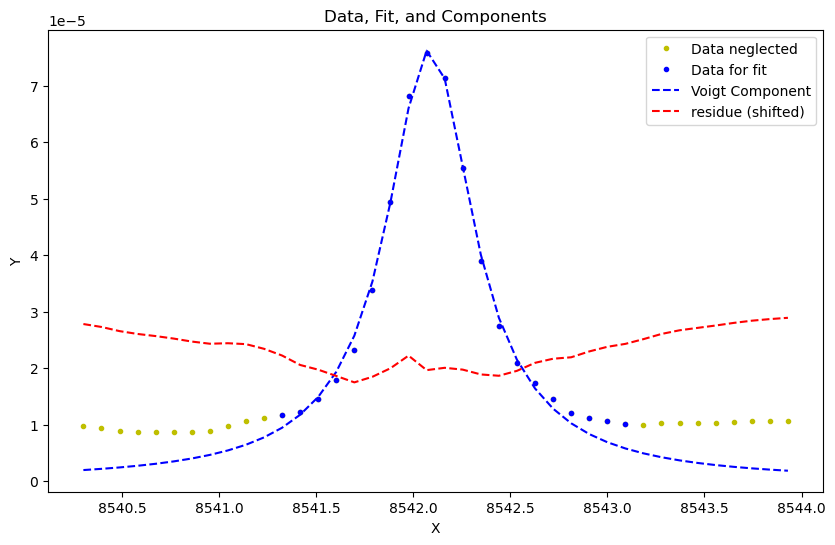

vmax = 1.4416586799425942e-05, vmin = -2.0189538535636366e-05


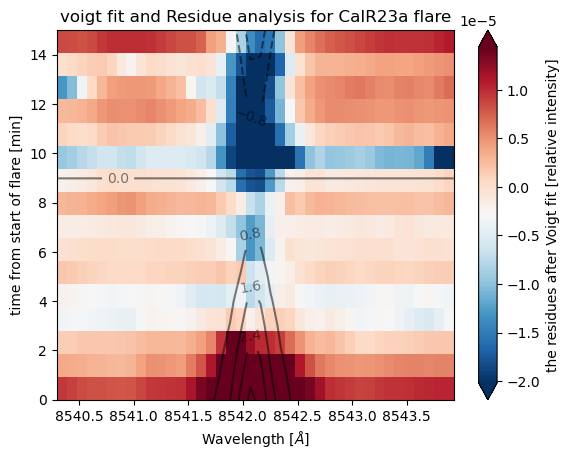

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


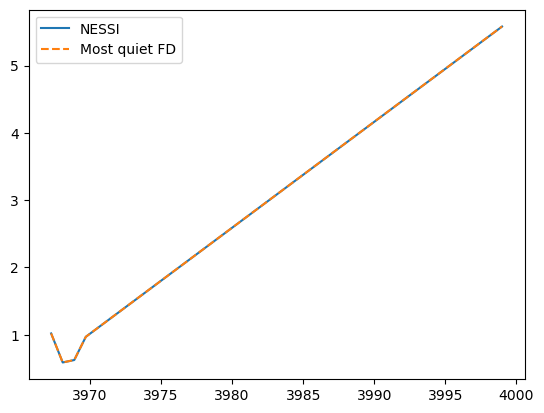

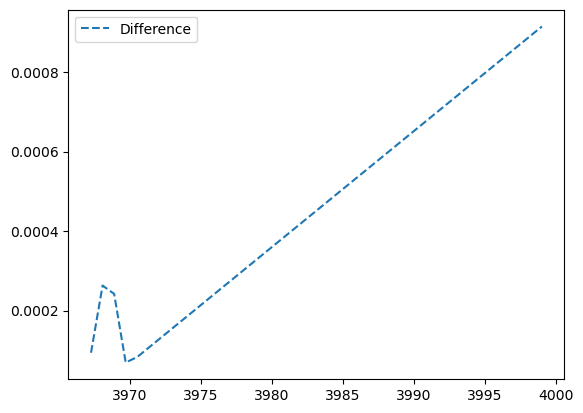

The average is 1.0000076075295574
At frame 0 at time 6.2000000000000455 the voigt fitting was not succesfull and average guess ([ 4.50000000e+00  3.96850000e+03 -2.66732183e-01  2.22840000e-01]) is used as params and as std of params. 
At frame 1 at time 6.616666666666674 the voigt fitting was not succesfull and average guess ([ 4.50000000e+00  3.96850000e+03 -2.66732183e-01  2.22840000e-01]) is used as params and as std of params. 
At frame 2 at time 7.033333333333303 the voigt fitting was not succesfull and average guess ([ 4.50000000e+00  3.96850000e+03 -2.66732183e-01  2.22840000e-01]) is used as params and as std of params. 
At frame 3 at time 7.4500000000000455 the voigt fitting was not succesfull and average guess ([ 4.50000000e+00  3.96850000e+03 -2.66732183e-01  2.22840000e-01]) is used as params and as std of params. 
frame 4 at time 7.866666666666674 with param_fit[-1] = (array([ 4.82112883e-05,  3.96053255e+03, -5.71730767e-01,  1.20940819e+01]), array([1.75038181e+00, 1.04

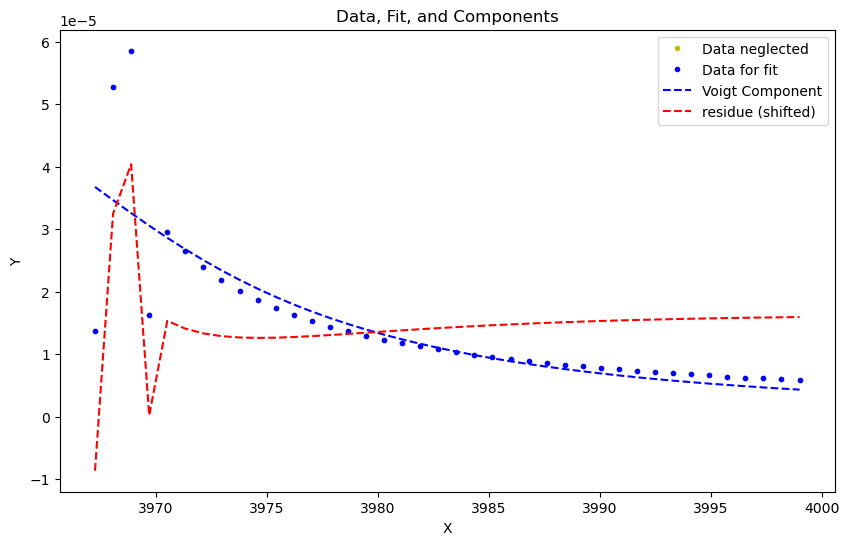

frame 5 at time 8.283333333333303 with param_fit[-1] = (array([ 2.47526206e-05,  3.96903039e+03, -9.08676557e-01,  3.35060279e+00]), array([2.64145876e-06, 4.17131606e-01, 4.63338420e+00, 1.80582671e+00])). Here comes the plot:


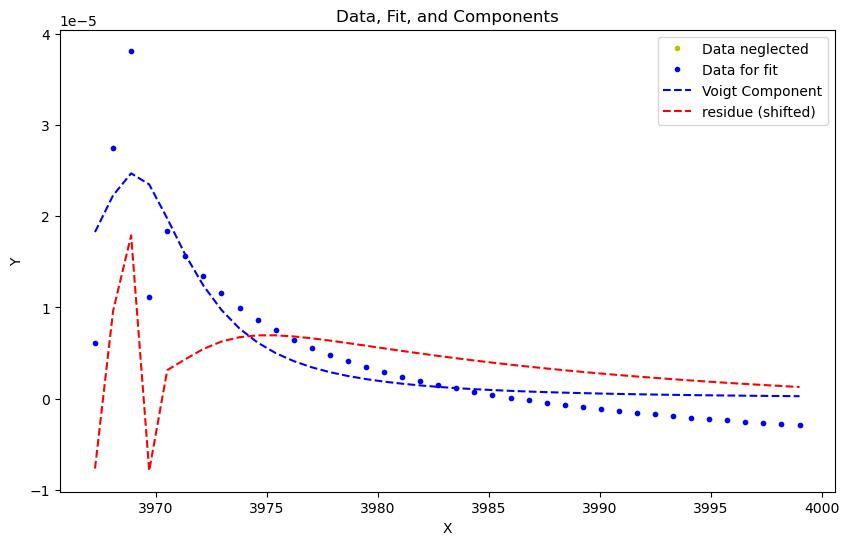

frame 6 at time 8.716666666666697 with param_fit[-1] = (array([ 9.70249976e-05,  3.96849259e+03, -2.14753856e-01, -1.00073182e-02]), array([  13.13003128, 1237.57612501, 8161.2288267 , 1543.10991886])). Here comes the plot:


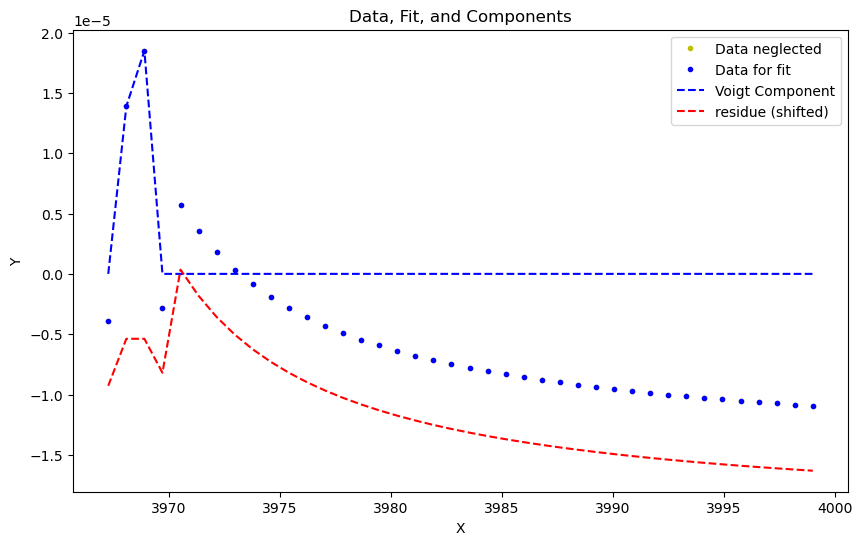

frame 7 at time 9.133333333333326 with param_fit[-1] = (array([ 6.84582890e-06,  3.97045254e+03, -1.99292895e+00, -2.83362748e-01]), array([6.27983448e-06, 1.30033922e+00, 1.62889593e+00, 1.04660753e+01])). Here comes the plot:


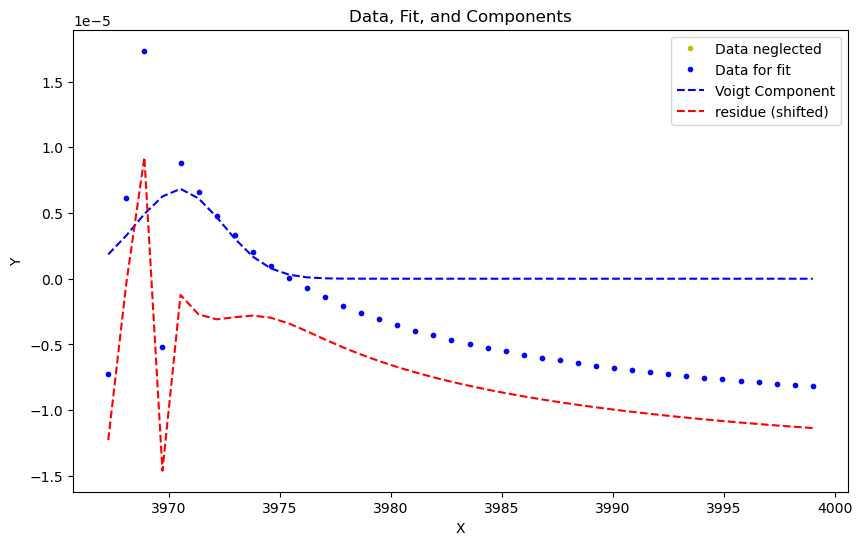

frame 8 at time 9.549999999999955 with param_fit[-1] = (array([-5.58060244e-06,  3.99406906e+03, -1.11215801e+01,  1.45876870e+01]), array([8.23205735e-07, 4.81633132e+00, 2.27594336e+01, 1.34564920e+01])). Here comes the plot:


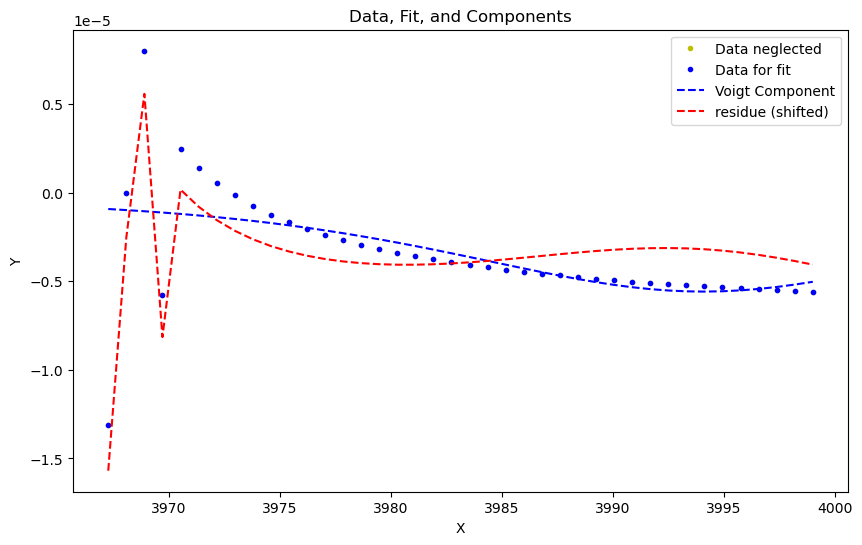

At frame 9 at time 9.950000000000045 the voigt fitting was not succesfull and average guess ([ 7.50028542e-01  3.97184619e+03 -2.51273373e+00  4.99364027e+00]) is used as params and as std of params. 
frame 10 at time 10.383333333333326 with param_fit[-1] = (array([7.95113614e-06, 3.98057252e+03, 8.03001688e-02, 2.60904852e+01]), array([1.60348092e-03, 4.13316617e+00, 1.03168793e+06, 1.27324383e+01])). Here comes the plot:


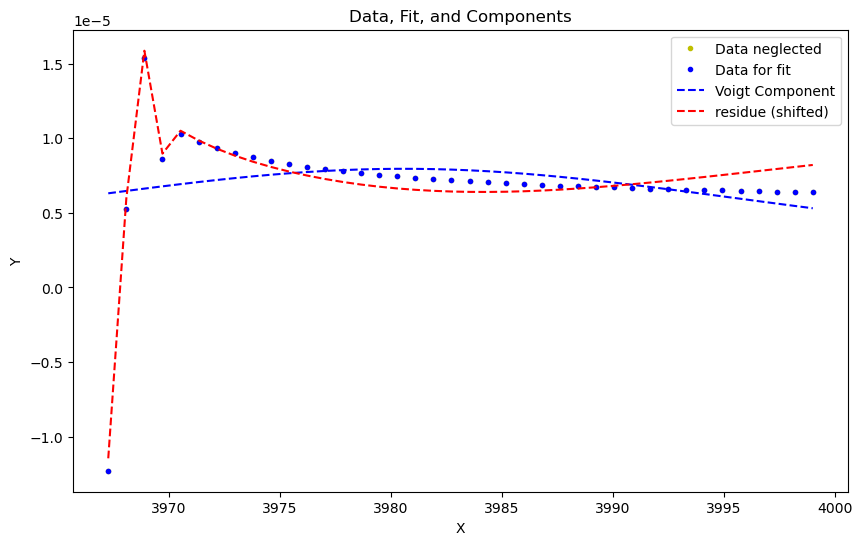

At frame 11 at time 10.783333333333303 the voigt fitting was not succesfull and average guess ([ 7.50016777e-01  3.97935929e+03 -4.10621249e+00  9.19922151e+00]) is used as params and as std of params. 
frame 12 at time 11.216666666666697 with param_fit[-1] = (array([ 8.28009533e-06,  3.97124417e+03, -8.60486029e-01,  3.53726787e+00]), array([6.87047331e-07, 2.84430687e-01, 3.05754603e+00, 1.24048849e+00])). Here comes the plot:


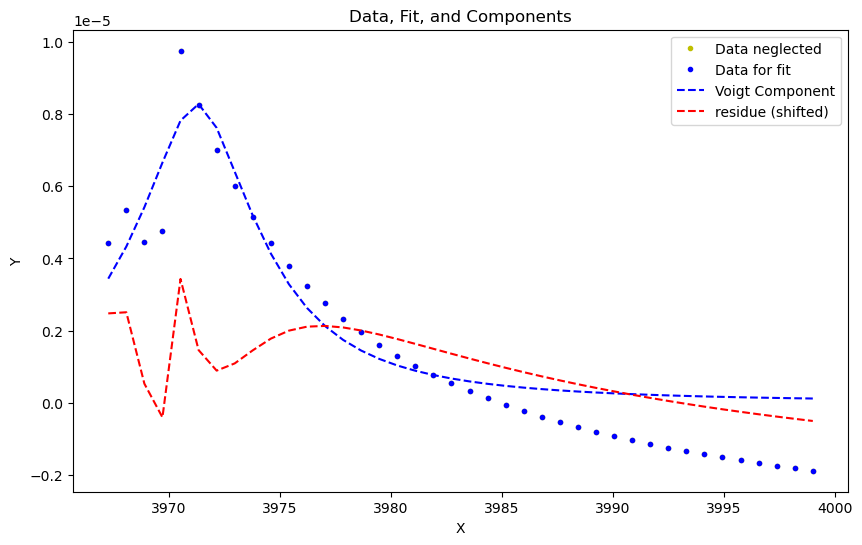

frame 13 at time 11.616666666666674 with param_fit[-1] = (array([-4.17373204e-06,  3.99270157e+03, -1.70862227e+01,  1.91056834e+01]), array([2.95942033e-07, 2.75114219e+00, 5.08728692e+01, 6.99339554e+01])). Here comes the plot:


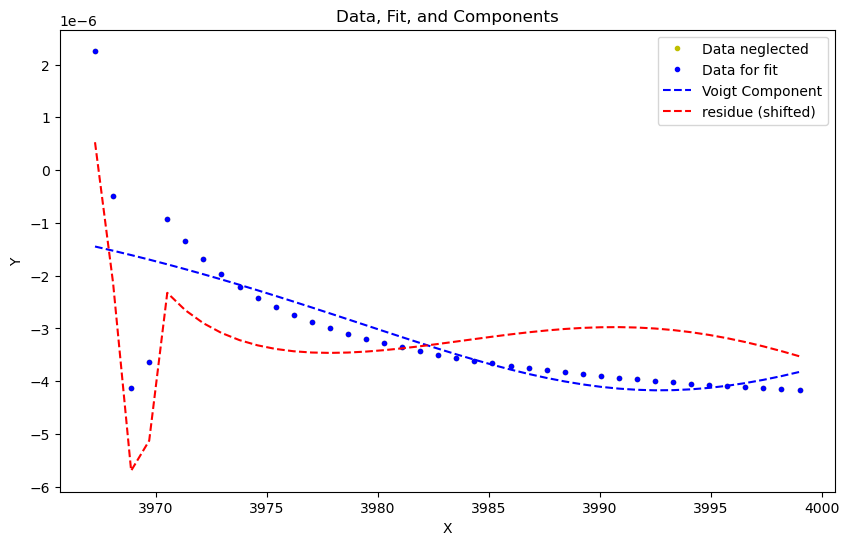

frame 14 at time 12.033333333333303 with param_fit[-1] = (array([-1.74863165e-05,  3.97329010e+03,  5.57119744e+00,  2.72080987e+01]), array([7.81184293e-07, 2.88408406e+00, 2.69938592e+01, 1.34314593e+01])). Here comes the plot:


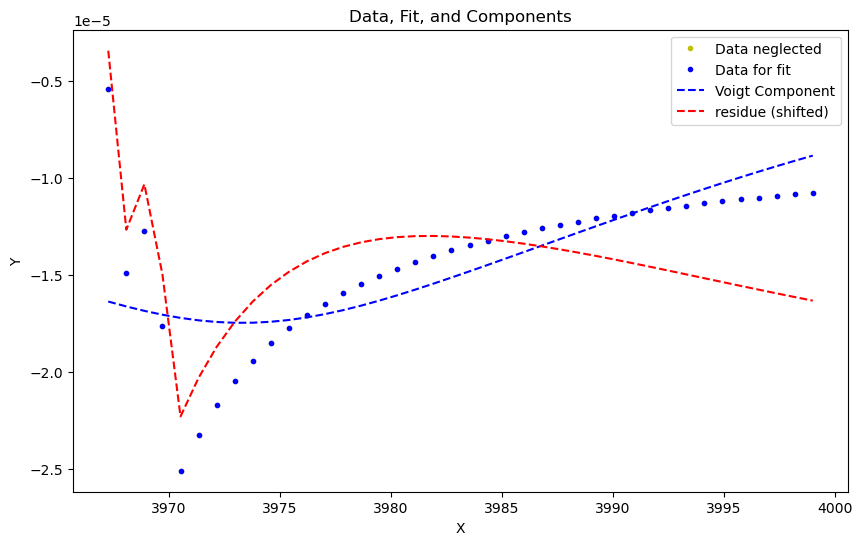

frame 15 at time 12.450000000000045 with param_fit[-1] = (array([-1.18271024e-05,  3.96392566e+03, -1.02971038e+01,  3.74725637e+01]), array([2.55565239e-06, 2.92333727e+01, 1.01538623e+02, 7.26541032e+01])). Here comes the plot:


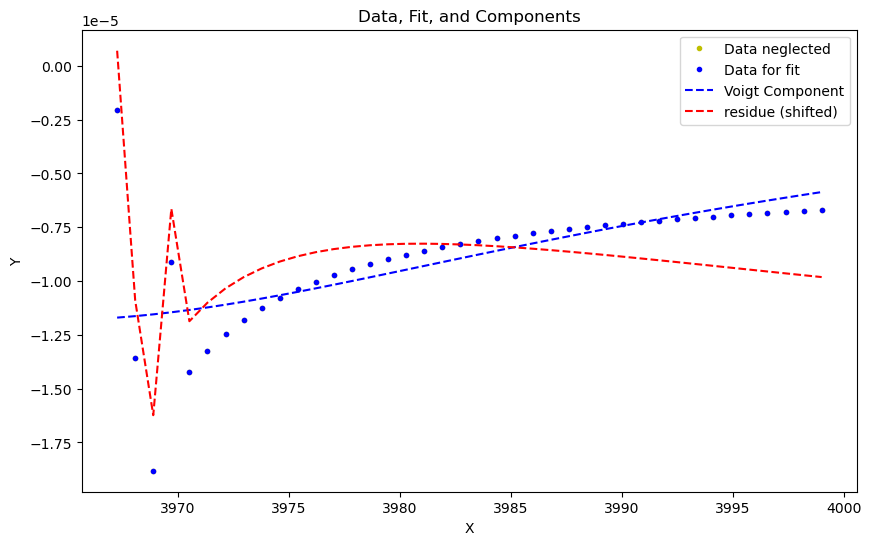

frame 16 at time 12.866666666666674 with param_fit[-1] = (array([ 1.35426265e-05,  3.99077214e+03, -1.86201614e+01,  1.12524512e-02]), array([1.51783740e-05, 1.30161778e+00, 1.61699404e+00, 2.90404488e+04])). Here comes the plot:


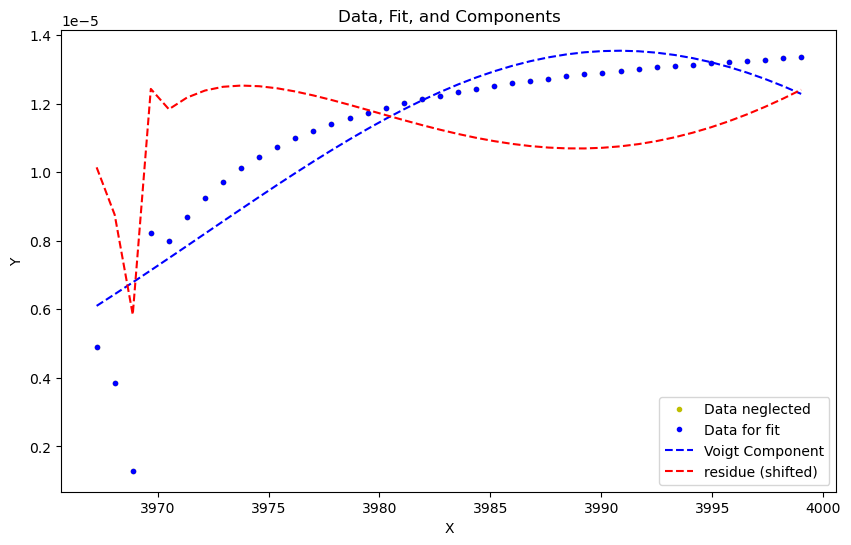

frame 17 at time 13.299999999999955 with param_fit[-1] = (array([ 1.13841583e-05,  3.99198935e+03, -9.59253781e+00,  2.17188203e-02]), array([6.69940129e-04, 3.28518863e+00, 3.35741397e+00, 1.24657146e+05])). Here comes the plot:


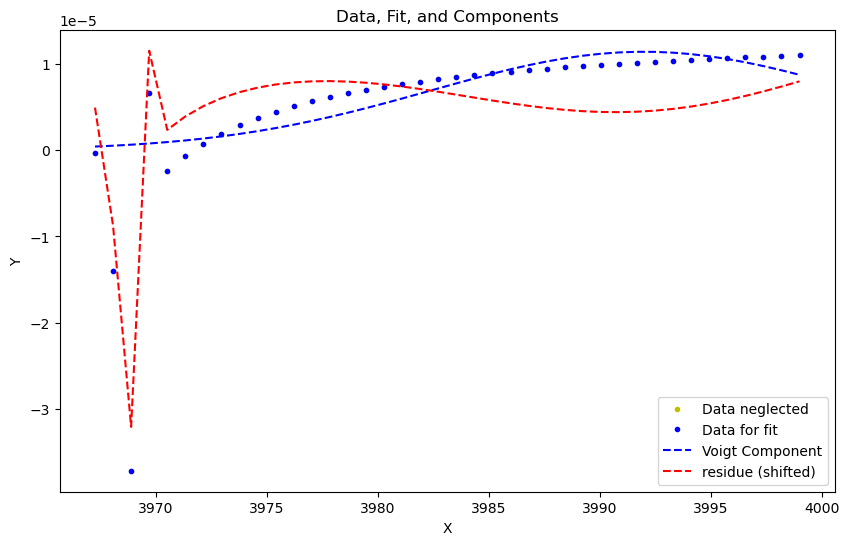

frame 18 at time 13.700000000000045 with param_fit[-1] = (array([ 5.20614885e-06,  3.99373967e+03, -9.02574871e+00,  1.93568034e-02]), array([4.68182427e-04, 3.14344983e+00, 3.01971656e+00, 1.88627093e+05])). Here comes the plot:


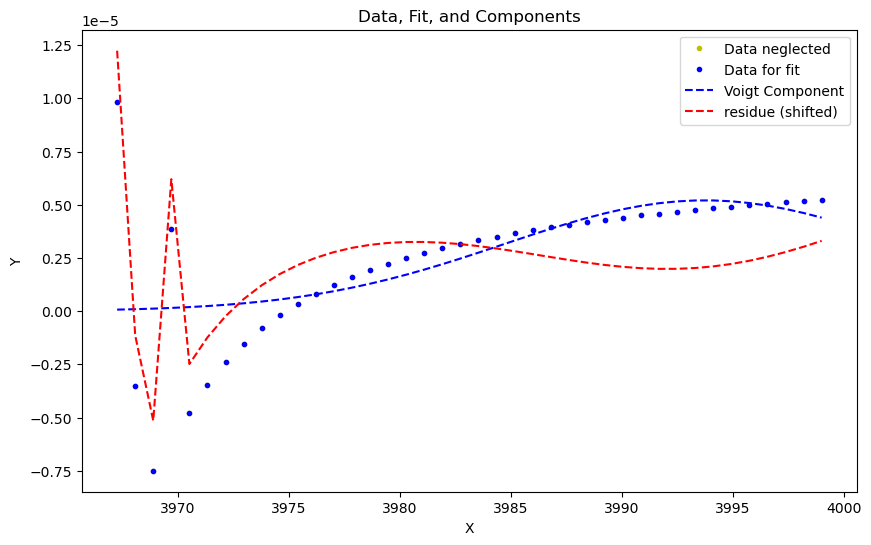

frame 19 at time 14.133333333333326 with param_fit[-1] = (array([-3.49006449e-05,  3.99172325e+03,  1.46315323e+01,  3.09565006e-03]), array([2.72106301e-06, 1.14328661e+00, 1.18457210e+00, 6.19725702e+03])). Here comes the plot:


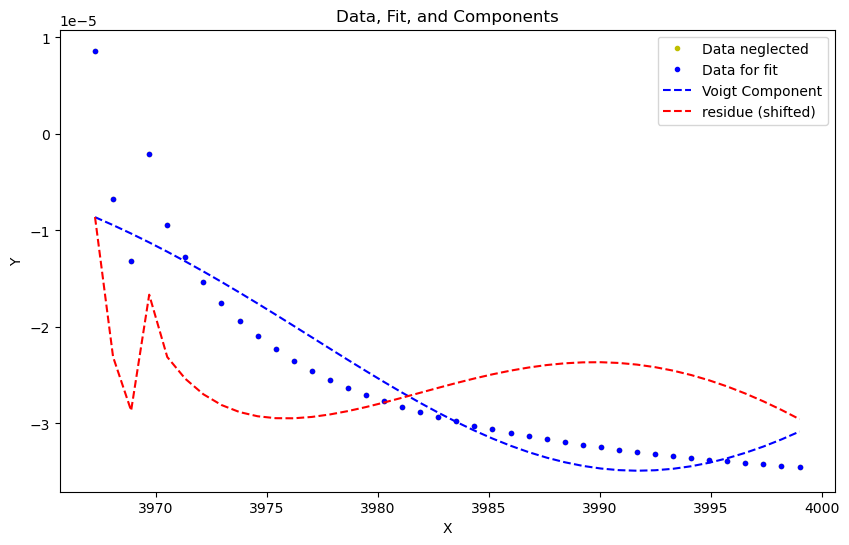

frame 20 at time 14.549999999999955 with param_fit[-1] = (array([ 3.73396817e-06,  3.99292462e+03, -7.81846971e+00, -1.00909295e-01]), array([3.97544478e-05, 7.53669035e+00, 8.01680054e+00, 3.17700242e+03])). Here comes the plot:


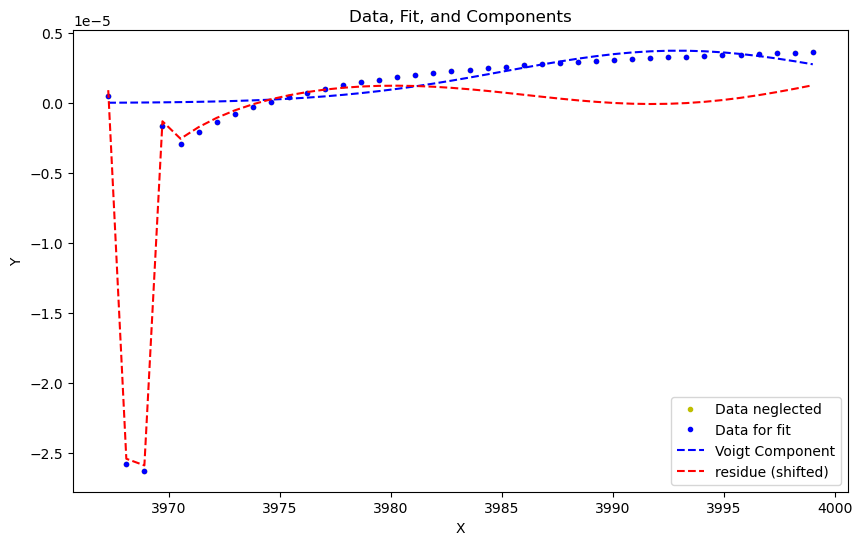

At frame 21 at time 14.966666666666697 the voigt fitting was not succesfull and average guess ([ 7.49999828e-01  3.98827484e+03 -5.11535292e+00  2.95590717e-02]) is used as params and as std of params. 
frame 22 at time 15.383333333333326 with param_fit[-1] = (array([-9.38514511e-06,  3.96993543e+03, -2.90609605e+00, -1.05145982e+01]), array([1.48799693e-06, 2.86448291e+00, 2.24948248e+01, 8.93426816e+00])). Here comes the plot:


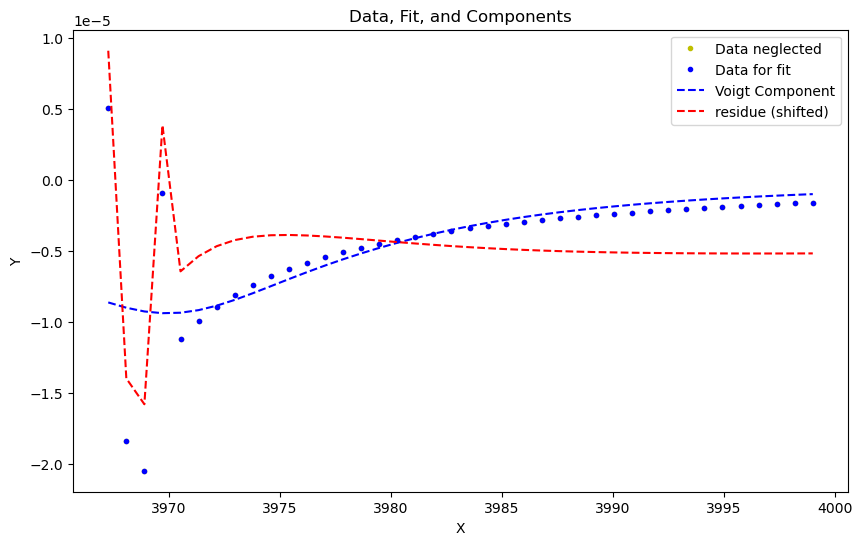

frame 23 at time 15.799999999999955 with param_fit[-1] = (array([ 2.91808644e-06,  3.99120120e+03, -8.14004298e+00,  4.62565750e-02]), array([1.60825676e-04, 7.71749962e+00, 8.73507415e+00, 3.95571806e+04])). Here comes the plot:


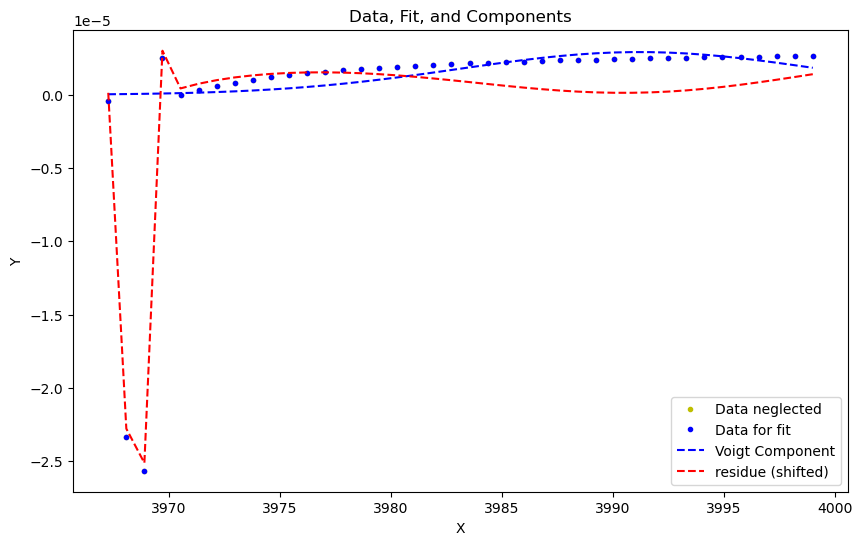

frame 24 at time 16.216666666666697 with param_fit[-1] = (array([ 1.08113909e-05,  3.99307833e+03,  2.43068978e-02, -1.22619680e+01]), array([4.17782869e-03, 2.29005151e+00, 6.63315236e+05, 3.42344109e+00])). Here comes the plot:


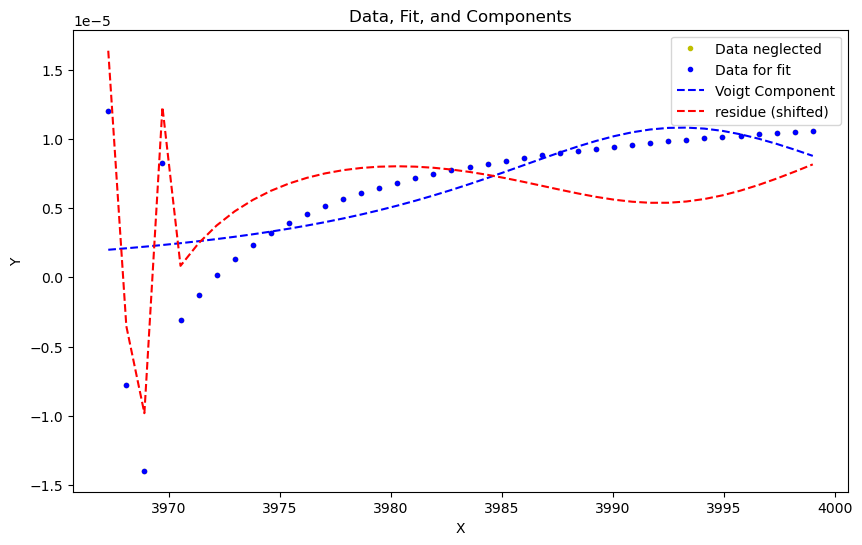

frame 25 at time 16.616666666666674 with param_fit[-1] = (array([ 1.36271695e-05,  3.99237899e+03, -1.27971494e+01,  4.62056217e-04]), array([inf, inf, inf, inf])). Here comes the plot:


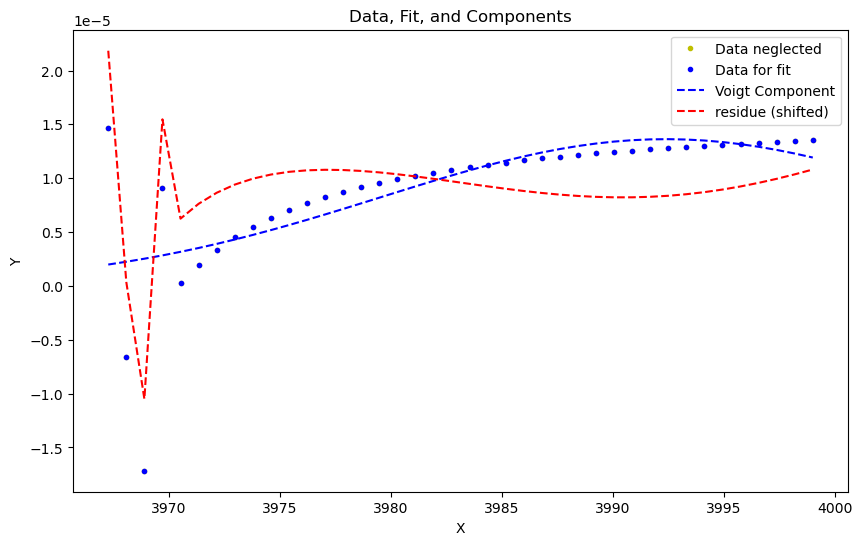

frame 26 at time 17.033333333333303 with param_fit[-1] = (array([ 1.56640175e-05,  3.99213433e+03, -1.76978141e+01, -2.37999289e+01]), array([1.01759300e-06, 3.86075399e+00, 1.83769384e+02, 1.51757124e+02])). Here comes the plot:


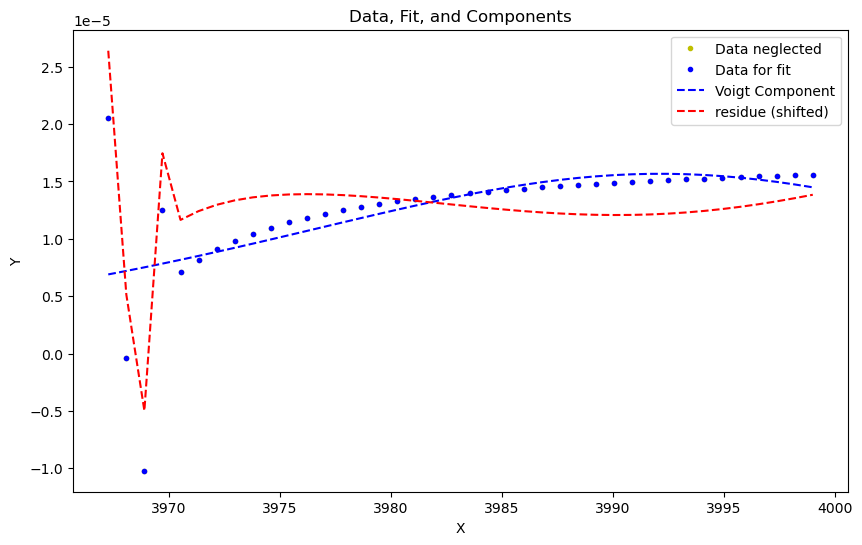

frame 27 at time 17.450000000000045 with param_fit[-1] = (array([ 1.41536693e-05,  3.99151926e+03, -1.48442978e+01, -1.65781468e+01]), array([1.49176044e-06, 2.80424149e+00, 5.91507377e+01, 7.76611877e+01])). Here comes the plot:


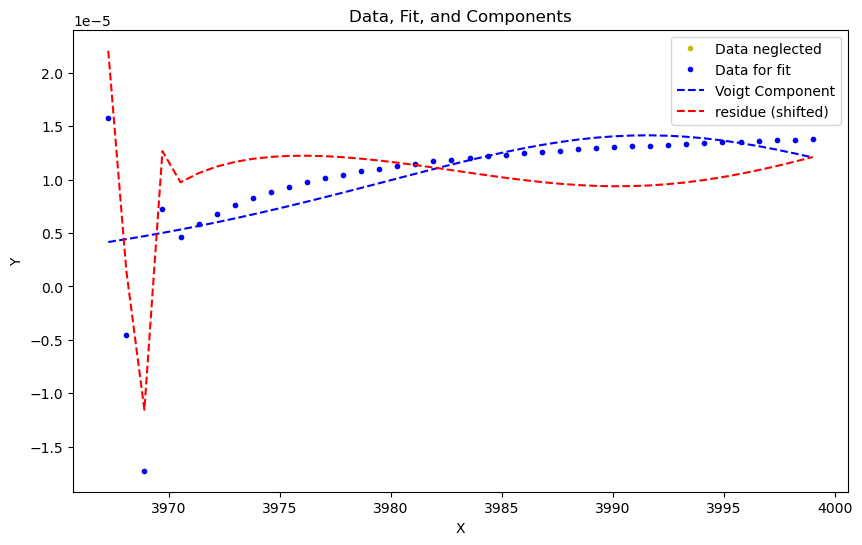

frame 28 at time 17.866666666666674 with param_fit[-1] = (array([ 1.47851024e-05,  3.99284715e+03, -1.11269910e+01, -8.93436097e-03]), array([6.31403718e-05, 2.14071652e+00, 1.98091884e+00, 5.59502630e+04])). Here comes the plot:


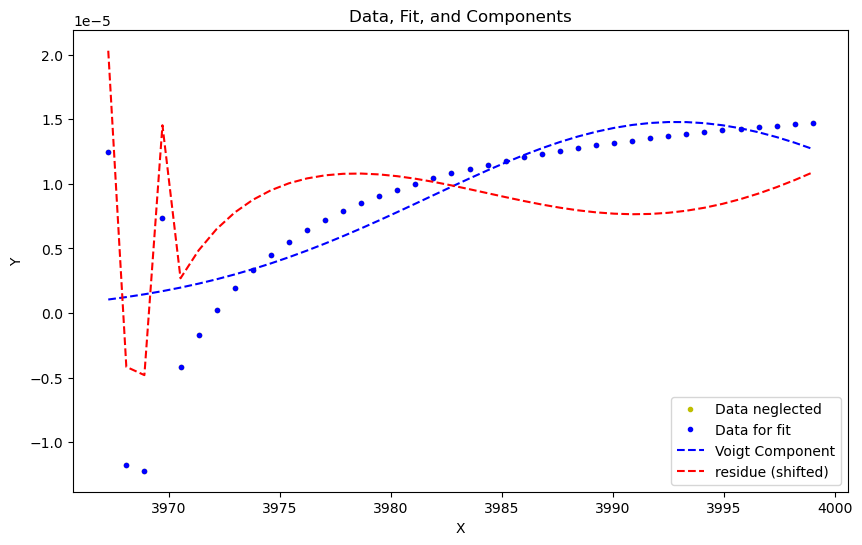

frame 29 at time 18.283333333333303 with param_fit[-1] = (array([ 1.85396495e-05,  3.99258892e+03, -1.18592711e+01, -7.57688872e-03]), array([1.34044639e-04, 2.10855511e+00, 1.96496352e+00, 6.74625116e+04])). Here comes the plot:


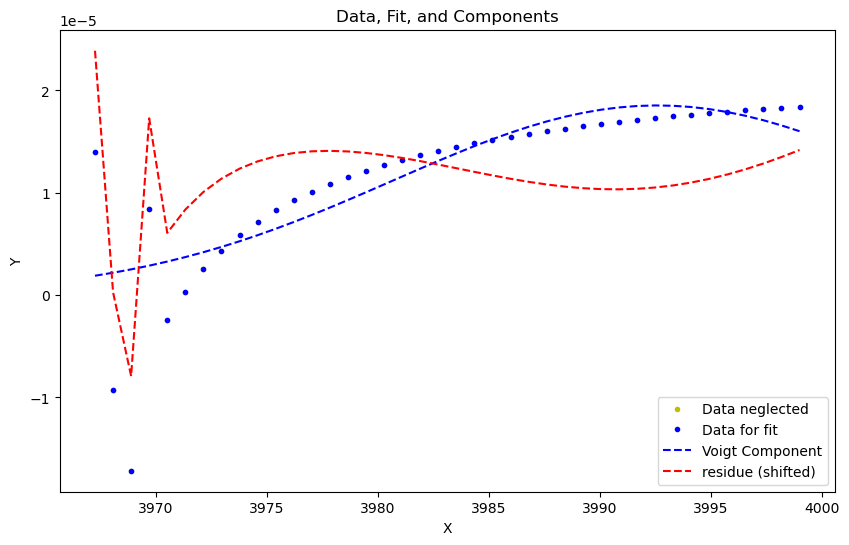

frame 30 at time 18.700000000000045 with param_fit[-1] = (array([ 2.42041740e-05,  3.99203867e+03, -1.55234355e+01,  1.77996146e+01]), array([1.42483978e-06, 1.86522960e+00, 4.30358674e+01, 5.30339995e+01])). Here comes the plot:


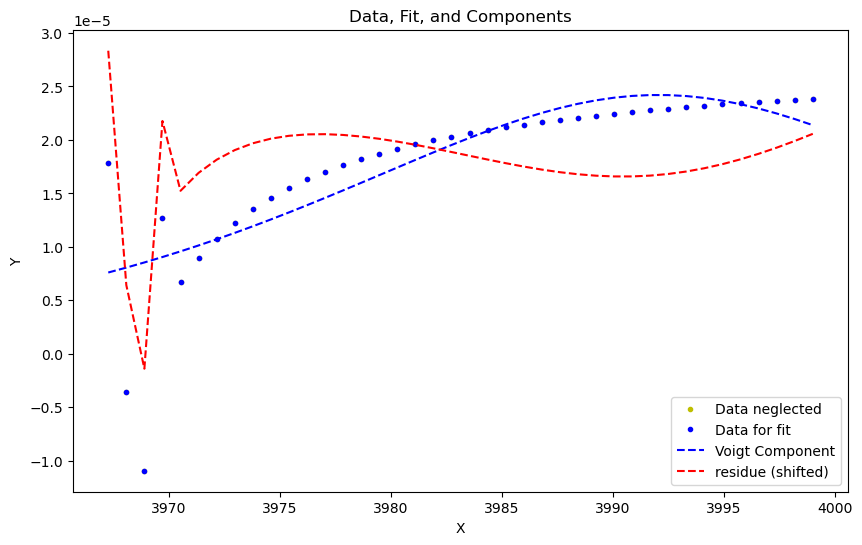

frame 31 at time 19.116666666666674 with param_fit[-1] = (array([ 2.47474627e-05,  3.99346227e+03, -1.59374711e+01, -1.07999409e-02]), array([1.87043109e-04, 2.66038422e+00, 2.52085478e+00, 7.10010102e+04])). Here comes the plot:


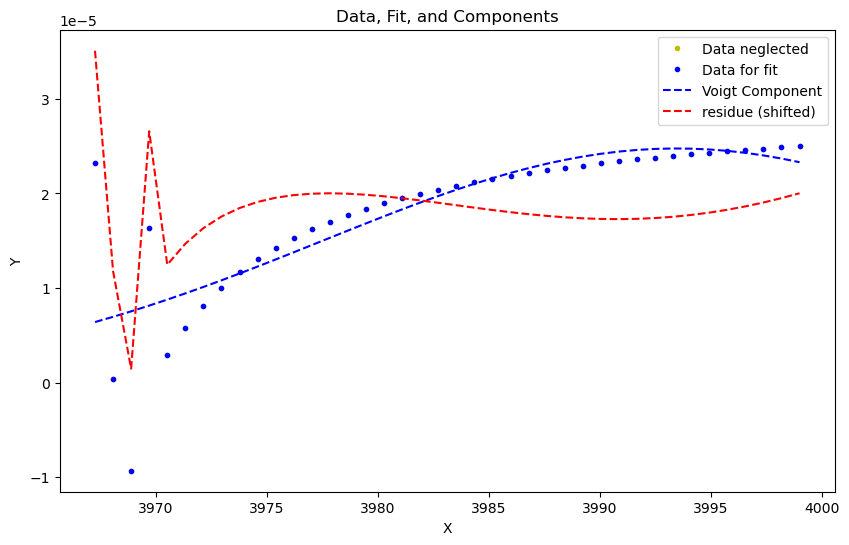

frame 32 at time 19.533333333333303 with param_fit[-1] = (array([ 2.98586853e-05,  3.99310712e+03, -1.16931571e+01, -1.38536633e-02]), array([6.21602438e-04, 2.02214065e+00, 1.83920182e+00, 1.03032591e+05])). Here comes the plot:


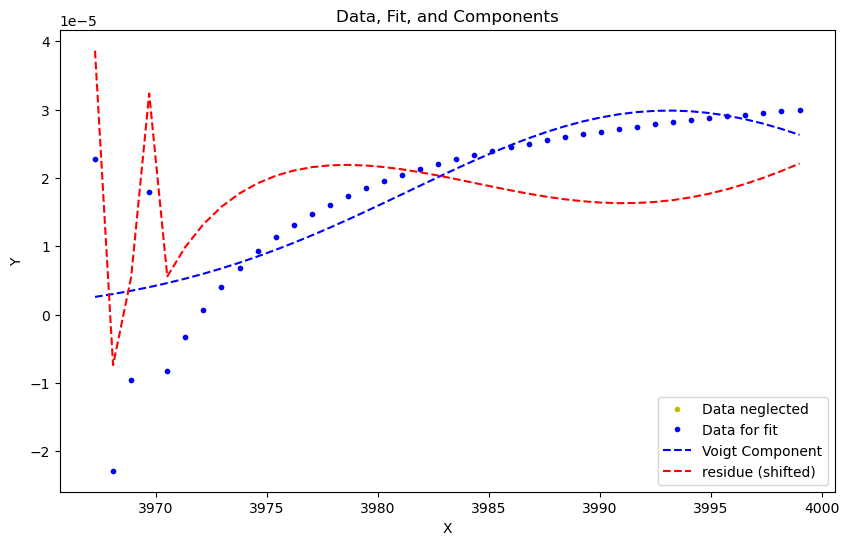

frame 33 at time 19.950000000000045 with param_fit[-1] = (array([ 3.30810385e-05,  3.99154397e+03, -2.57432932e+01, -5.56765597e-04]), array([inf, inf, inf, inf])). Here comes the plot:


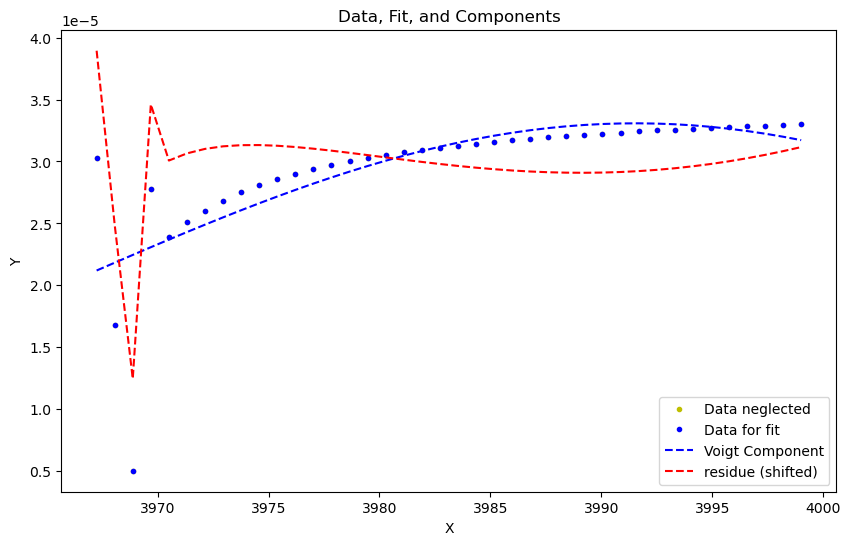

vmax = 1.0383686644282369e-05, vmin = -1.8232562331170528


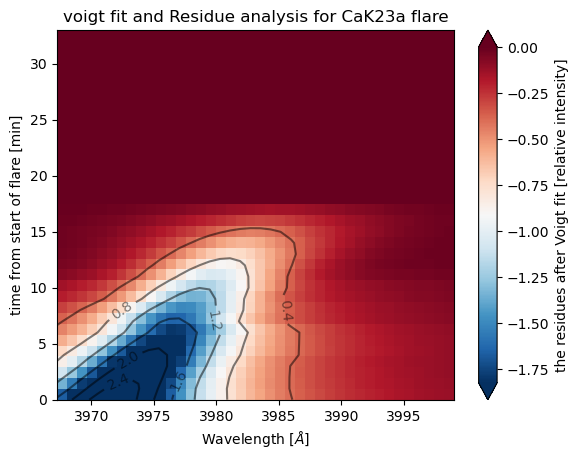

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


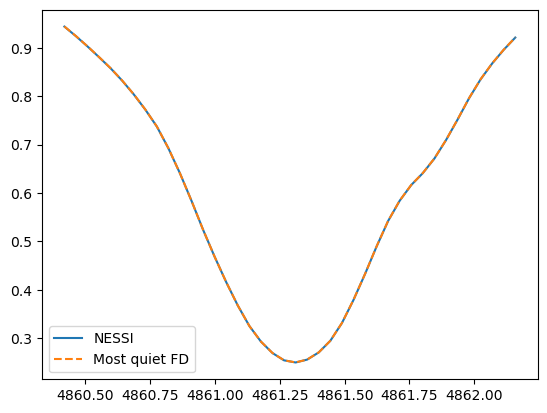

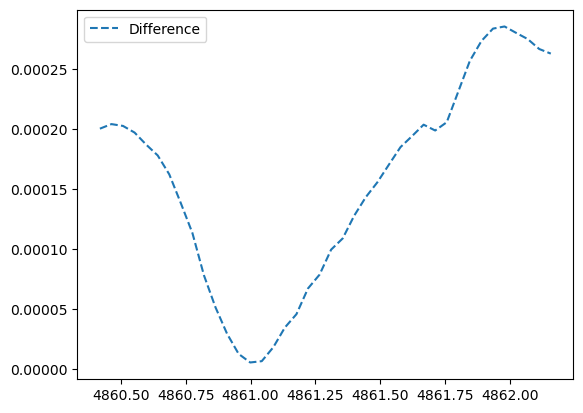

The average is 1.0000077296971417
frame 0 at time 6.383333333333326 with param_fit[-1] = (array([1.28579124e-04, 4.86127536e+03, 1.39839804e-01, 3.73706591e-01]), array([4.69666571e-06, 9.26199237e-03, 9.23851851e-02, 3.98334129e-02])). Here comes the plot:


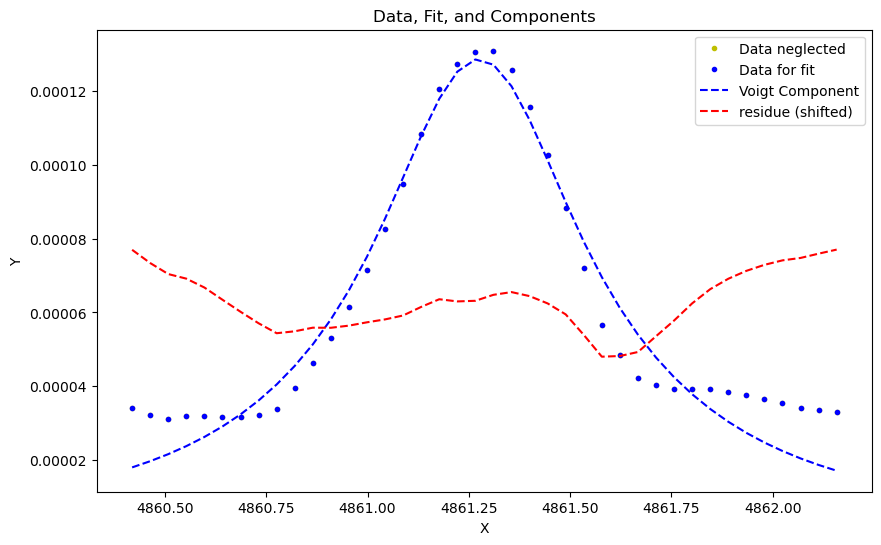

At frame 9 at time 10.133333333333326 the voigt fitting was not succesfull and average guess ([9.25684416e-02 4.86129717e+03 2.21461339e-01 1.17721342e-01]) is used as params and as std of params. 
At frame 12 at time 11.399999999999977 the voigt fitting was not succesfull and average guess ([9.25562567e-02 4.86122321e+03 2.86573968e-01 3.26010383e-01]) is used as params and as std of params. 
At frame 16 at time 13.049999999999955 the voigt fitting was not succesfull and average guess ([9.25423912e-02 4.86118442e+03 4.74805748e-01 4.96044414e-01]) is used as params and as std of params. 
vmax = 3.150452897733768e-05, vmin = -1.9092833164215915e-05


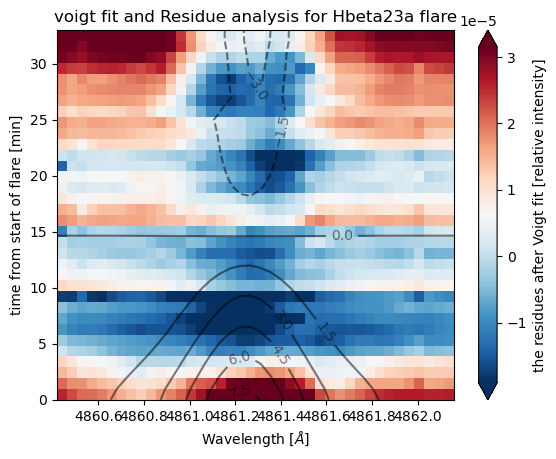

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


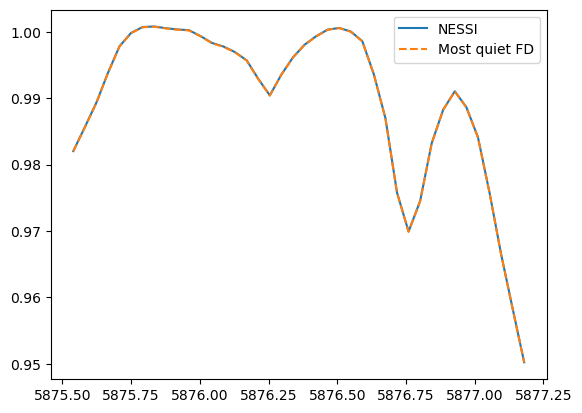

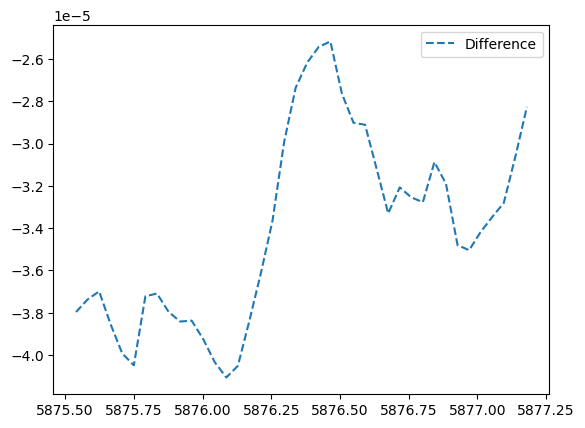

The average is 1.0000084132742761
At frame 0 at time 6.7999999999999545 the voigt fitting was not succesfull and average guess ([-8.41204361e-06  5.87614596e+03 -1.10863891e-01  8.69928093e-05]) is used as params and as std of params. 
At frame 3 at time 9.483333333333348 the voigt fitting was not succesfull and average guess ([-6.63136157e-06  5.87656538e+03 -6.42470028e-01 -3.84509236e-01]) is used as params and as std of params. 
At frame 7 at time 13.049999999999955 the voigt fitting was not succesfull and average guess ([-6.41788593e-06  5.87697027e+03 -7.51732206e-01 -3.60042635e-01]) is used as params and as std of params. 
vmax = 2.982909854033692e-05, vmin = -1.2068049989668275e-05


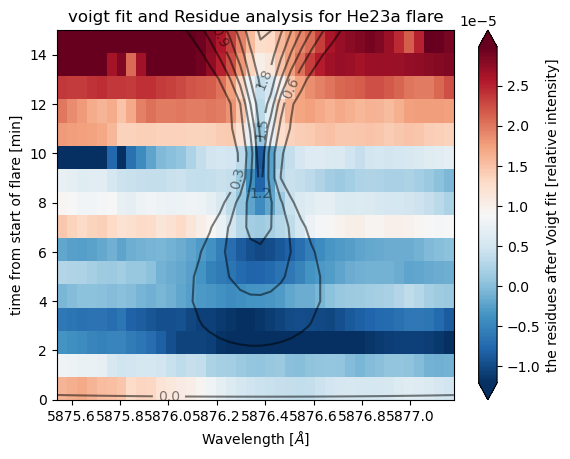

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [17]:
reload(un)
reload(un2)
reload(vf)
lines = ["Ha23a", "CaIR23a", "CaK23a", "Hbeta23a", "He23a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':50, 'Hbeta':200,  "CaK":1, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-9),[], [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

E:\solar flares/data/2017-09-06\use_nessi2.py:282: SyntaxWarning: invalid escape sequence '\H'
  time = np.arange(np.shape(flarerange)[0]) * cadence
E:\solar flares/data/2017-09-06\use_nessi2.py:376: SyntaxWarning: invalid escape sequence '\D'
  ax.set_title(decorations['title'])
E:\solar flares/data/2017-09-06\use_nessi2.py:482: SyntaxWarning: invalid escape sequence '\{'
  cols = len(names_of_lines_list)
E:\solar flares/data/2017-09-06\use_nessi2.py:482: SyntaxWarning: invalid escape sequence '\s'
  cols = len(names_of_lines_list)


dict_keys(['area_theta_Fe21', 'FOV_Fe21', 'quiet_sun_Fe21', 'nessi_Fe21', 'True_nessi_Fe21', 'TIME_Fe21', 'area_theta_CaIR21', 'FOV_CaIR21', 'quiet_sun_CaIR21', 'nessi_CaIR21', 'True_nessi_CaIR21', 'TIME_CaIR21'])
Assuming that Fe21 is spectral line Fe6173.


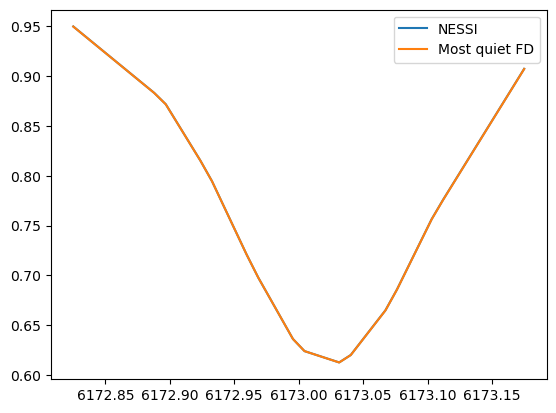

The average is 0.9999967353743194
At frame 0 at time 2.8833333333333258 the voigt fitting was not succesfull and average guess ([ 4.13090273e-02  6.17281060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 1 at time 3.2000000000000455 the voigt fitting was not succesfull and average guess ([ 4.13090273e-02  6.17281060e+03 -1.55441909e-03  4.25981451e-02]) is used as params and as std of params. 
At frame 3 at time 3.8333333333333712 the voigt fitting was not succesfull and average guess ([ 3.17683591e-02  6.17282105e+03 -3.27609635e-03  3.19486736e-02]) is used as params and as std of params. 
At frame 4 at time 4.149999999999977 the voigt fitting was not succesfull and average guess ([ 2.60439582e-02  6.17282732e+03 -4.30910270e-03  2.55589907e-02]) is used as params and as std of params. 
At frame 5 at time 4.4833333333333485 the voigt fitting was not succesfull and average guess ([ 2.22276909e-02  6.17283150e+03 -4.99777361e-03  2.12992021e-02]

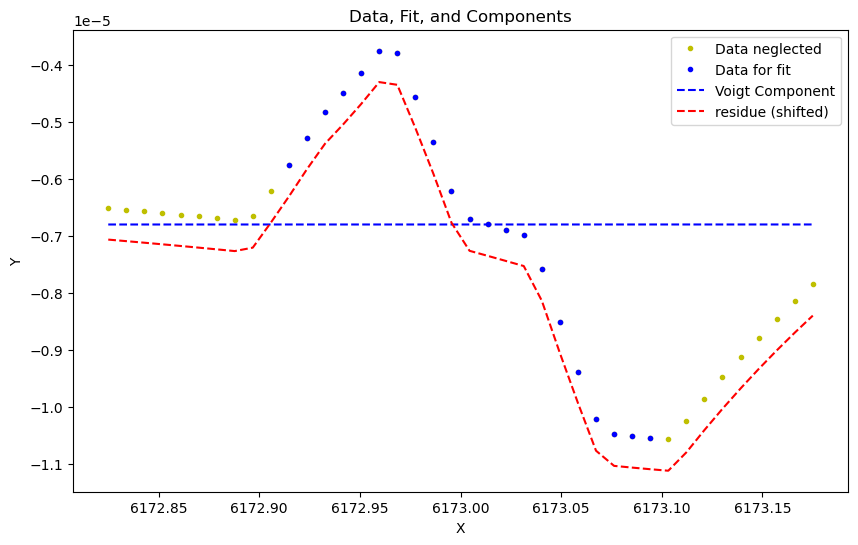

At frame 28 at time 11.833333333333371 the voigt fitting was not succesfull and average guess ([-2.88079414e+01 -4.72595009e+03  4.37152141e-03  5.86540212e+00]) is used as params and as std of params. 
frame 30 at time 12.466666666666697 with param_fit[-1] = (array([-4.47186373e+01, -7.37233837e+03, -5.85072943e-03,  7.07496067e+00]), array([1.51578994e+08, 2.95835789e+07, 1.68523802e+04, 1.19925705e+07])). Here comes the plot:


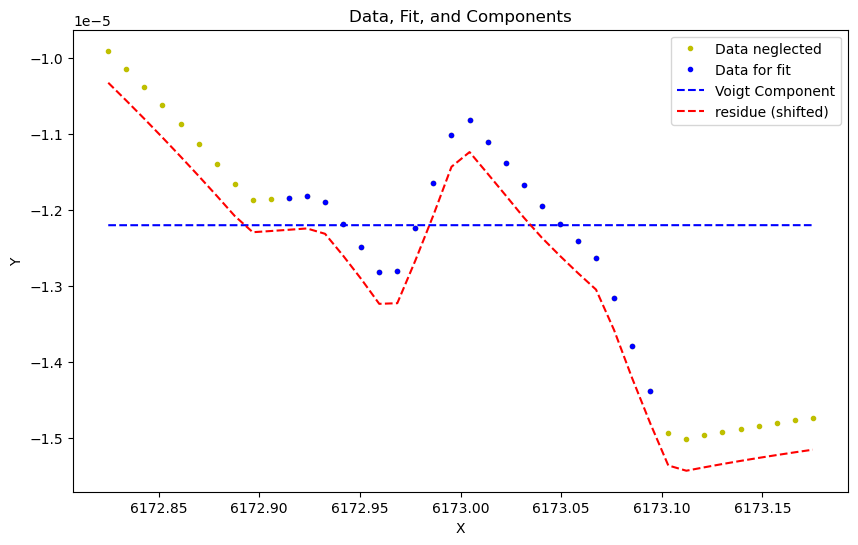

frame 40 at time 15.666666666666629 with param_fit[-1] = (array([-1.31231423e+05, -3.11887986e+08, -1.21992528e+04,  6.21121379e+03]), array([1.97800225e+12, 3.62304734e+15, 3.14620197e+11, 1.05257660e+11])). Here comes the plot:


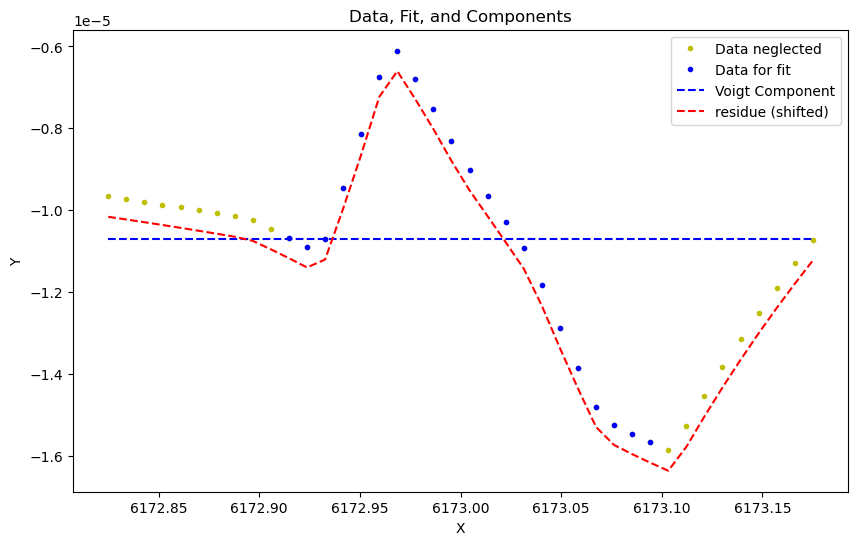

frame 50 at time 18.866666666666674 with param_fit[-1] = (array([ 1.63773833e+10,  4.20303782e+12,  7.94426123e+07, -1.86854500e+06]), array([5.86324915e+17, 1.24780531e+20, 3.61452582e+15, 4.76411418e+13])). Here comes the plot:


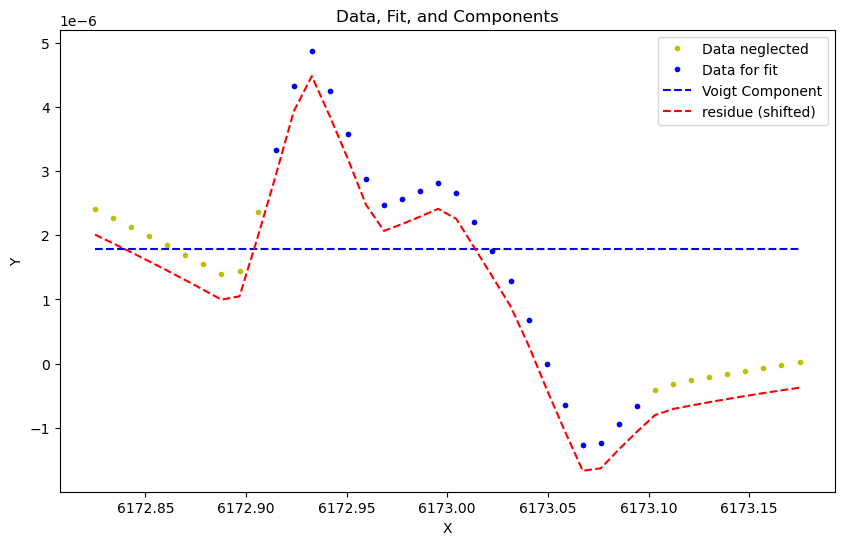

frame 60 at time 22.06666666666672 with param_fit[-1] = (array([ 2.69604406e+24, -5.03881567e+22, -2.03508318e+13, -3.89178930e+06]), array([inf, inf, inf, inf])). Here comes the plot:


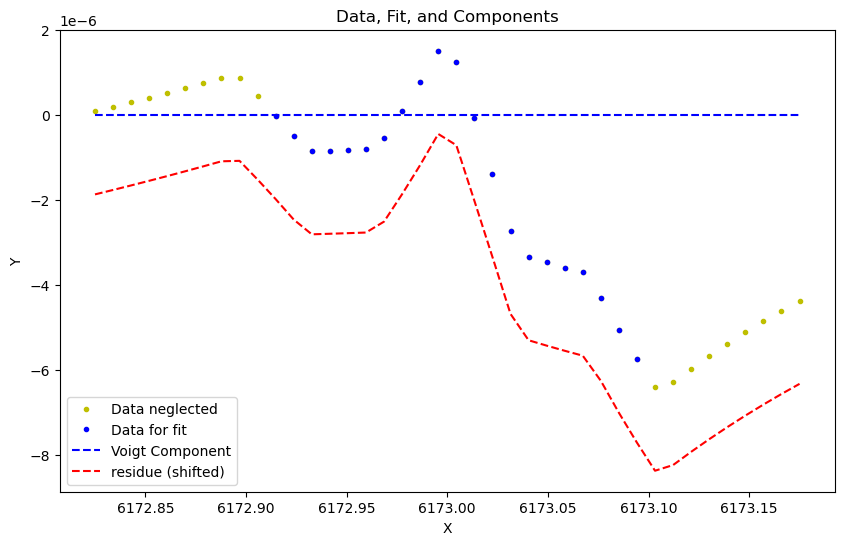

frame 70 at time 25.25 with param_fit[-1] = (array([-2.74624692e+25, -1.14122501e+23, -4.45138132e+13, -3.97119732e+10]), array([5.17451473e+70, 1.26330926e+67, 8.82374173e+42, 1.65717106e+55])). Here comes the plot:


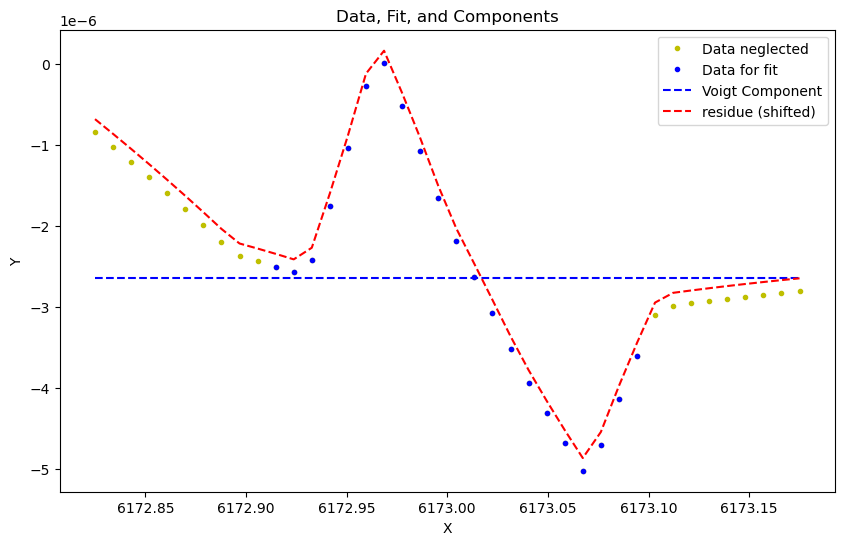

frame 80 at time 28.450000000000045 with param_fit[-1] = (array([-1.43375760e+27, -1.33963766e+24, -2.51083999e+14, -1.20155795e+11]), array([inf, inf, inf, inf])). Here comes the plot:


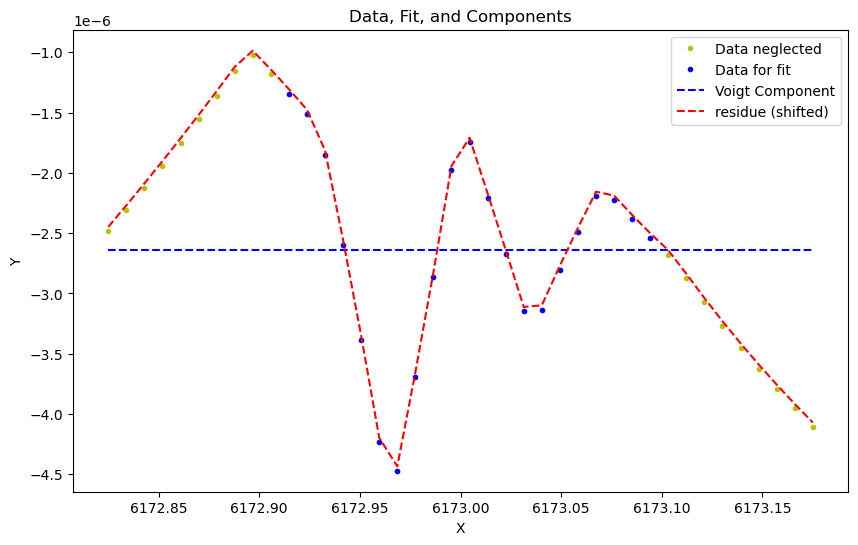

vmax = 6.303661799954089e-06, vmin = -1.2735136173173643e-05


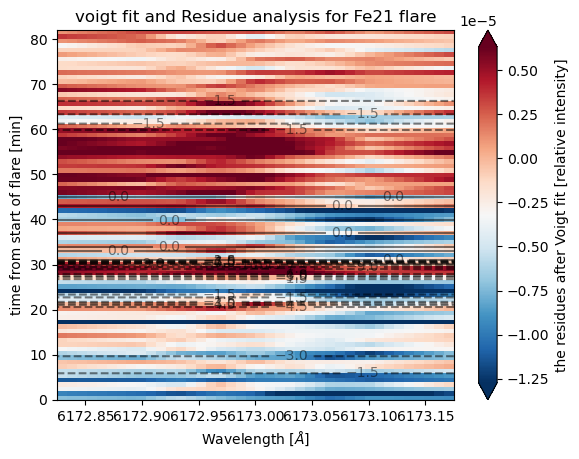

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


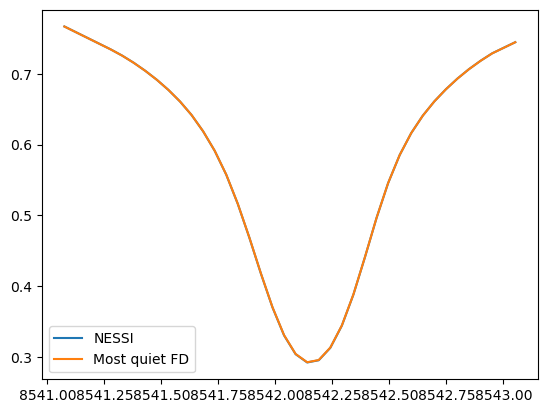

The average is 1.000010507840131
frame 0 at time 2.966666666666697 with param_fit[-1] = (array([ 7.49438196e-05,  8.54219843e+03,  1.75993103e-01, -2.76643180e-04]), array([1.92337904e-03, 7.16577233e-03, 7.72875185e-03, 1.43668832e+03])). Here comes the plot:


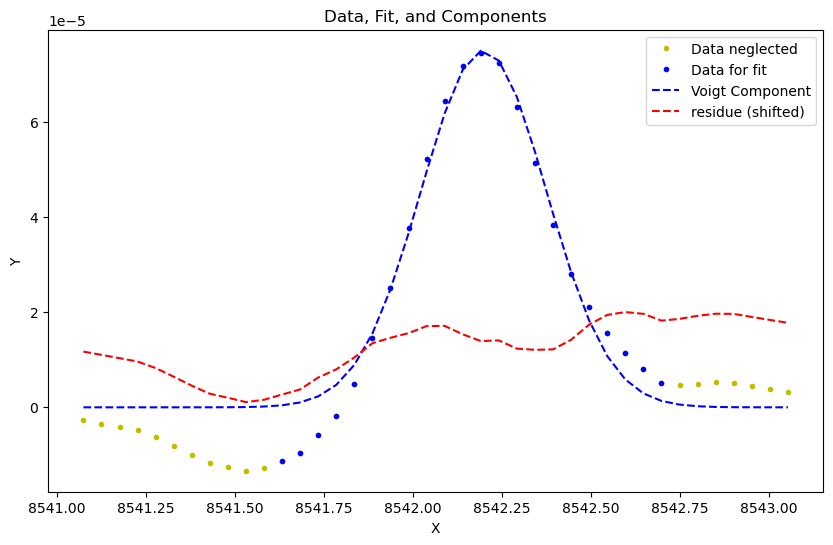

frame 50 at time 18.950000000000045 with param_fit[-1] = (array([ 2.68408378e-05,  8.54225994e+03,  1.34933761e-01, -2.27799762e-02]), array([3.48799573e-06, 1.02976282e-02, 1.30321346e-02, 9.51500613e-02])). Here comes the plot:


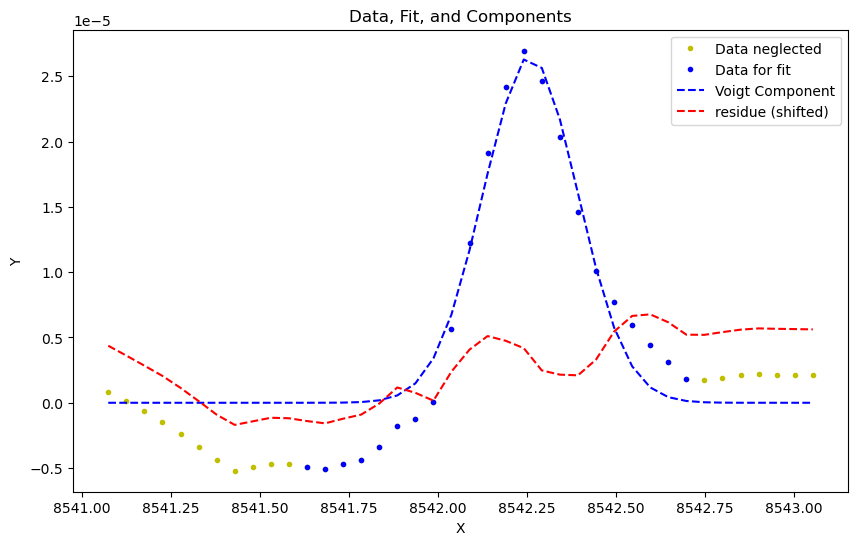

vmax = 1.89248910960158e-05, vmin = -1.5118865553777648e-05


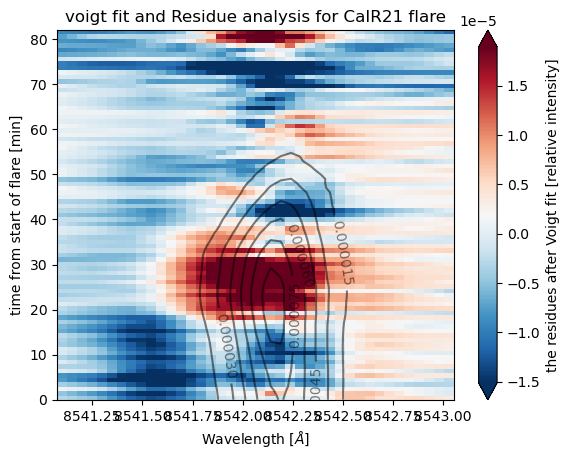

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [21]:
reload(un)
reload(un2)
reload(vf)
lines = ["Fe21", "CaIR21"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':30, 'Hbeta':200,  "CaK":50, "CaK(2)":200,  "CaIR":50,  "Fe6173":10, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-7), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Ha16', 'FOV_Ha16', 'quiet_sun_Ha16', 'nessi_Ha16', 'True_nessi_Ha16', 'TIME_Ha16', 'area_theta_CaIR16', 'FOV_CaIR16', 'quiet_sun_CaIR16', 'nessi_CaIR16', 'True_nessi_CaIR16', 'TIME_CaIR16'])


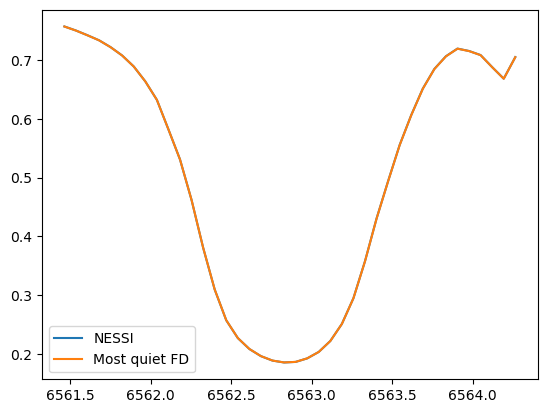

The average is 1.0000016349298904
frame 0 at time 10.43333333333328 with param_fit[-1] = (array([3.07587958e-04, 6.56305986e+03, 3.26631308e-01, 4.93780460e-05]), array([1.33012946e-02, 3.33142435e-02, 3.55785940e-02, 4.27936634e+03])). Here comes the plot:


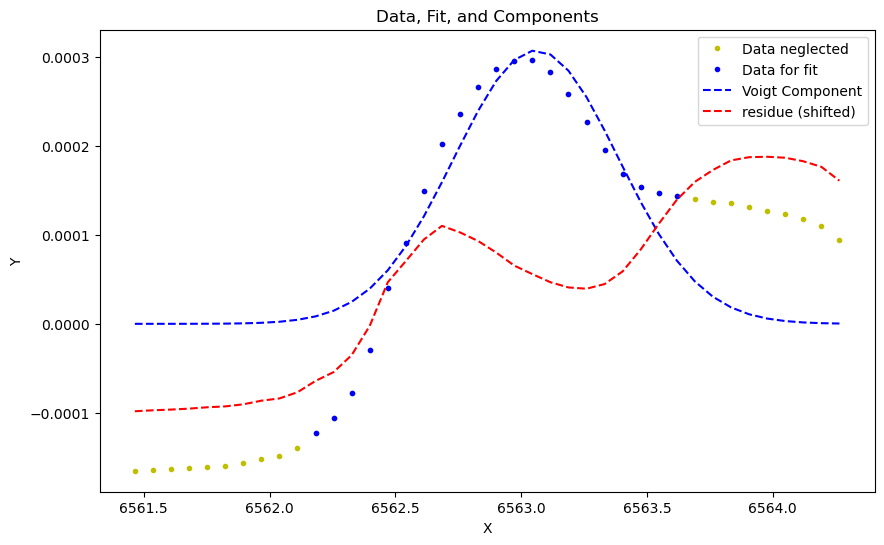

frame 30 at time 16.633333333333326 with param_fit[-1] = (array([9.93337263e-05, 6.56334402e+03, 2.69759351e-01, 7.95667245e-06]), array([inf, inf, inf, inf])). Here comes the plot:


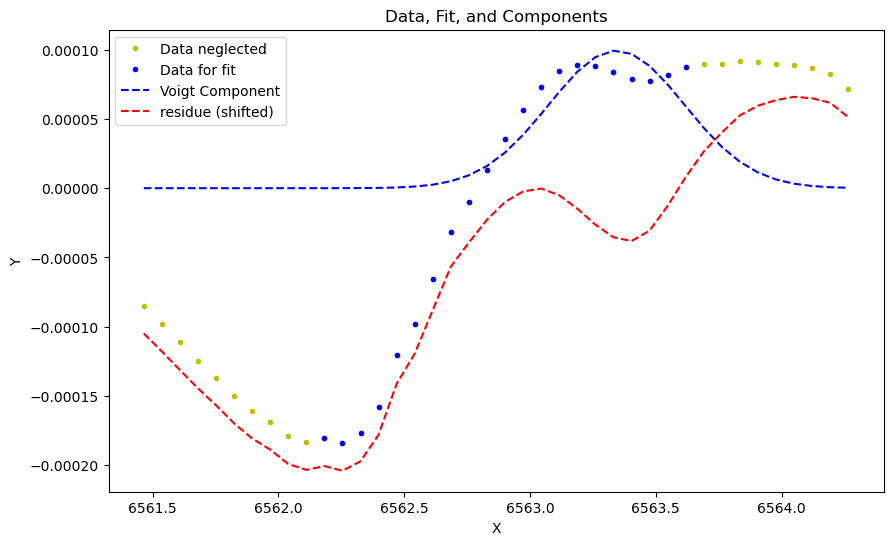

At frame 31 at time 16.83333333333337 the voigt fitting was not succesfull and average guess ([8.86754619e-05 6.56331975e+03 2.71825619e-01 1.93442838e-03]) is used as params and as std of params. 
At frame 32 at time 17.049999999999955 the voigt fitting was not succesfull and average guess ([8.76865410e-05 6.56332623e+03 2.71622600e-01 1.93597398e-03]) is used as params and as std of params. 
At frame 34 at time 17.450000000000045 the voigt fitting was not succesfull and average guess ([8.59112188e-05 6.56332564e+03 2.70425181e-01 2.14437231e-03]) is used as params and as std of params. 
frame 60 at time 22.83333333333337 with param_fit[-1] = (array([-1.23580531e-04,  6.56266617e+03,  4.89267189e-01,  2.51392348e-05]), array([inf, inf, inf, inf])). Here comes the plot:


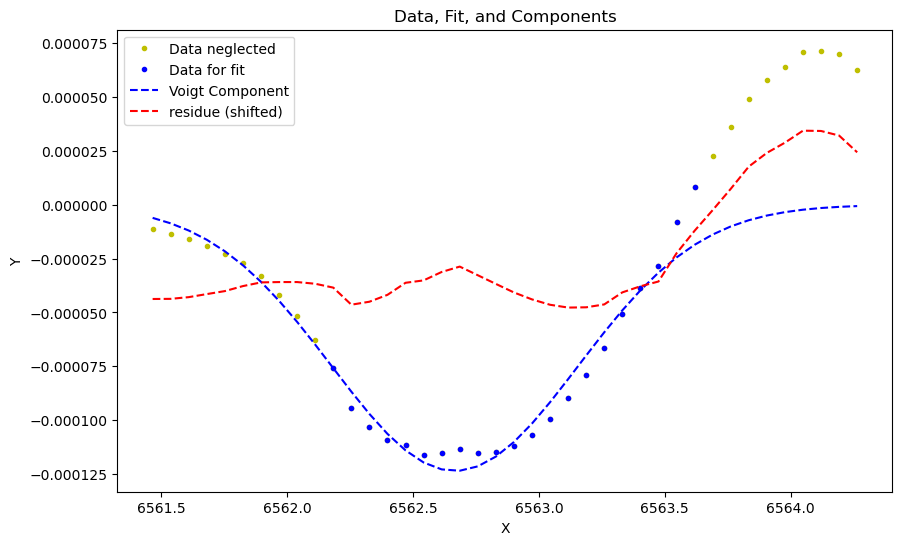

frame 90 at time 29.01666666666665 with param_fit[-1] = (array([-4.86883222e-05,  6.56321769e+03,  3.83325732e-01, -4.71968483e-01]), array([1.72221366e-06, 1.84110545e-02, 1.11856316e-01, 8.94925258e-02])). Here comes the plot:


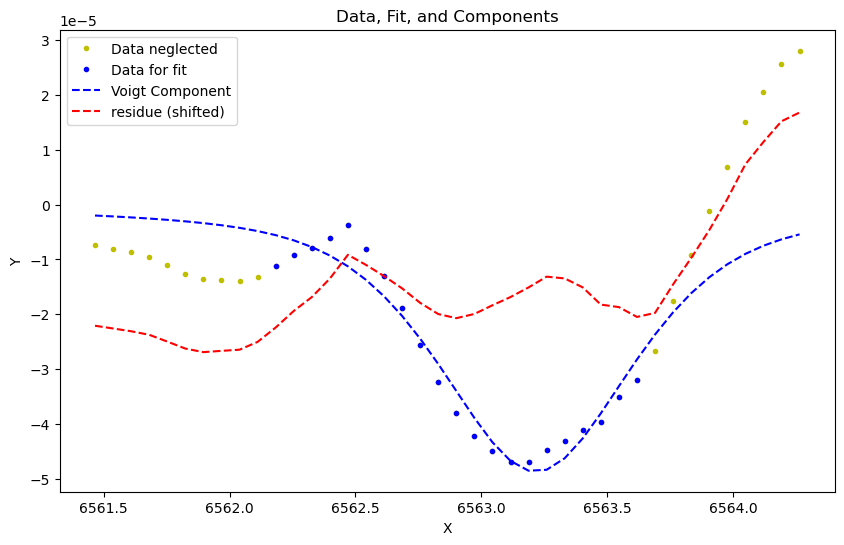

At frame 97 at time 30.466666666666697 the voigt fitting was not succesfull and average guess ([-2.62187766e-05  6.56329262e+03  3.13913024e-01 -3.47092598e-01]) is used as params and as std of params. 
At frame 99 at time 30.883333333333326 the voigt fitting was not succesfull and average guess ([-1.98198033e-05  6.56339008e+03  3.16481027e-01 -4.47683496e-01]) is used as params and as std of params. 
At frame 100 at time 31.08333333333337 the voigt fitting was not succesfull and average guess ([-1.70626061e-05  6.56346246e+03  3.29929462e-01 -5.47573338e-01]) is used as params and as std of params. 
At frame 101 at time 31.283333333333303 the voigt fitting was not succesfull and average guess ([-1.51530397e-05  6.56353503e+03  3.42075913e-01 -6.32000215e-01]) is used as params and as std of params. 
At frame 102 at time 31.5 the voigt fitting was not succesfull and average guess ([-1.42602842e-05  6.56359782e+03  3.62974838e-01 -7.08797952e-01]) is used as params and as std of params

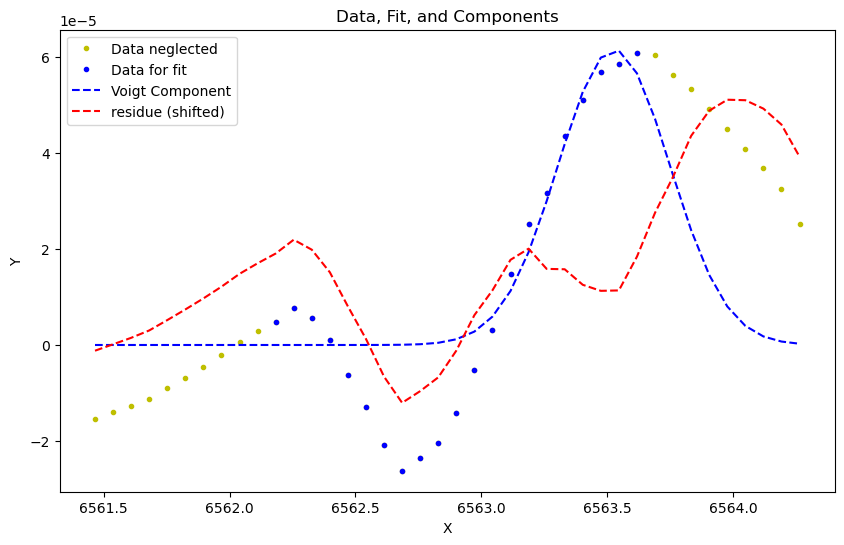

frame 180 at time 47.60000000000002 with param_fit[-1] = (array([ 9.59458691e-05,  6.56353096e+03,  1.82394571e-01, -7.66390784e-06]), array([inf, inf, inf, inf])). Here comes the plot:


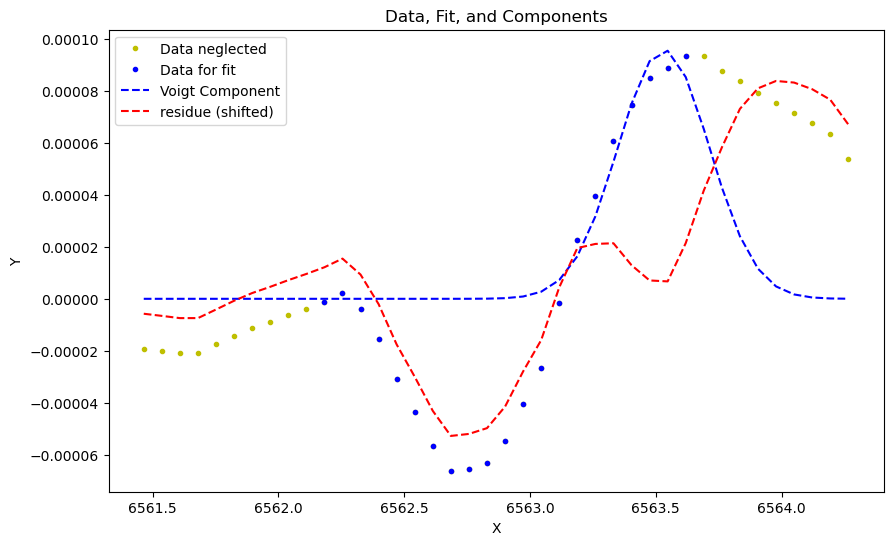

frame 210 at time 54.0 with param_fit[-1] = (array([ 1.23184152e-04,  6.56352718e+03,  1.74614595e-01, -3.95375372e-05]), array([4.13980719e-02, 9.80584322e-02, 9.82146003e-02, 8.82080493e+03])). Here comes the plot:


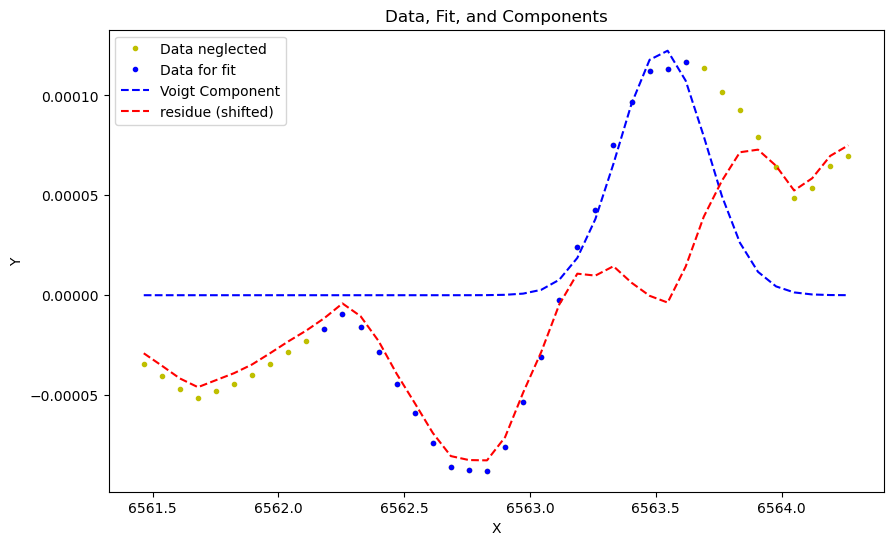

vmax = 9.266888518924382e-05, vmin = -0.0001581702651697307


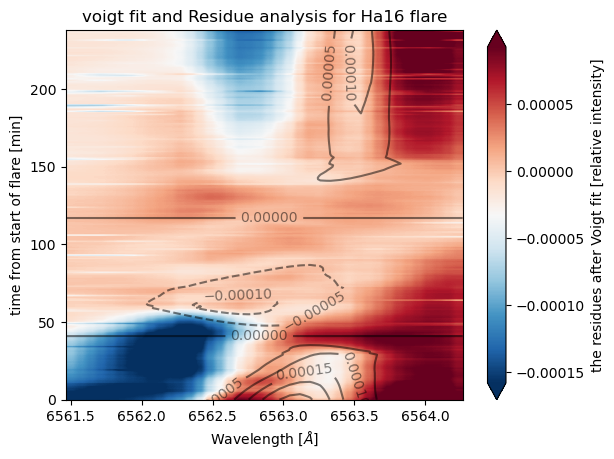

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


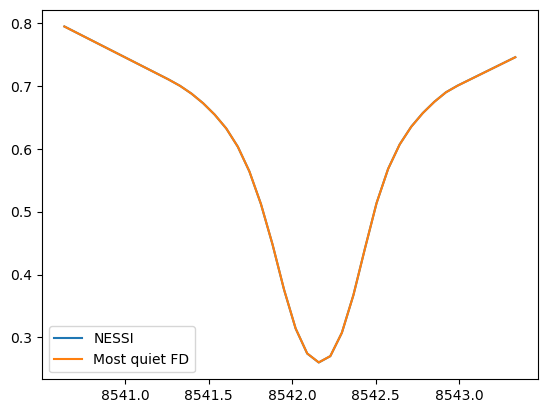

The average is 1.0000031531146347
frame 0 at time 10.333333333333371 with param_fit[-1] = (array([ 2.70877545e-04,  8.54221984e+03,  2.11959106e-01, -5.74366410e-02]), array([2.12042394e-05, 1.27199223e-02, 1.79566646e-02, 8.82151090e-02])). Here comes the plot:


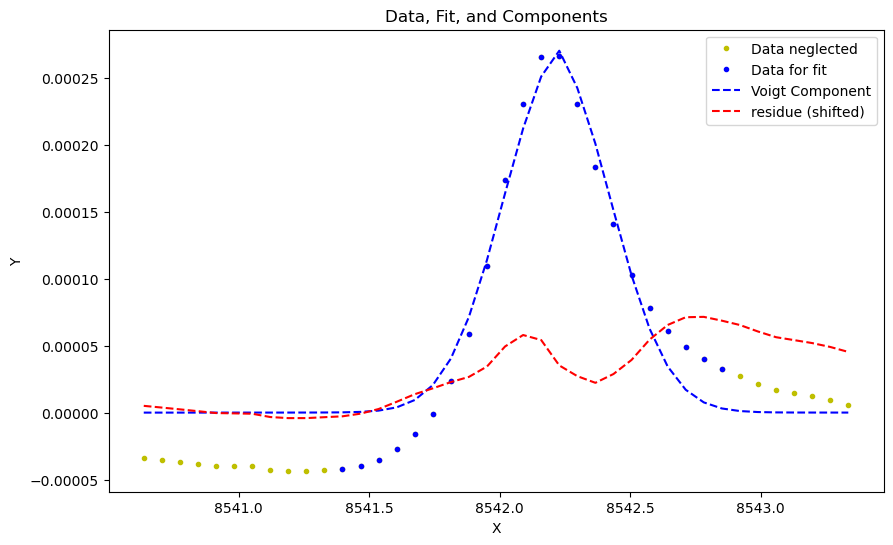

frame 50 at time 20.649999999999977 with param_fit[-1] = (array([-5.15653792e-05,  8.54174787e+03,  2.16479865e-01,  2.92726187e-04]), array([6.25894487e-04, 1.64989953e-02, 1.85976744e-02, 9.74578588e+02])). Here comes the plot:


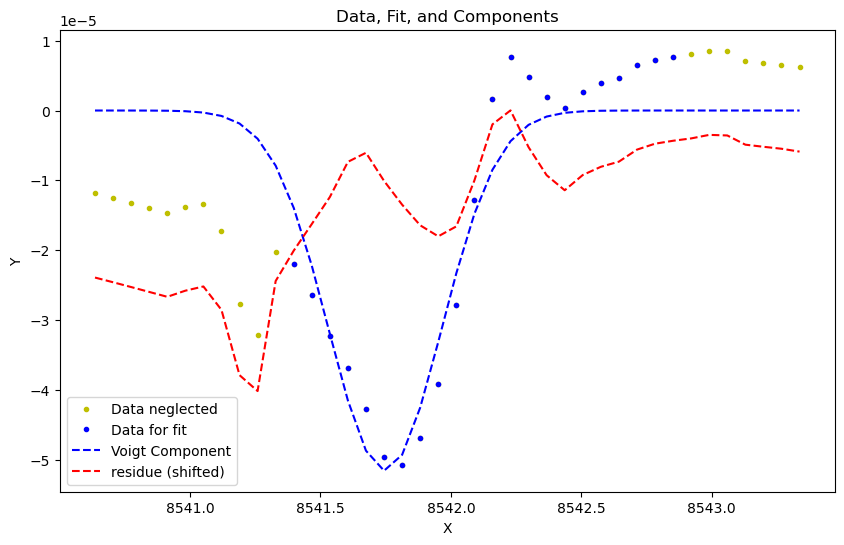

At frame 93 at time 29.533333333333303 the voigt fitting was not succesfull and average guess ([-7.34378714e-06  8.54261238e+03  1.58691115e-01 -1.06101187e-02]) is used as params and as std of params. 
At frame 100 at time 30.98333333333335 the voigt fitting was not succesfull and average guess ([-6.86298840e-06  8.54219771e+03  8.80749259e-02  1.67780406e-01]) is used as params and as std of params. 
frame 150 at time 41.299999999999955 with param_fit[-1] = (array([ 2.82633994e-05,  8.54248700e+03, -1.65819429e-01, -1.00014083e+00]), array([1.67368330e-06, 9.47847521e-02, 7.37250120e-01, 3.24576791e-01])). Here comes the plot:


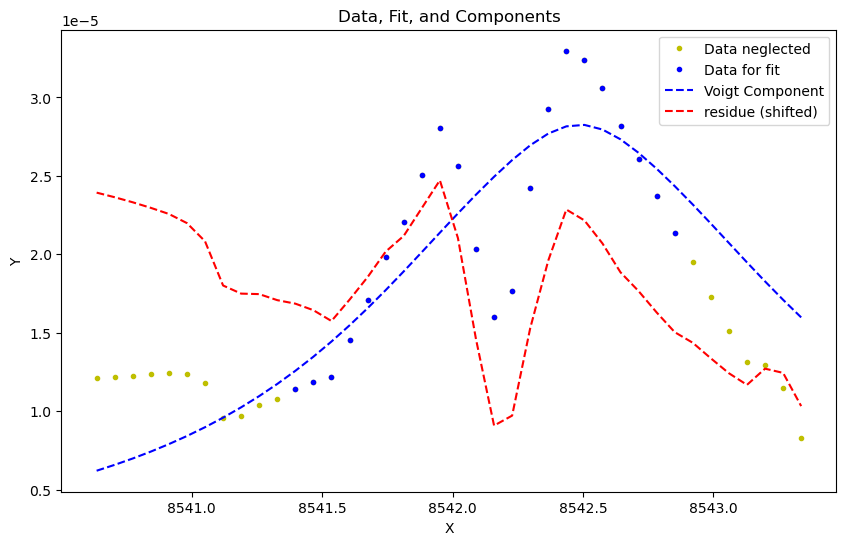

At frame 156 at time 42.5333333333333 the voigt fitting was not succesfull and average guess ([ 2.61641315e-05  8.54261899e+03  1.91059874e-01 -3.57772721e-01]) is used as params and as std of params. 
At frame 158 at time 42.950000000000045 the voigt fitting was not succesfull and average guess ([ 2.83639619e-05  8.54269205e+03  3.61637109e-01 -4.39378247e-01]) is used as params and as std of params. 
At frame 159 at time 43.16666666666663 the voigt fitting was not succesfull and average guess ([ 2.93874169e-05  8.54276124e+03  1.14014502e-01 -5.68419942e-01]) is used as params and as std of params. 
At frame 161 at time 43.56666666666672 the voigt fitting was not succesfull and average guess ([ 3.06891444e-05  8.54280285e+03 -1.88823792e-01 -5.97187422e-01]) is used as params and as std of params. 
At frame 162 at time 43.7833333333333 the voigt fitting was not succesfull and average guess ([ 3.10806051e-05  8.54280506e+03 -2.50362028e-01 -5.32690548e-01]) is used as params and as st

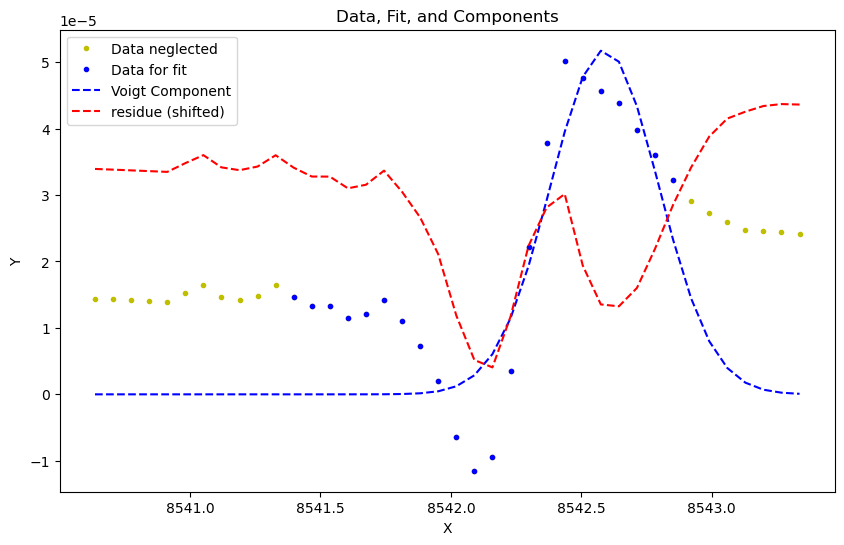

frame 250 at time 62.14999999999998 with param_fit[-1] = (array([4.62379719e-05, 8.54266594e+03, 1.69793571e-01, 1.99048103e-04]), array([4.64364339e-03, 4.99023860e-02, 5.60960053e-02, 7.27825807e+03])). Here comes the plot:


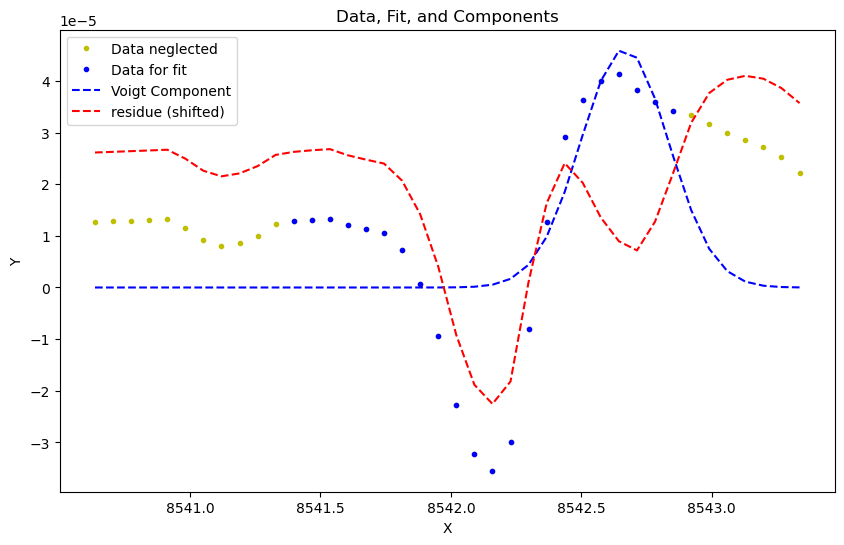

At frame 294 at time 71.23333333333335 the voigt fitting was not succesfull and average guess ([2.43437336e-05 8.54267608e+03 1.11277445e-01 1.33060838e-03]) is used as params and as std of params. 
frame 300 at time 72.48333333333335 with param_fit[-1] = (array([-6.78410178e-05,  8.54216665e+03,  1.29505991e-01,  3.01728759e-05]), array([1.37955936e-04, 2.08139657e-02, 1.88861365e-02, 5.30826393e+02])). Here comes the plot:


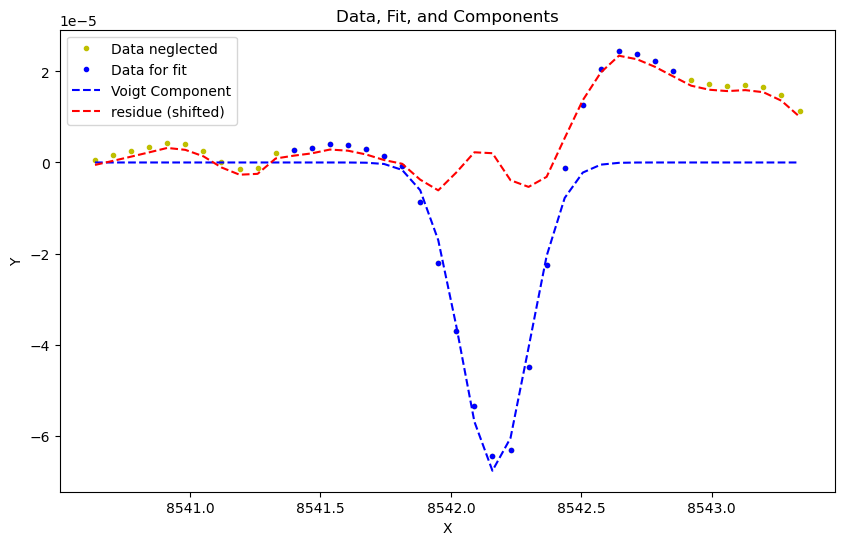

vmax = 2.5674341237305406e-05, vmin = -4.991039433667534e-05


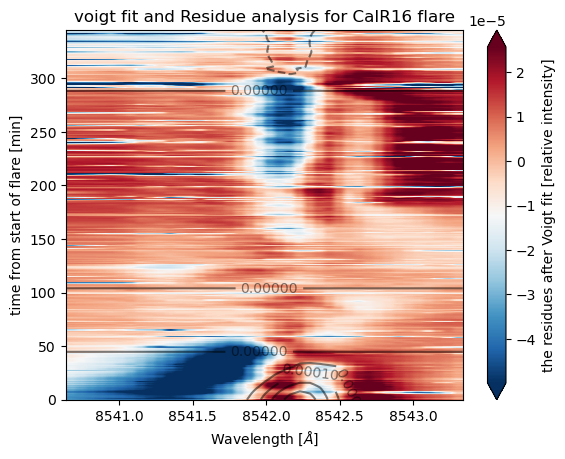

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [22]:
reload(un)
reload(un2)
reload(vf)
lines = ["Ha16", "CaIR16"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
# un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':30, 'Hbeta':200,  "CaK":50, "CaK(2)":200,  "CaIR":50,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(9, -9), vf.exc_wings(10,-7), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_He23', 'FOV_He23', 'quiet_sun_He23', 'nessi_He23', 'True_nessi_He23', 'TIME_He23', 'area_theta_Ha23', 'FOV_Ha23', 'quiet_sun_Ha23', 'nessi_Ha23', 'True_nessi_Ha23', 'TIME_Ha23', 'area_theta_CaIR23', 'FOV_CaIR23', 'quiet_sun_CaIR23', 'nessi_CaIR23', 'True_nessi_CaIR23', 'TIME_CaIR23', 'area_theta_CaK23', 'FOV_CaK23', 'quiet_sun_CaK23', 'nessi_CaK23', 'True_nessi_CaK23', 'TIME_CaK23', 'area_theta_Hbeta23', 'FOV_Hbeta23', 'quiet_sun_Hbeta23', 'nessi_Hbeta23', 'True_nessi_Hbeta23', 'TIME_Hbeta23'])
The average is 1.0000038728923315
frame 0 at time 13.716666666666697 with param_fit[-1] = (array([ 4.14756800e-06,  5.87609371e+03,  5.77099672e-02, -1.73598334e-06]), array([3.25673994e-04, 4.14718583e-03, 5.38951563e-03, 3.87489314e+02])). Here comes the plot:


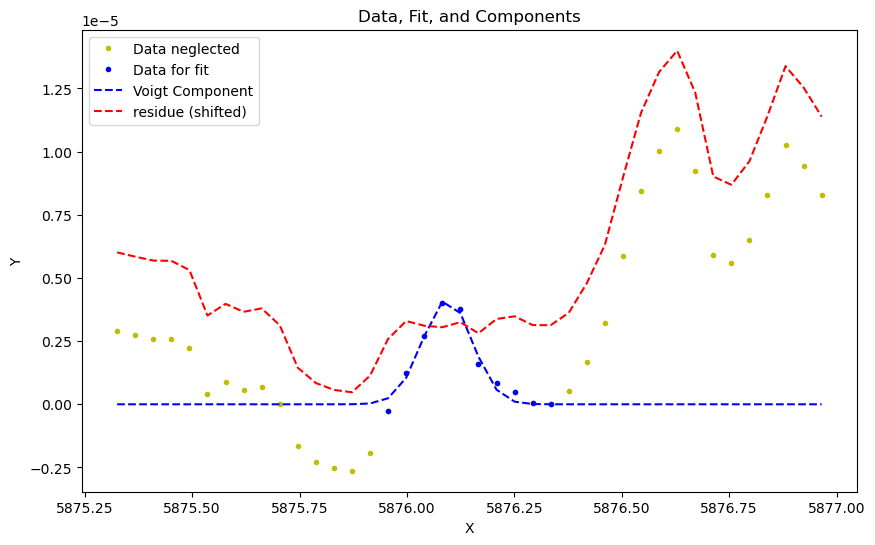

At frame 8 at time 20.86666666666656 the voigt fitting was not succesfull and average guess ([-2.71626022e-06  5.87614746e+03 -1.81747912e-02  1.05082233e-02]) is used as params and as std of params. 
frame 20 at time 31.59999999999991 with param_fit[-1] = (array([-1.31577268e-05,  5.87614787e+03, -1.55737425e-02,  1.89481005e-01]), array([5.65473295e-07, 5.17416216e-03, 8.06802597e-02, 1.52145979e-02])). Here comes the plot:


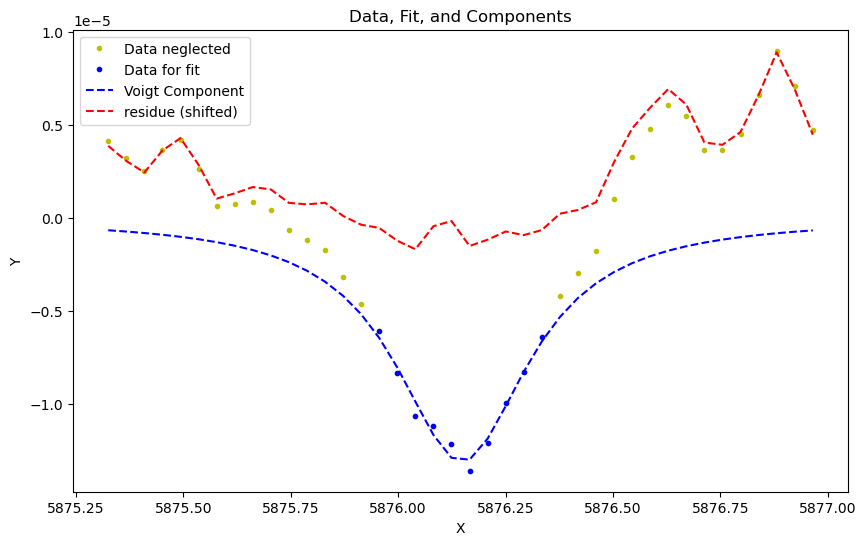

At frame 35 at time 45.01666666666665 the voigt fitting was not succesfull and average guess ([-6.43659635e-06  5.87614783e+03  1.20992199e-02  6.82144354e-02]) is used as params and as std of params. 
At frame 36 at time 45.91666666666674 the voigt fitting was not succesfull and average guess ([-6.10402861e-06  5.87614514e+03  2.22431332e-02  5.37444098e-02]) is used as params and as std of params. 
At frame 37 at time 46.799999999999955 the voigt fitting was not succesfull and average guess ([-5.38064084e-06  5.87614374e+03  3.09542996e-02  2.78446198e-02]) is used as params and as std of params. 
frame 40 at time 49.48333333333335 with param_fit[-1] = (array([-6.96590158e-06,  5.87612315e+03,  6.97465002e-02,  2.70728272e-01]), array([2.70021320e-07, 7.56188371e-03, 1.60981110e-01, 8.60400886e-02])). Here comes the plot:


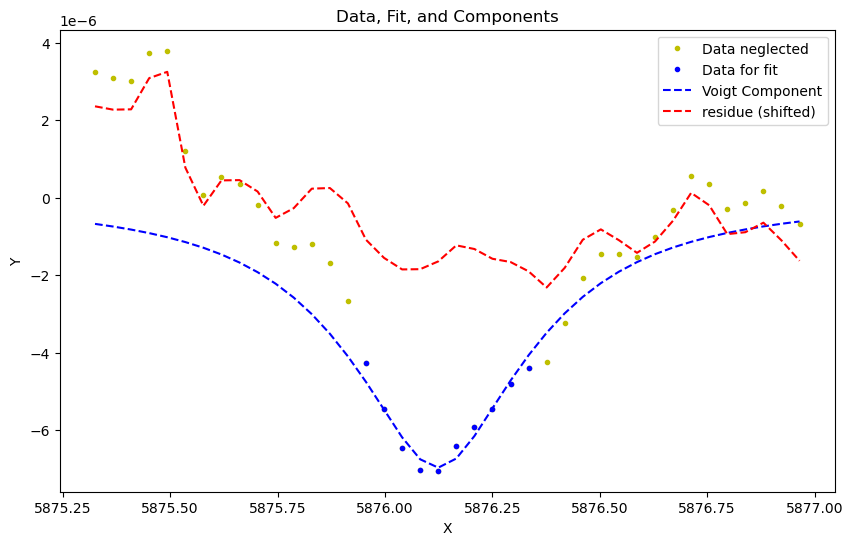

At frame 45 at time 53.9666666666667 the voigt fitting was not succesfull and average guess ([-9.16279449e-06  5.87610863e+03  1.26157915e-02  3.42009485e-01]) is used as params and as std of params. 
At frame 46 at time 54.84999999999991 the voigt fitting was not succesfull and average guess ([-8.53713612e-06  5.87612207e+03 -4.32219154e-02  2.31394931e-01]) is used as params and as std of params. 
At frame 47 at time 55.75 the voigt fitting was not succesfull and average guess ([-6.36712671e-06  5.87612888e+03 -3.69331152e-02  9.67697527e-02]) is used as params and as std of params. 
At frame 51 at time 59.33333333333326 the voigt fitting was not succesfull and average guess ([-3.98745670e-06  5.87616345e+03 -2.51969587e-01 -1.72222797e-01]) is used as params and as std of params. 
vmax = 1.7107893768924766e-05, vmin = -7.639519472938812e-06


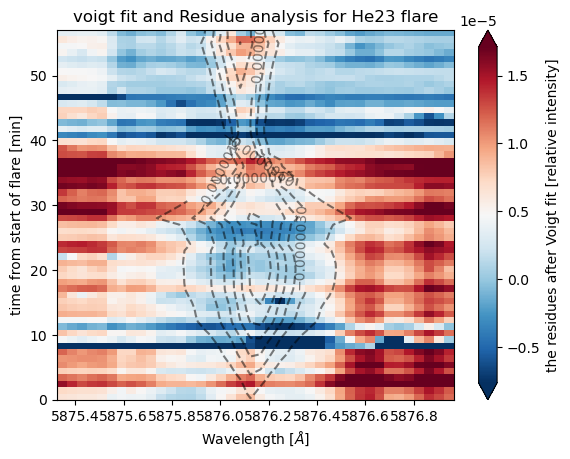

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000482879776518
frame 0 at time 13.483333333333348 with param_fit[-1] = (array([ 1.68777556e-04,  6.56290836e+03,  7.29765630e-01, -4.39190879e-01]), array([1.21651585e-05, 3.64528144e-02, 1.16658378e-01, 1.12920569e+00])). Here comes the plot:


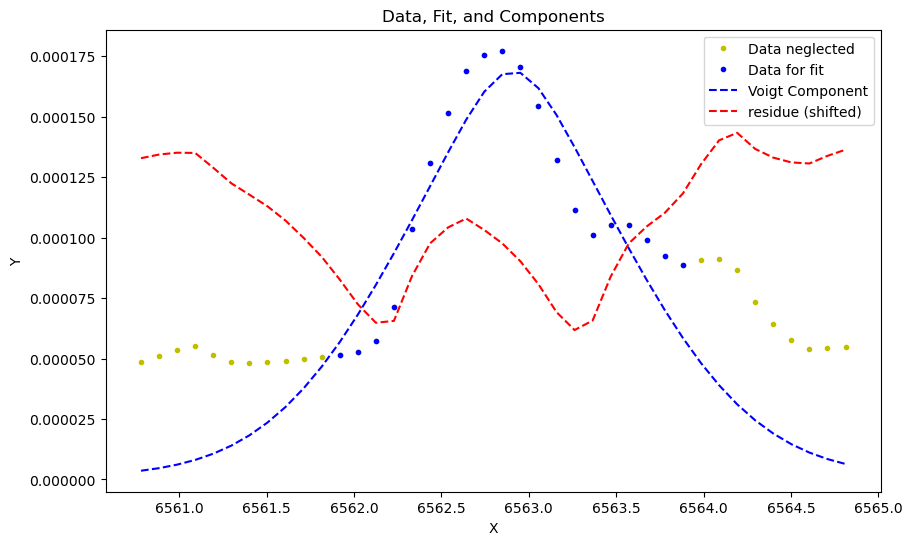

vmax = 5.253601164543304e-05, vmin = -1.3899141994235863e-05


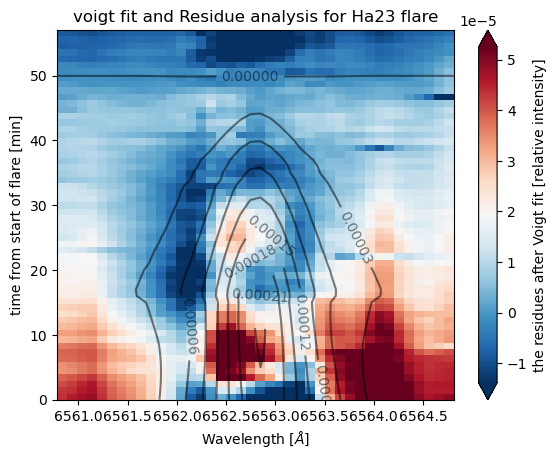

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0000268254424725
frame 0 at time 13.133333333333326 with param_fit[-1] = (array([ 8.50291576e-05,  8.54211855e+03, -1.41446191e-01, -4.34465520e-01]), array([6.40133620e-06, 2.26214184e-02, 3.07851519e-01, 1.34714436e-01])). Here comes the plot:


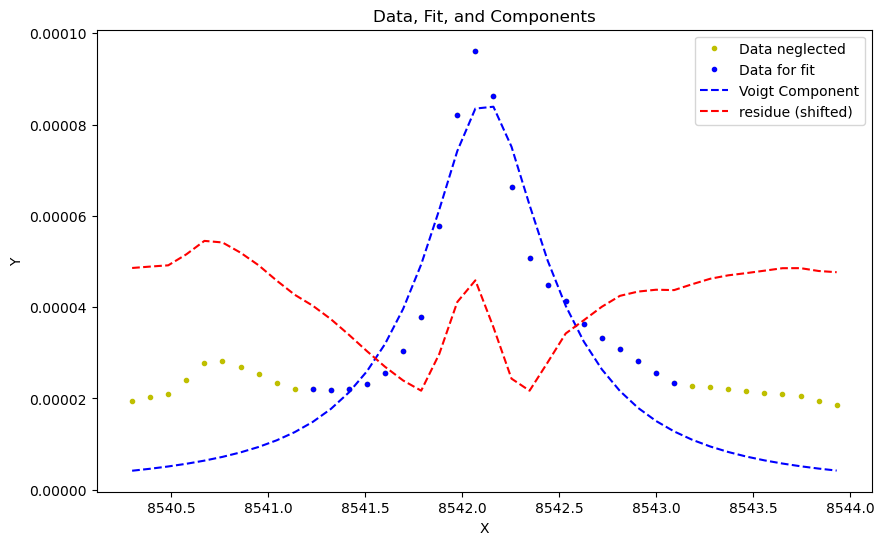

vmax = 2.007719897883814e-05, vmin = -2.0339716533754486e-05


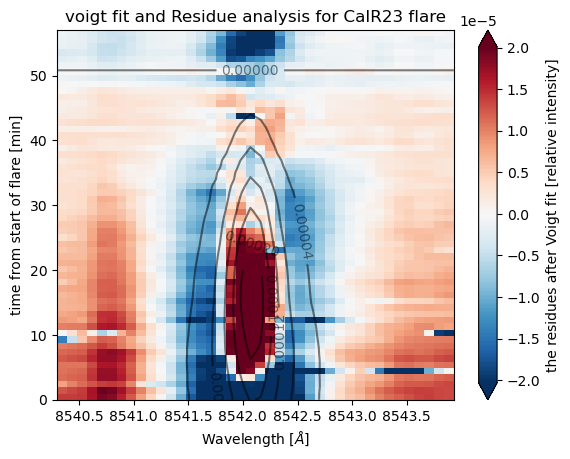

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.000249146214243
frame 0 at time 13.06666666666672 with param_fit[-1] = (array([ 1.57055974e-03,  3.96849316e+03, -1.50656833e-01,  3.77436586e-01]), array([8.51581510e-05, 1.42266863e-02, 1.21049865e-01, 5.08259181e-02])). Here comes the plot:


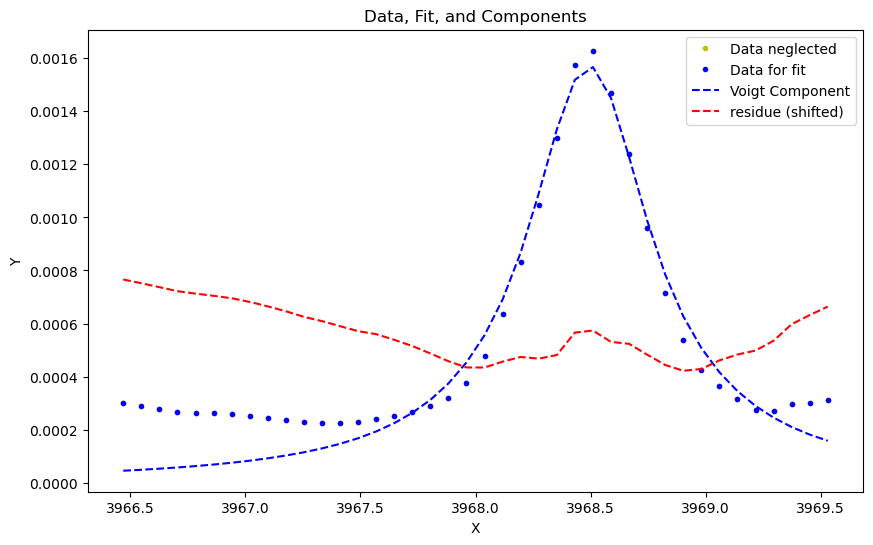

vmax = 0.0001876864325338418, vmin = -6.197158375173275e-05


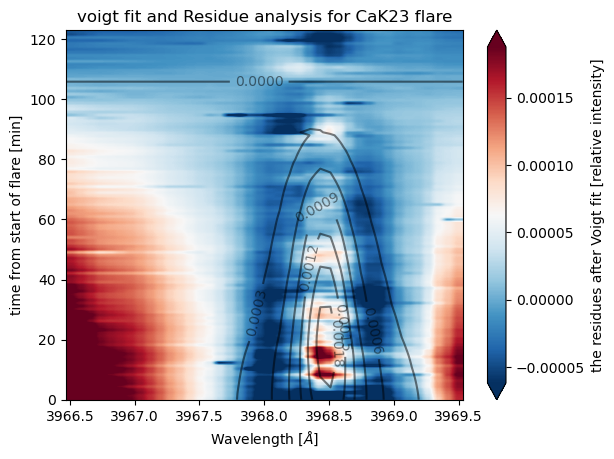

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 1.0001179292194402
frame 0 at time 13.25 with param_fit[-1] = (array([ 4.41752346e-04,  4.86132933e+03, -1.07656579e-01,  3.77927946e-01]), array([6.08137958e-06, 3.41073268e-03, 6.43838437e-02, 3.20546632e-02])). Here comes the plot:


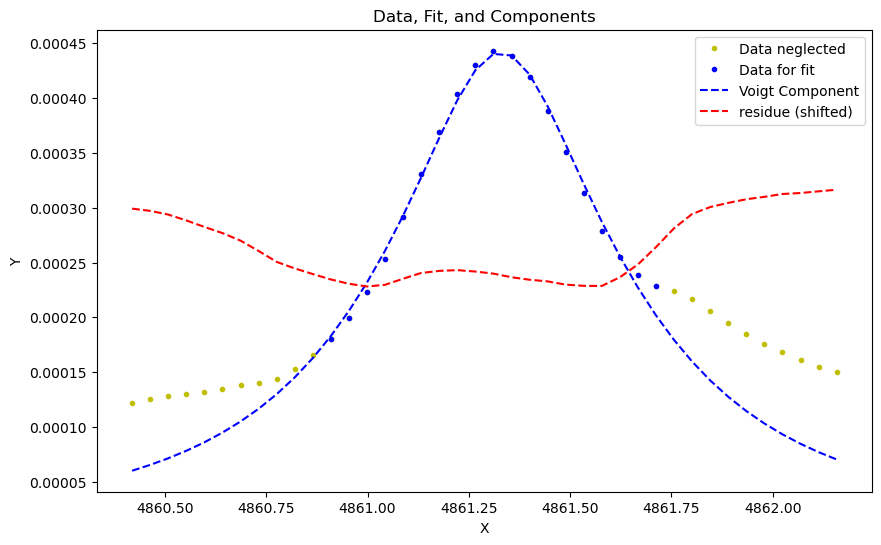

vmax = 5.250384185996203e-05, vmin = -1.5132671105378304e-05


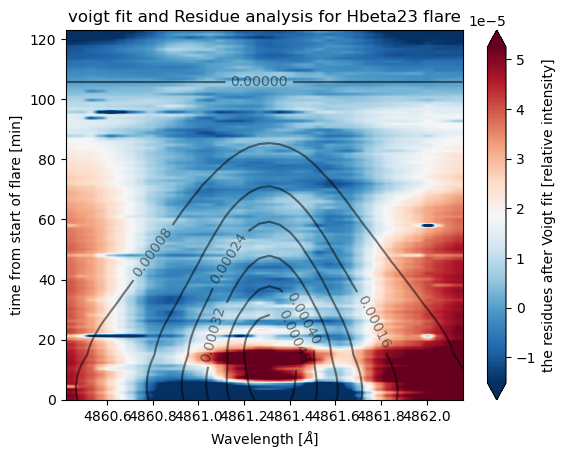

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [7]:
reload(un)
reload(un2)
reload(vf)
lines = ["He23", "Ha23", "CaIR23", "CaK23", "Hbeta23"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$', "He":r'He$ 5876 \AA$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())
un2.disgard_cont_point("CaK23", data)

plot_rates = {'Ha':2100, 'Hbeta':200,  "CaK":200, "CaK(2)":200,  "CaIR":200,  "Fe6173":500, "He":20}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
                   "He":[-8.41204361e-06,  5.87614596e+03, -1.10863891e-01,  8.69928093e-05]}
lnp=[vf.exc_wings(14, -15), vf.exc_wings(10,-9), vf.exc_wings(9,-9), [], vf.exc_wings(10,-10)]
ofs = [-3.5e-6,0,0,0,0]

vf.make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

E:\solar flares/data/2017-09-06\use_nessi2.py:267: SyntaxWarning: invalid escape sequence '\H'
  # first flare starts exactly at 8:57 (X2.2) the second at 11:53 (X9.3)
E:\solar flares/data/2017-09-06\use_nessi2.py:361: SyntaxWarning: invalid escape sequence '\D'
  else:
E:\solar flares/data/2017-09-06\use_nessi2.py:467: SyntaxWarning: invalid escape sequence '\{'
  figname += name
E:\solar flares/data/2017-09-06\use_nessi2.py:467: SyntaxWarning: invalid escape sequence '\s'
  figname += name


dict_keys(['area_theta_Ha15a', 'FOV_Ha15a', 'quiet_sun_Ha15a', 'nessi_Ha15a', 'True_nessi_Ha15a', 'TIME_Ha15a', 'area_theta_CaIR15a', 'FOV_CaIR15a', 'quiet_sun_CaIR15a', 'nessi_CaIR15a', 'True_nessi_CaIR15a', 'TIME_CaIR15a'])
The average is 1.0000038652709358
frame 0 at time 14.0 with param_fit[-1] = (array([-1.77100266e-05,  6.56256128e+03,  1.87013017e-01, -6.05054141e-04]), array([1.31498041e-05, 8.25241437e-03, 9.14247394e-03, 2.22568178e+01])). Here comes the plot:


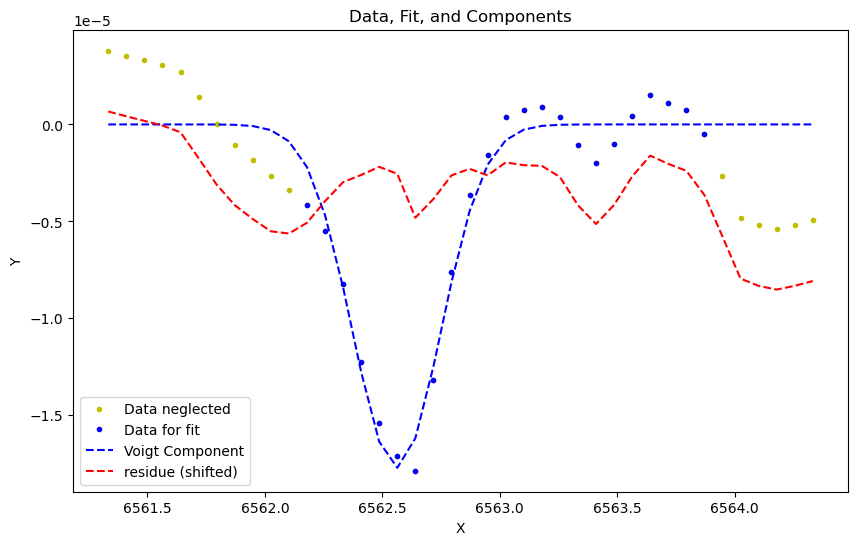

vmax = 5.4247864658191655e-05, vmin = -2.1725532831098223e-05


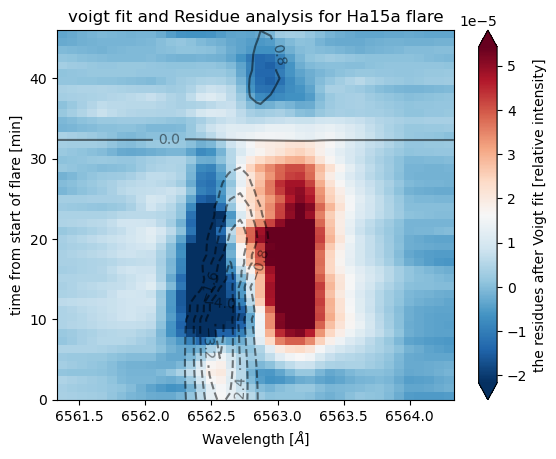

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     
The average is 0.9999999975284056
frame 0 at time 14.0 with param_fit[-1] = (array([-6.37780328e-05,  8.54213442e+03, -1.37745581e-01, -2.14757972e-01]), array([1.31732699e-06, 3.74958562e-03, 1.40300018e-02, 5.80006919e-03])). Here comes the plot:


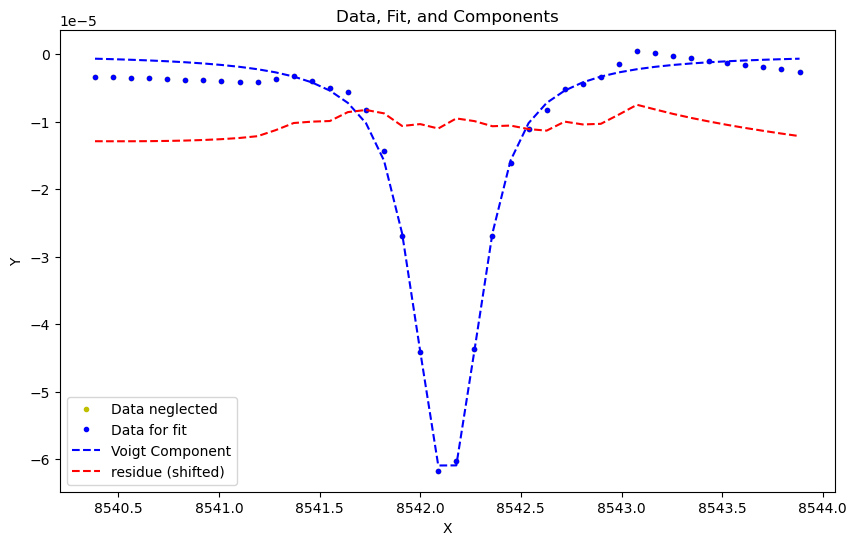

vmax = 2.2204610458821493e-05, vmin = -1.0935000475998863e-05


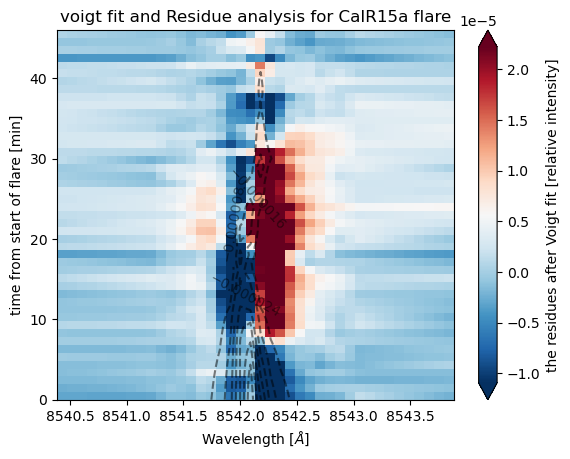

  ____    _   __       ____    _   __       ____    _   __       ____    _   __       ____    _   __     
 / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /      / __ \  | | / /     
| |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      | |  | | | |/ /      
| |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      | |_ | | |   \      
 \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\      \____/  |_|\_\     


In [9]:
from voigt_fit import *

reload(un)
reload(un2)
lines = ["Ha15a", "CaIR15a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$'}


data = un.load_for_further_analysis(lines) #, full_path = "D:/solar flares/data/2014-09-06/")
print(data.keys())

plot_rates = {'Ha':1000, 'Hbeta':500,  "CaK":5, "CaK(2)":1,  "CaIR":100,  "Fe6173":50}

initial_guesses = {'Ha':[3.00860853e-05, 6.56324340e+03, 2.70645889e-01, 1.09656846e-02], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.68681359e-05, 8.54258821e+03, 1.25588406e-01, 6.70491591e-03],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[-1,-2,-3,-4,-5,-6,0,1,2,3,4,5,6,7,8,9,10], [], [], []]
ofs = [0.0,0.0]

make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

dict_keys(['area_theta_Hbeta17a', 'FOV_Hbeta17a', 'quiet_sun_Hbeta17a', 'nessi_Hbeta17a', 'TIME_Hbeta17a', 'area_theta_CaIR17a', 'FOV_CaIR17a', 'quiet_sun_CaIR17a', 'nessi_CaIR17a', 'TIME_CaIR17a'])
Test of contrast profile and associated curves of Hbeta17a


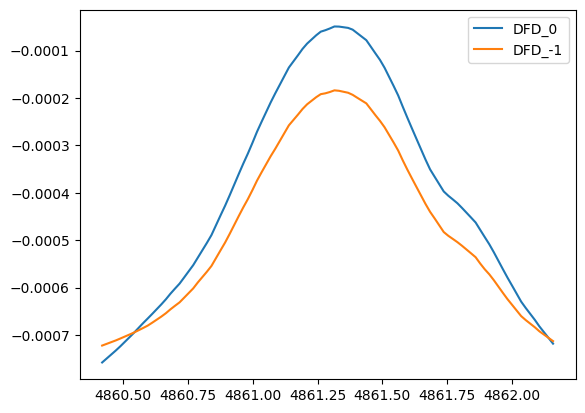

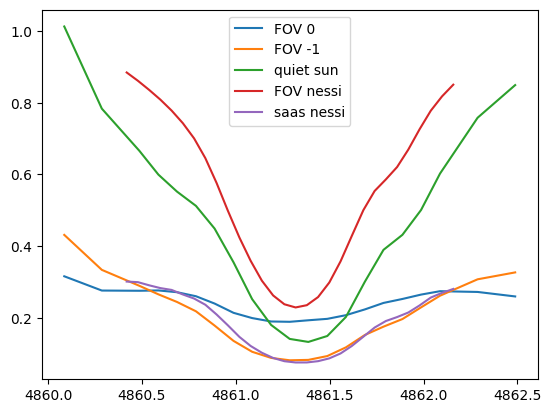

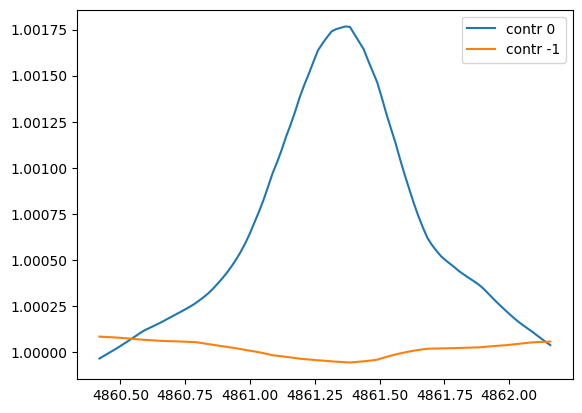

Test of contrast profile and associated curves of CaIR17a


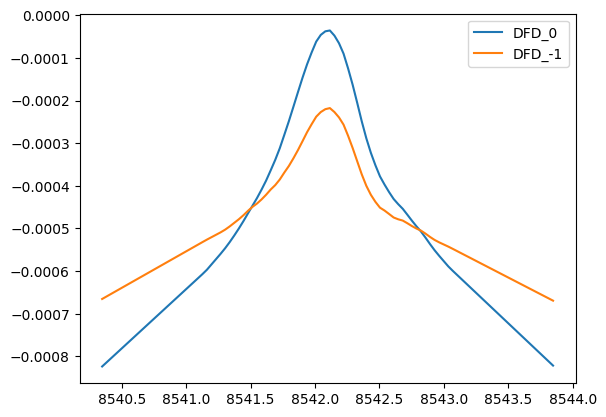

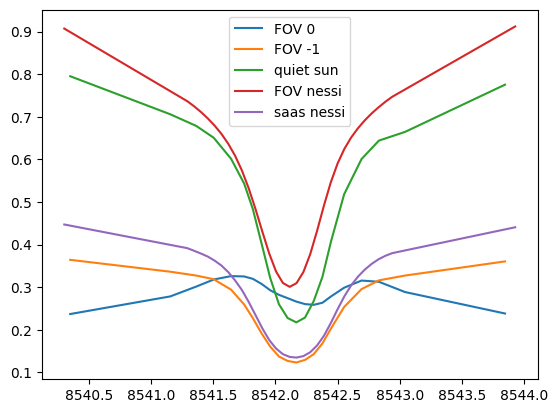

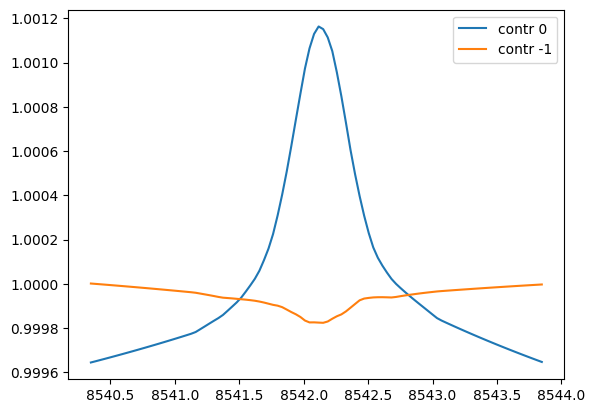

The average is 1.0002510461945413
frame 0 with param_fit[-1] = (array([1.77424517e-03, 4.86134719e+03, 2.23909055e-01, 2.87362012e-01]), array([1.59634486e-05, 2.40169159e-03, 9.41468704e-03, 5.75783366e-03])). Here comes the plot:


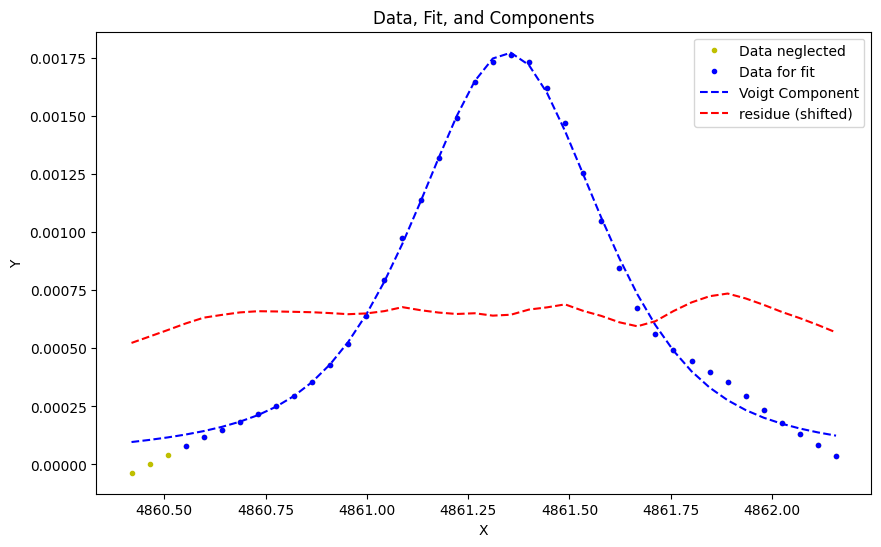

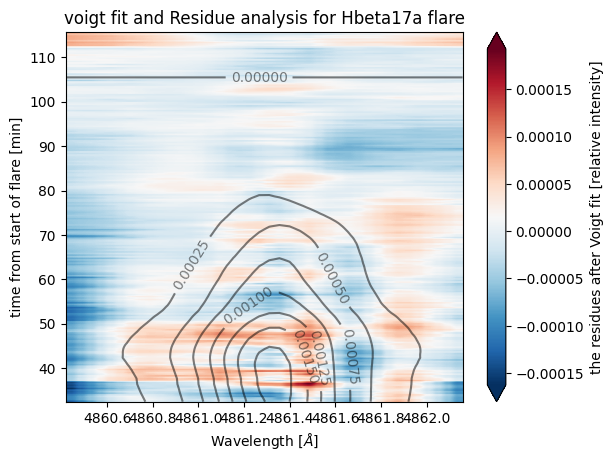

The average is 1.0000473473693945
frame 0 with param_fit[-1] = (array([ 1.16355577e-03,  8.54213207e+03,  2.03198317e-01, -2.19101476e-04]), array([6.97192179e-02, 2.65423523e-02, 2.85089633e-02, 2.86856663e+03])). Here comes the plot:


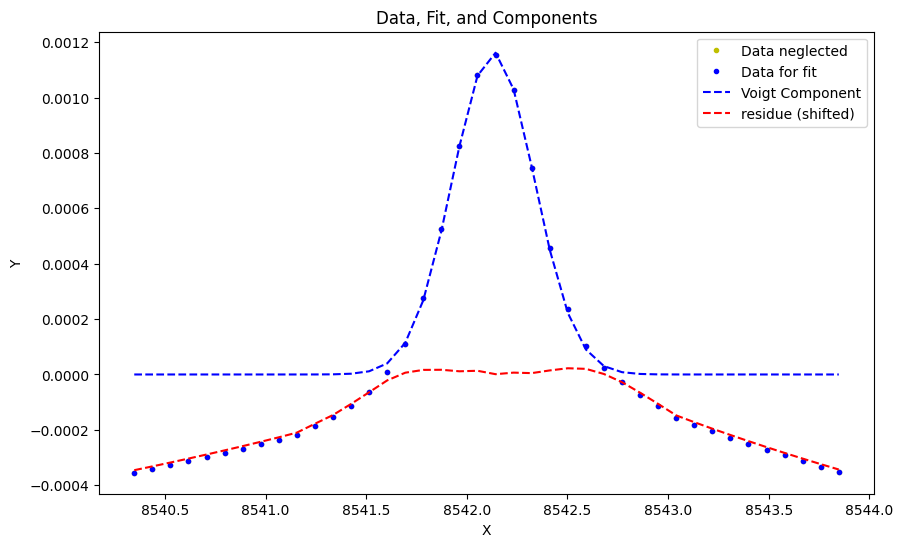

At frame 18 the voigt fitting was not succesfull and previous params are used. 
At frame 40 the voigt fitting was not succesfull and previous params are used. 
vmax = 0.00030261326708225635, vmin = -0.00014831090554278436


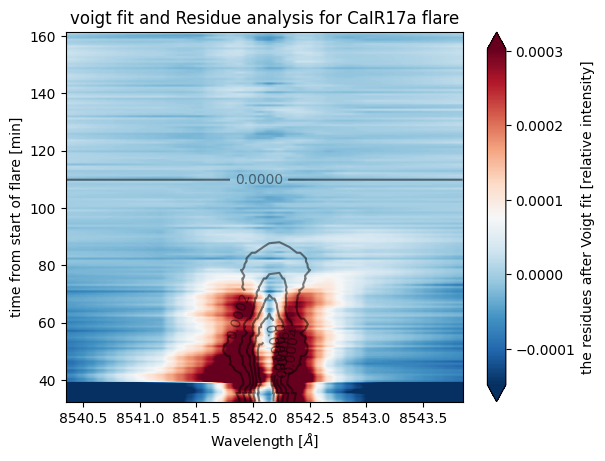

In [47]:
reload(un)
reload(un2)
lines = ["Hbeta17a", "CaIR17a"] #, "CaK17a"]
long_names = {"Ha":r"H$\alpha$", "CaK":r'Ca$IIK$', "CaIR":r'Ca$II 8542 \AA$', "Hbeta":r'H$\beta$'}


data = un.load_for_further_analysis(lines)
print(data.keys())



# un2.disgard_cont_point("CaK17a", data)
# un2.split_data_in_two_lines("CaK17a", data, 3950, lines)

# print(data.keys())

plot_rates = {'Ha':500, 'Hbeta':500,  "CaK":5, "CaK(2)":1,  "CaIR":500,  "Fe6173":50}

initial_guesses = {'Ha':[5.55265545e-01, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01], 
                   'Hbeta':[5.55265545e-01, 4861.5, 5.29257897e-01, 4.96399919e-01], 
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaK(2)":[4.5, 3968.5, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[ 1.16409012e-01,  8.54204860e+03, -3.29762486e-01,  1.04739309e+00],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[0,1,2], [], [], []]
ofs = [0,0,0]
reload(un2)
un2.test_contrast(data, "Hbeta17a")
un2.test_contrast(data, "CaIR17a")
# un2.test_contrast(data, "CaK17a")
make_full_analysis(data, lines, offsets=ofs, plot_rate=plot_rates, init_guesses=initial_guesses, list_neglect_points=lnp)

The average is 1.0000967030312553
frame 0 at time 4.0 with param_fit[-1] = (array([-2.71044657e-05,  6.56249420e+03,  6.47735437e-01, -8.94645230e-01]), array([2.56093069e-07, 1.97634562e-02, 1.78925460e+00, 1.42099004e+00])). Here comes the plot:


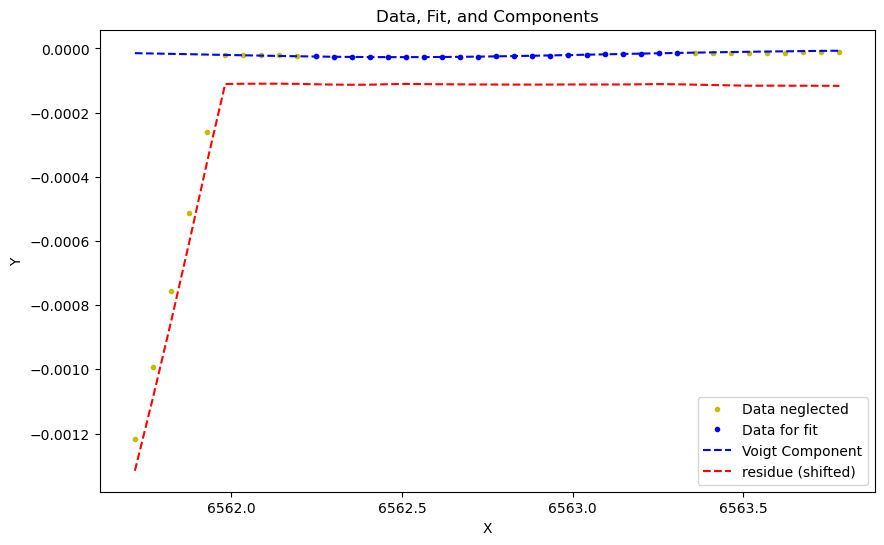

At frame 3 at time 4.2000000000000455 the voigt fitting was not succesfull and average guess ([ 5.11448794e-05  6.56274432e+03  5.00101694e-01 -8.71682741e-01]) is used as params and as std of params. 
frame 40 at time 6.649999999999977 with param_fit[-1] = (array([ 1.94149579e-05,  6.56299808e+03,  8.79243648e-01, -2.53093033e-01]), array([7.07724518e-07, 7.60343816e-02, 3.98994867e-01, 7.08707423e-01])). Here comes the plot:


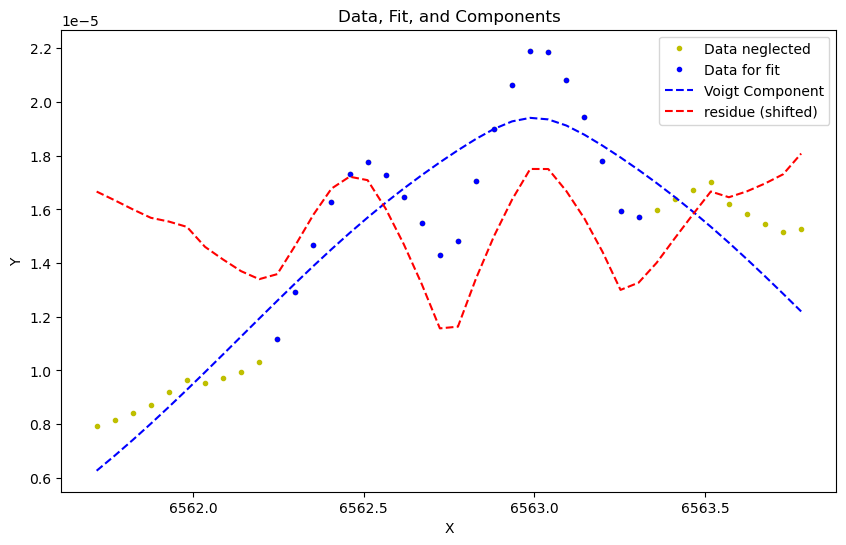

e:\solar flares\data\voigt_fitting\voigt_fit.py:42: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(voigt, x_data, y_data, p0=initial_guess)


frame 80 at time 9.299999999999955 with param_fit[-1] = (array([3.69834475e-05, 6.56233431e+03, 1.83297533e-01, 5.18352947e-01]), array([1.73863802e-06, 5.62095123e-02, 3.14662346e-01, 1.60477545e-01])). Here comes the plot:


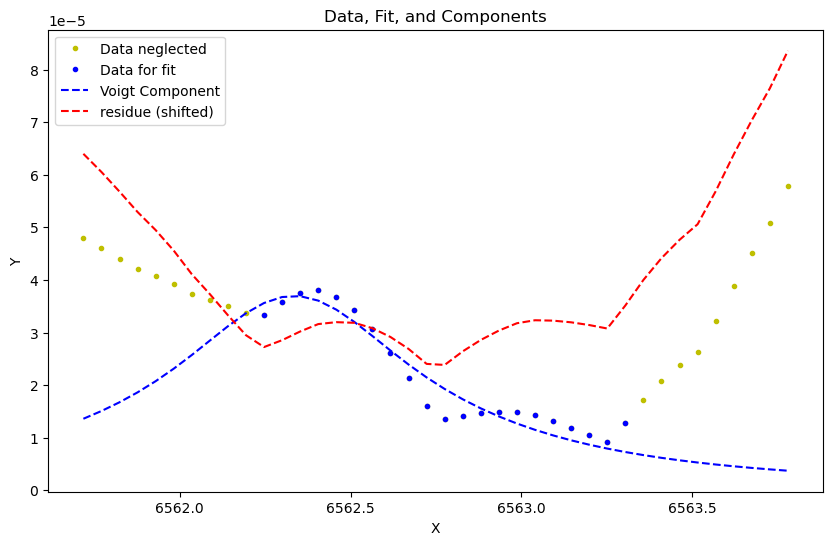

frame 120 at time 11.933333333333394 with param_fit[-1] = (array([ 1.17249097e-04,  6.56270791e+03, -4.40220533e-01, -5.79767561e-01]), array([2.57237515e-06, 1.19114823e-02, 1.36446176e+00, 1.20819621e+00])). Here comes the plot:


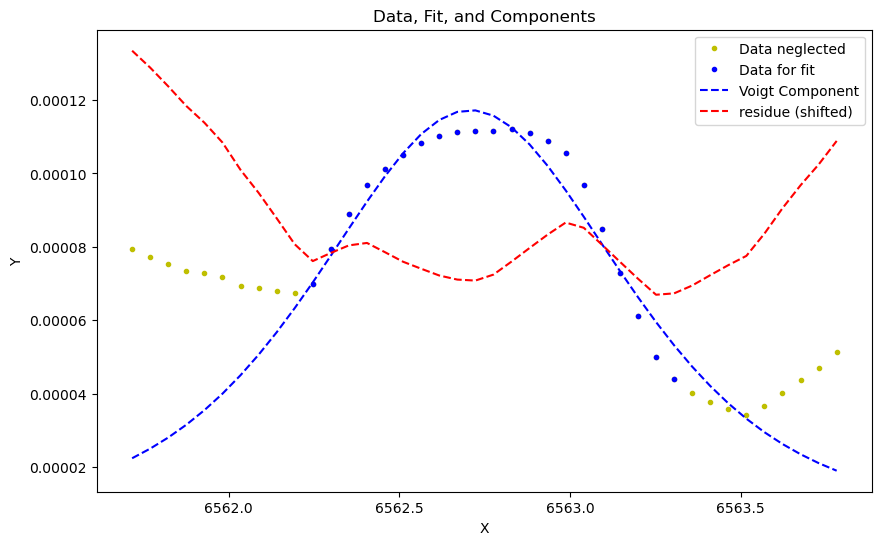

frame 160 at time 14.583333333333371 with param_fit[-1] = (array([ 2.08884049e-04,  6.56270444e+03,  4.22444365e-01, -5.40507484e-01]), array([4.32955396e-06, 1.02947751e-02, 8.97982978e-01, 8.47429747e-01])). Here comes the plot:


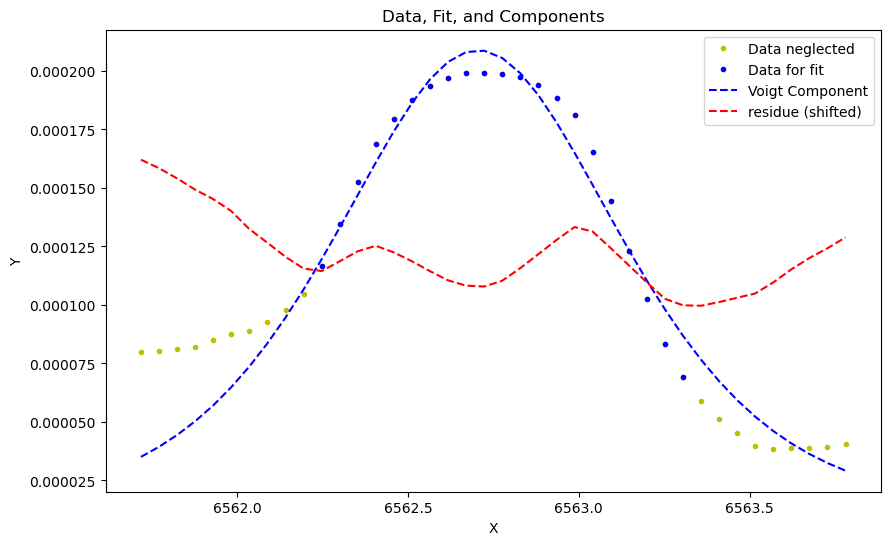

frame 200 at time 17.23333333333335 with param_fit[-1] = (array([ 3.43414723e-04,  6.56272676e+03,  3.86669729e-01, -4.73125846e-01]), array([6.55508007e-06, 7.74112013e-03, 4.94784705e-01, 5.20122412e-01])). Here comes the plot:


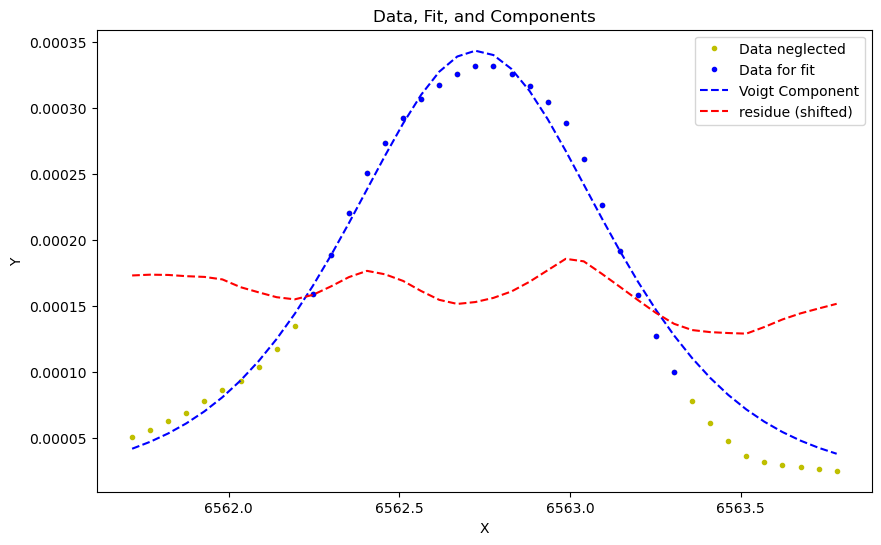

frame 240 at time 19.866666666666674 with param_fit[-1] = (array([ 4.27587897e-04,  6.56272895e+03,  3.86389764e-01, -4.75268984e-01]), array([8.20172500e-06, 7.85959853e-03, 5.18545625e-01, 5.37922063e-01])). Here comes the plot:


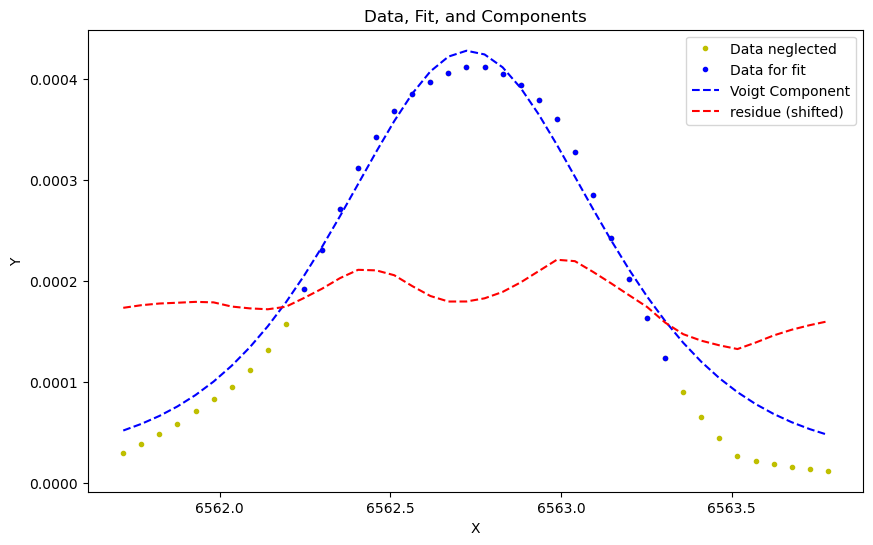

vmax = 4.242607803863223e-05, vmin = -5.173194173116933e-05


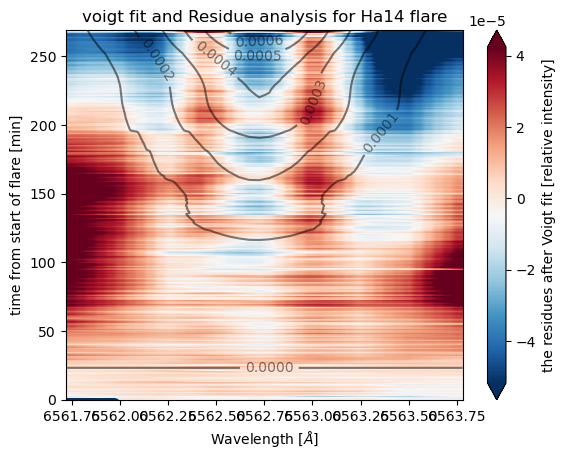

In [2]:
reload(un)
import voigt_fit as vf
reload(un2)
reload(vf)

lines = ["Ha14"]
long_names = {"Ha14":r"H$\alpha$", "CaK17":r'Ca$IIK$', "CaII17":r'Ca$II 8542 \AA$'}

off = 0
np = [0,1,2,3,4,5,6,7,8,9,-9,-8,-7,-6,-5,-4,-3,-2,-1]

data = un.load_for_further_analysis(lines)
vf.make_analysis('Ha14', data,[ 2.84297279e-04,  6.56271736e+03,  3.92943576e-01, -4.84529906e-01], 
              plot_rate=40, offset=off, neglect_points=np)

dict_keys(['area_theta_Ha17', 'FOV_Ha17', 'quiet_sun_Ha17', 'nessi_Ha17', 'TIME_Ha17', 'area_theta_CaK17', 'FOV_CaK17', 'quiet_sun_CaK17', 'nessi_CaK17', 'TIME_CaK17', 'area_theta_CaII17', 'FOV_CaII17', 'quiet_sun_CaII17', 'nessi_CaII17', 'TIME_CaII17'])
Test of contrast profile and associated curves of Ha17


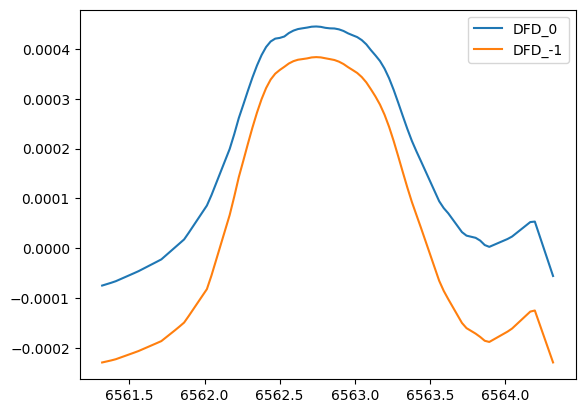

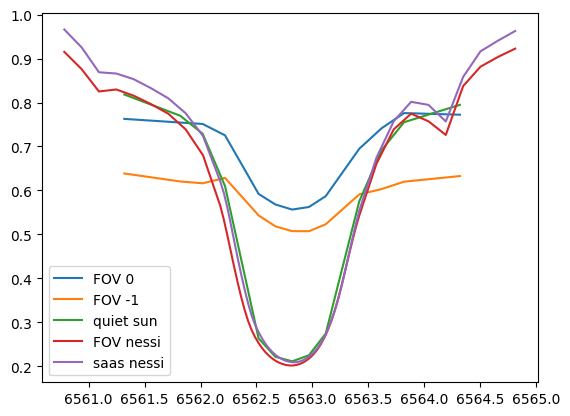

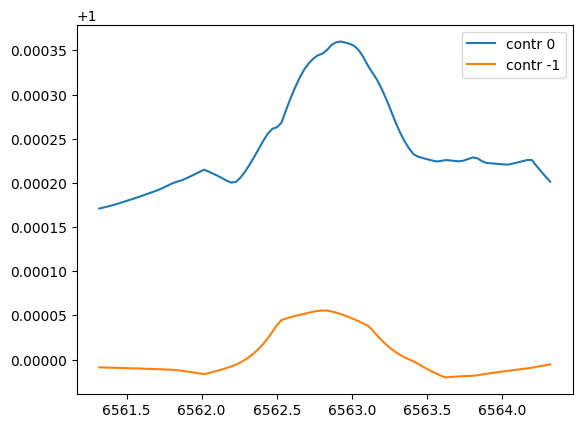

In [52]:
lines = ["Ha17", "CaK17", "CaII17"]
long_names = {"Ha17":r"H$\alpha$", "CaK17":r'Ca$IIK$', "CaII17":r'Ca$II 8542 \AA$'}


data = un.load_for_further_analysis(lines)
un2.disgard_cont_point("CaK17", data)
print(data.keys())
reload(un2)
un2.test_contrast(data, "Ha17")

range(-11, 14)
The average is 1.000209289513023
frame 0 with param_fit[-1] = (array([3.60540282e-04, 6.56290443e+03, 6.76823399e-01, 3.90007235e-01]), array([3.95898376e-06, 6.00626960e-03, 2.45528758e-02, 1.65591884e-01])). Here comes the plot:


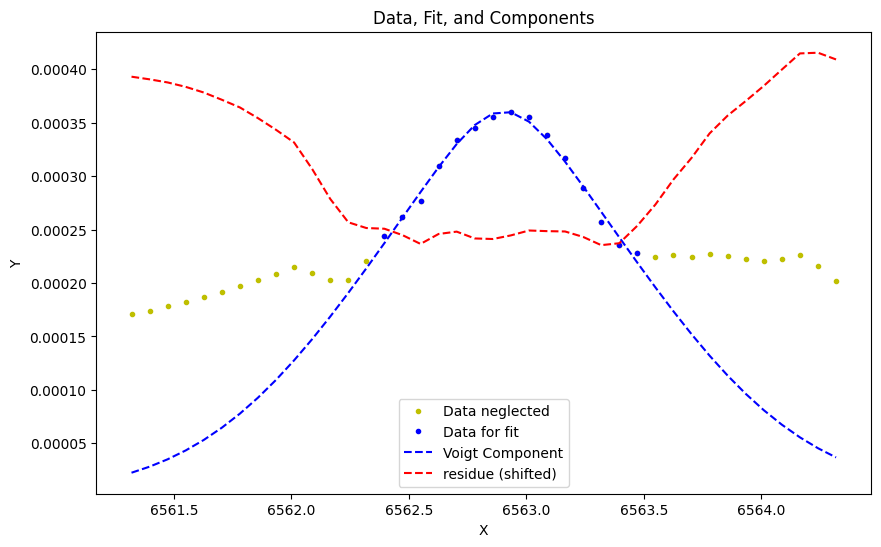

frame 50 with param_fit[-1] = (array([9.60578798e-04, 6.56285075e+03, 3.03982319e-01, 5.35847716e-01]), array([6.26457018e-06, 2.99631586e-03, 3.97554019e-02, 1.26526788e-02])). Here comes the plot:


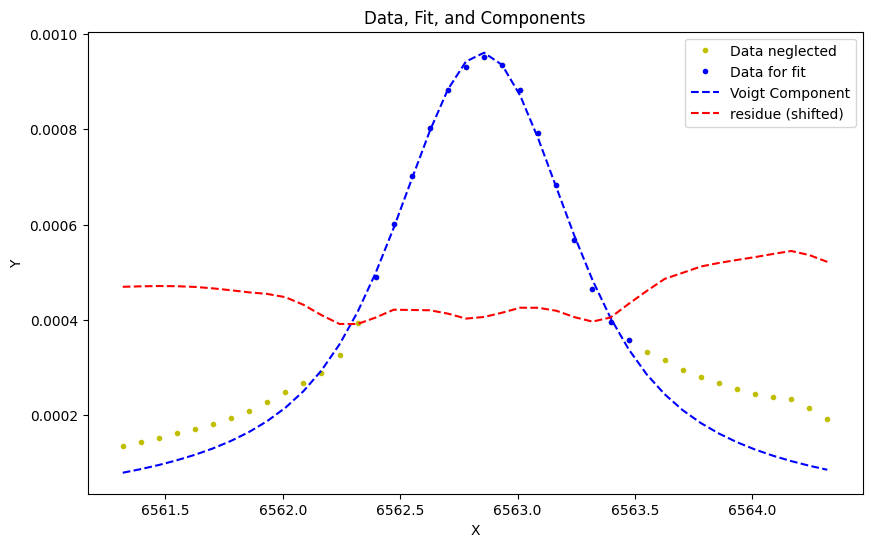

frame 100 with param_fit[-1] = (array([3.95563338e-04, 6.56282052e+03, 2.75858110e-01, 5.63592158e-01]), array([2.15698759e-06, 2.62872616e-03, 2.64719745e-02, 5.93963051e-03])). Here comes the plot:


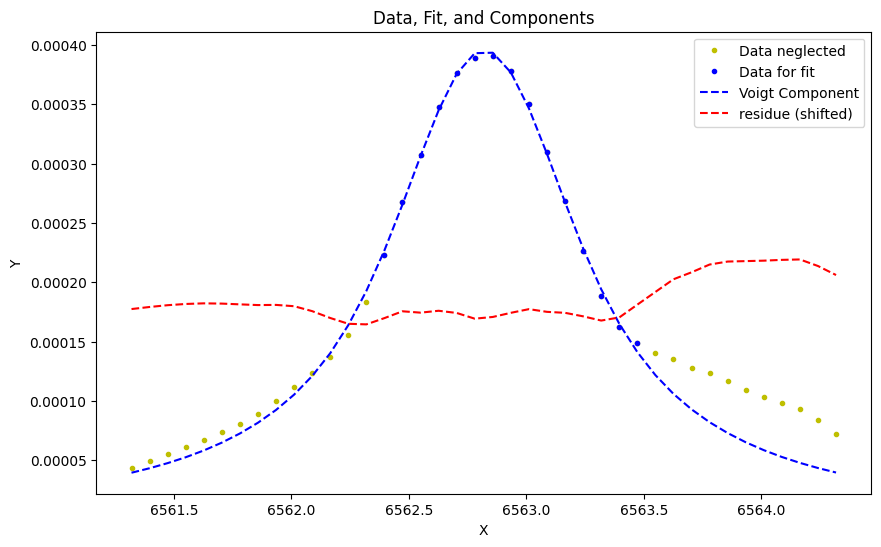

frame 150 with param_fit[-1] = (array([5.72037723e-05, 6.56277547e+03, 1.98703137e-01, 6.40434252e-01]), array([8.43910497e-07, 7.72218914e-03, 1.03503423e-01, 4.61169076e-02])). Here comes the plot:


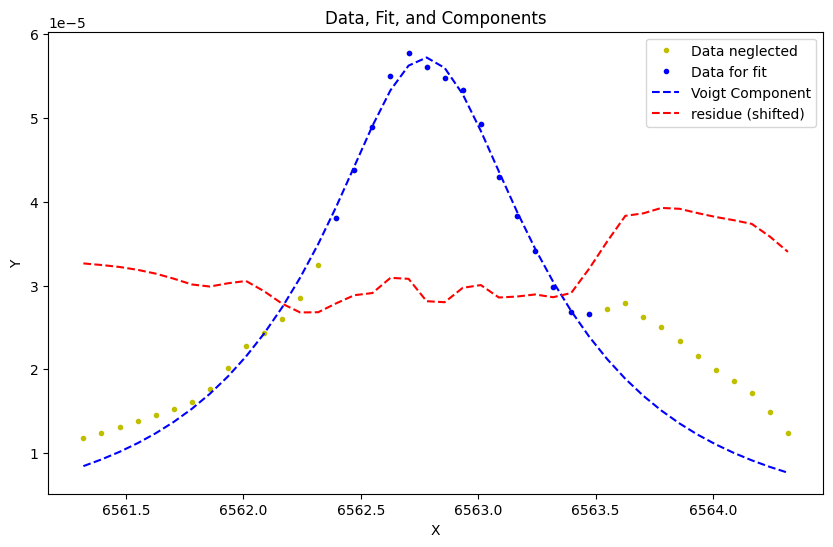

frame 200 with param_fit[-1] = (array([1.04934780e-04, 6.56285009e+03, 3.76201239e-01, 4.43253642e-01]), array([3.59236259e-06, 1.47062225e-02, 5.23036980e-01, 5.94836807e-01])). Here comes the plot:


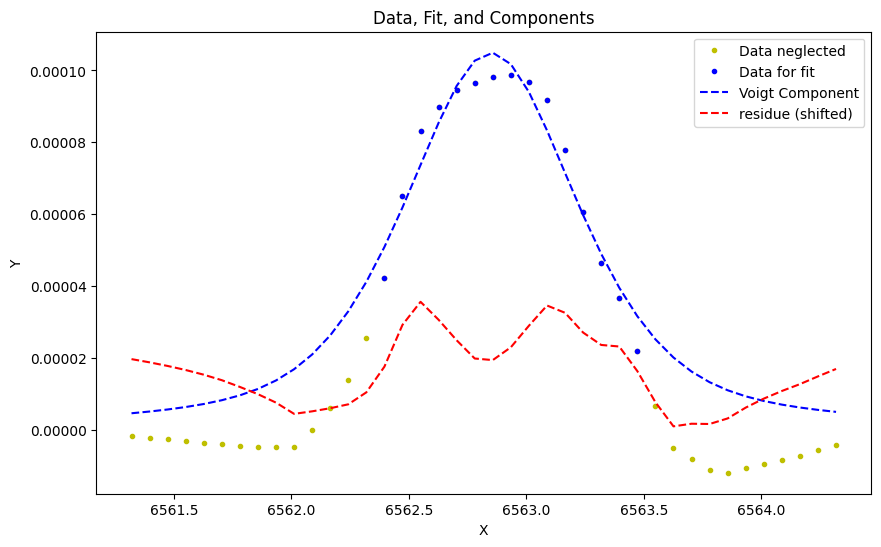

vmax = 0.00019170226632988138, vmin = -4.10829821344857e-05


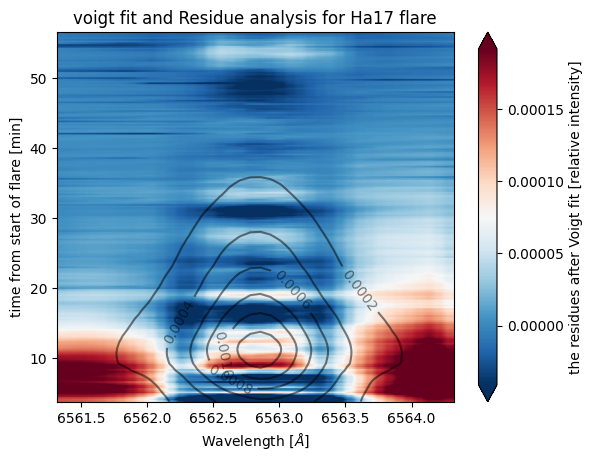

In [53]:
reload(vf)
list_exc = vf.exc_wings(13, -11)
print(list_exc)
vf.make_analysis('Ha17', data,[5.55265545e-01, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01], 
              plot_rate=50, offset=0, neglect_points=list_exc)

range(-5, 4)
The average is 1.0002303991307586
frame 0 with param_fit[-1] = (array([-5.01425667e-04,  8.54220163e+03, -1.38841087e-01, -4.77830366e-06]), array([1.03555350e-02, 1.20701111e-02, 1.26296058e-02, 4.22385062e+02])). Here comes the plot:


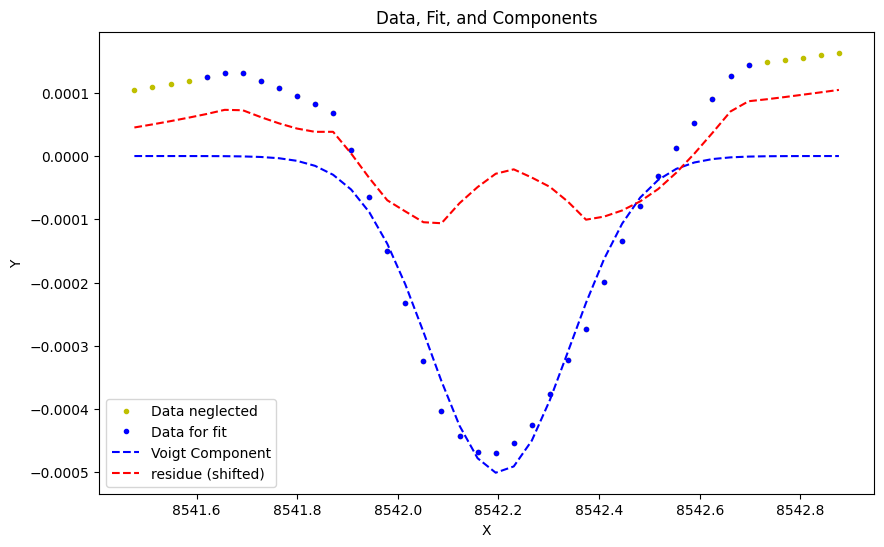

At frame 2 the voigt fitting was not succesfull and previous params are used. 
At frame 4 the voigt fitting was not succesfull and previous params are used. 
At frame 5 the voigt fitting was not succesfull and previous params are used. 
At frame 11 the voigt fitting was not succesfull and previous params are used. 
frame 50 with param_fit[-1] = (array([ 9.75386169e-04,  8.54217589e+03,  2.92795681e-01, -3.61022308e-01]), array([1.51096834e-05, 5.45065365e-03, 1.07110360e-01, 1.00674185e-01])). Here comes the plot:


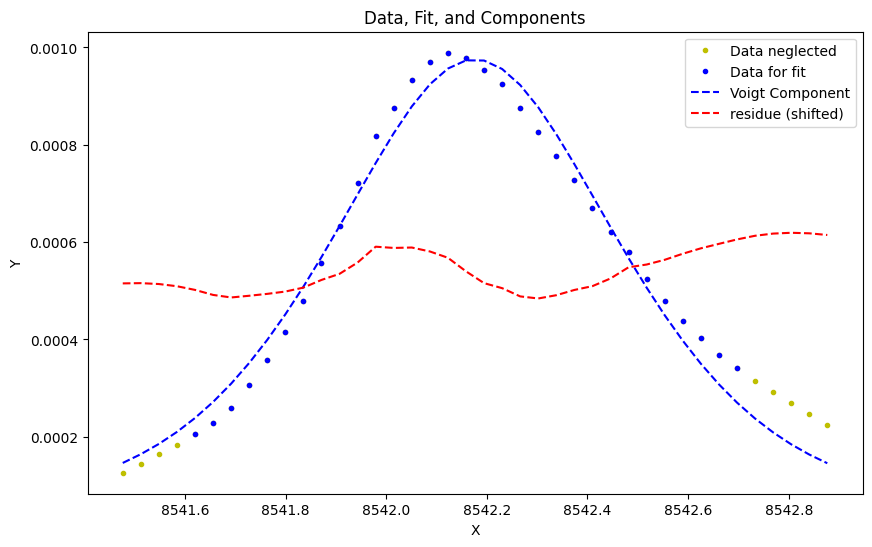

frame 100 with param_fit[-1] = (array([ 3.46330110e-04,  8.54217907e+03, -3.52260762e-01, -4.24203360e-01]), array([9.29944076e-06, 1.01571116e-02, 5.16164255e-01, 5.58932761e-01])). Here comes the plot:


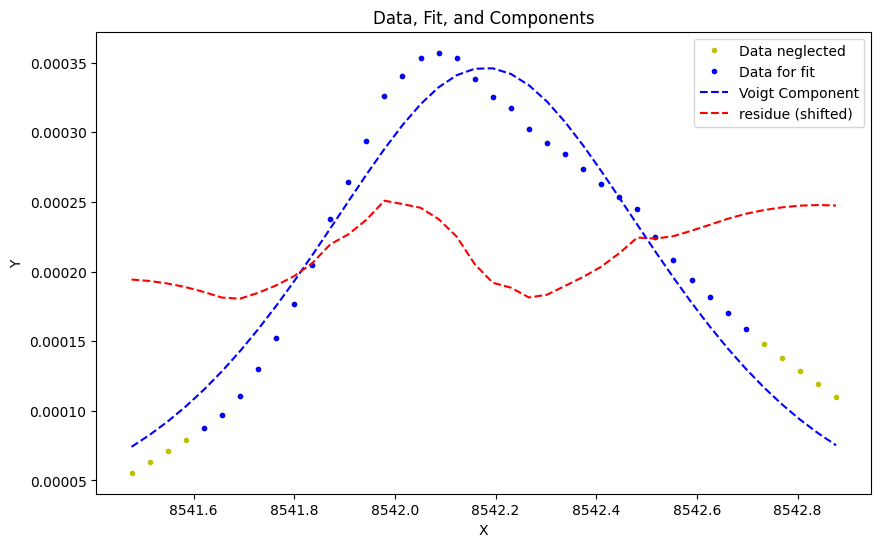

At frame 103 the voigt fitting was not succesfull and previous params are used. 
At frame 108 the voigt fitting was not succesfull and previous params are used. 
frame 150 with param_fit[-1] = (array([ 7.00000000e-05,  8.54220317e+03, -2.84932183e-01, -2.61301961e-04]), array([1.31736352e-03, 2.51975414e-02, 2.69844849e-02, 2.90972742e+03])). Here comes the plot:


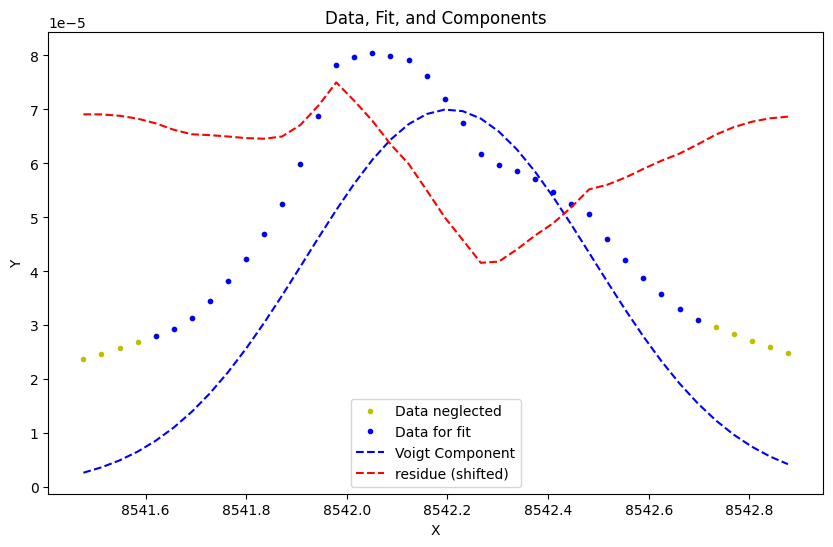

frame 200 with param_fit[-1] = (array([ 1.16188456e-04,  8.54220375e+03, -1.33745383e-01,  4.36042625e-05]), array([4.98491150e-04, 1.76936374e-03, 1.77350043e-03, 2.27790488e+02])). Here comes the plot:


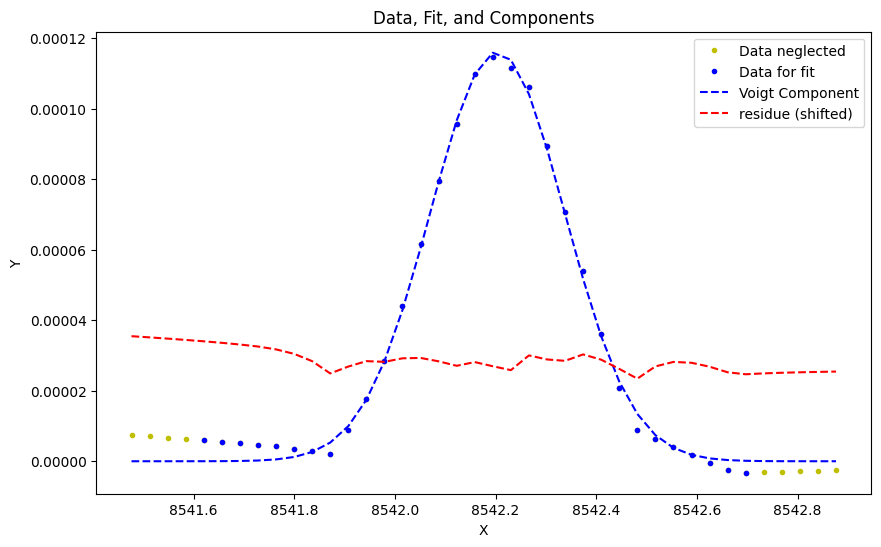

vmax = 0.0006168194113453887, vmin = -2.2671483824939697e-05


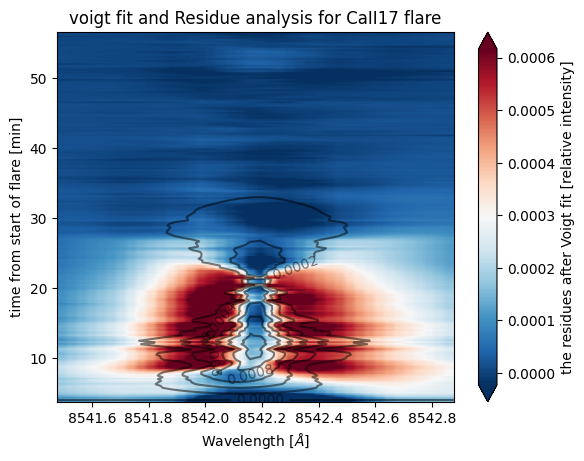

In [56]:
list_exc = vf.exc_wings(3,-5)
print(list_exc)
vf.make_analysis('CaII17', data,[7*10**-5,  8.542203173e+03, -2.84932183e-01, -2.61301961e-04],
                 plot_rate=50, offset=10**-5, neglect_points=list_exc, fix_ind=[0,1, 2, 3])


The average is 1.001267554112325
frame 0 with param_fit[-1] = (array([ 1.95422682e-03,  3.93385427e+03,  4.61640106e-01, -7.31365622e-01]), array([5.82156657e-05, 1.89691747e-02, 1.55709188e-01, 6.16529605e-02])). Here comes the plot:


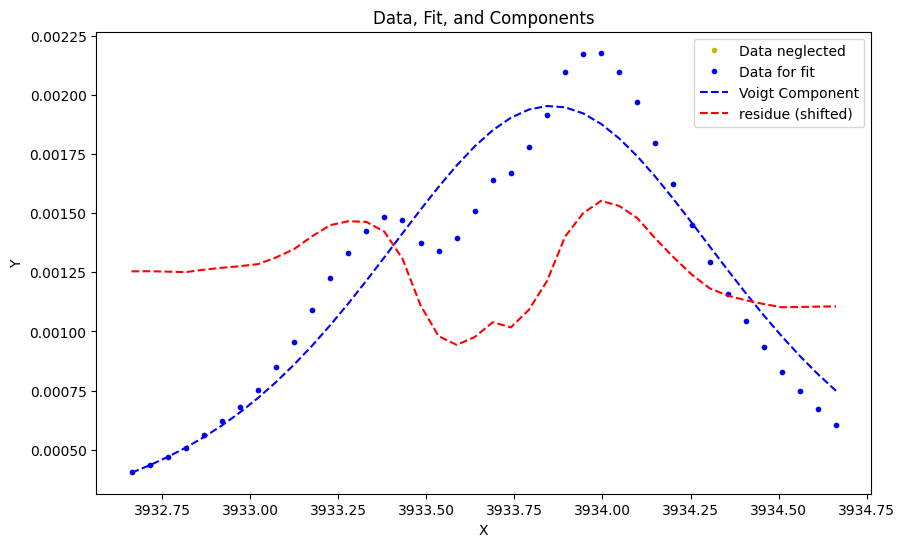

frame 50 with param_fit[-1] = (array([ 7.68310897e-03,  3.93367204e+03, -9.15312249e-02, -3.23455388e-01]), array([6.31478674e-05, 2.32238202e-03, 2.93285372e-02, 1.19978316e-02])). Here comes the plot:


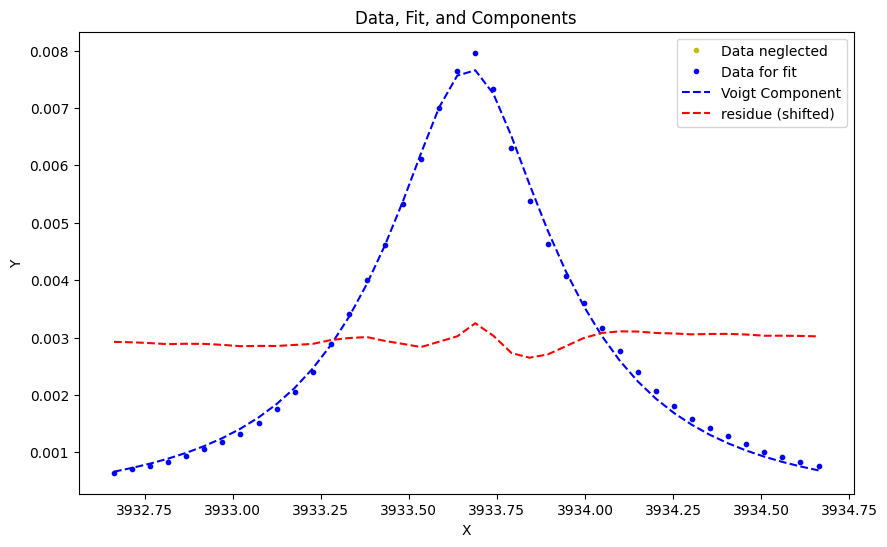

frame 100 with param_fit[-1] = (array([ 6.22155955e-03,  3.93368951e+03, -2.77586622e-02, -3.18984929e-01]), array([0.00010935, 0.00302613, 0.04596716, 0.00554026])). Here comes the plot:


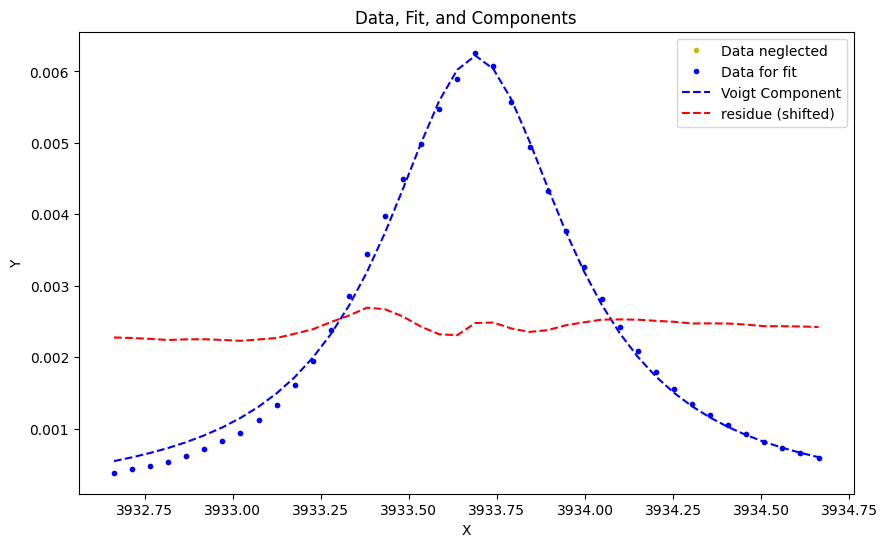

frame 150 with param_fit[-1] = (array([ 4.57351392e-03,  3.93370101e+03, -1.76526136e-03, -3.17513790e-01]), array([5.64527714e-01, 3.62341667e-03, 3.14561871e+03, 5.63207351e-03])). Here comes the plot:


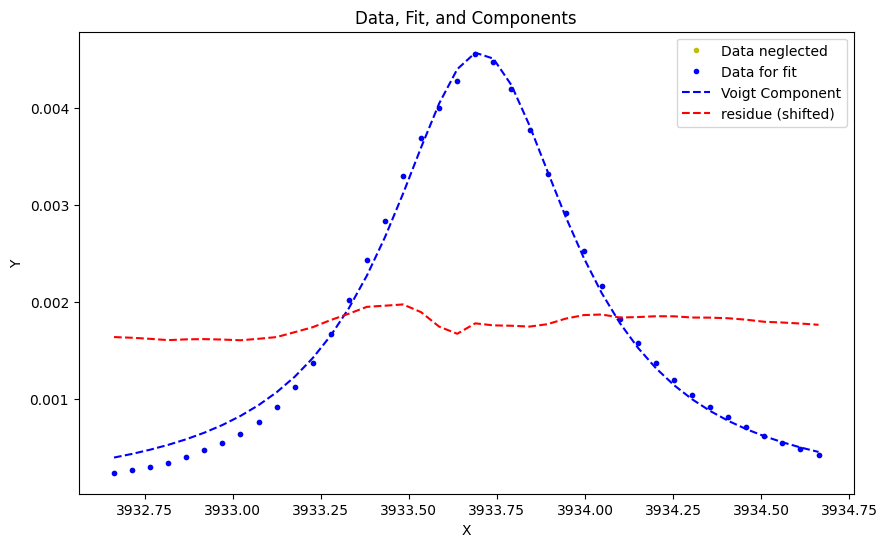

frame 200 with param_fit[-1] = (array([ 2.70274578e-03,  3.93369061e+03, -9.35193533e-06, -3.22302057e-01]), array([inf, inf, inf, inf])). Here comes the plot:


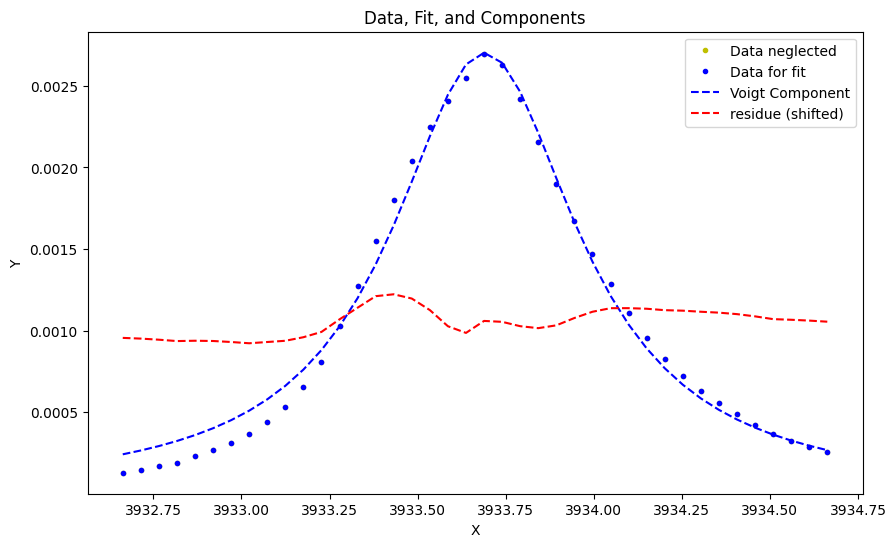

frame 250 with param_fit[-1] = (array([ 1.56230121e-03,  3.93370415e+03, -2.59671450e-03, -3.49360817e-01]), array([6.20750443e-01, 7.58436040e-03, 9.33853495e+03, 1.13442803e-02])). Here comes the plot:


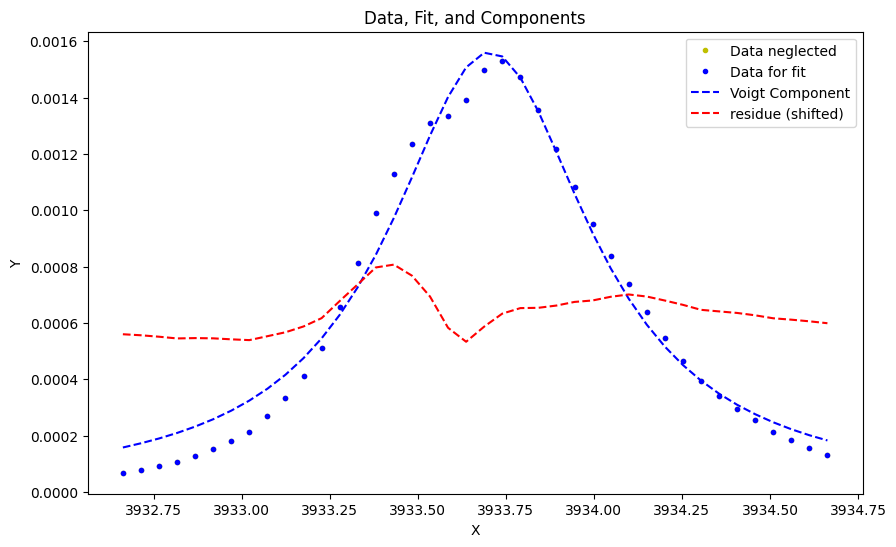

frame 300 with param_fit[-1] = (array([ 1.18159503e-03,  3.93368781e+03, -3.92920500e-02, -2.53387134e-01]), array([1.47849338e-05, 2.40107288e-03, 2.18296822e-02, 5.49369795e-03])). Here comes the plot:


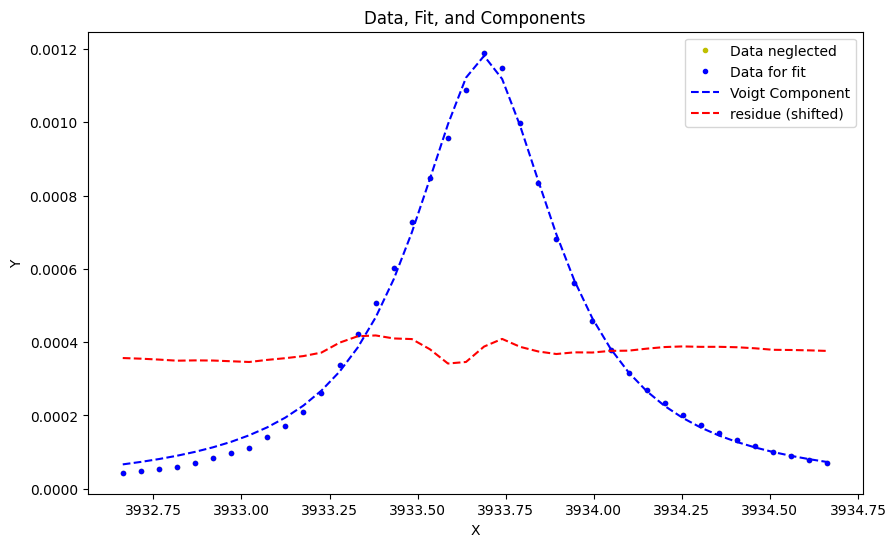

frame 350 with param_fit[-1] = (array([ 4.23815339e-04,  3.93364247e+03, -1.21174571e-01, -2.68088932e-01]), array([1.16686878e-05, 5.38033050e-03, 3.44046341e-02, 1.39233573e-02])). Here comes the plot:


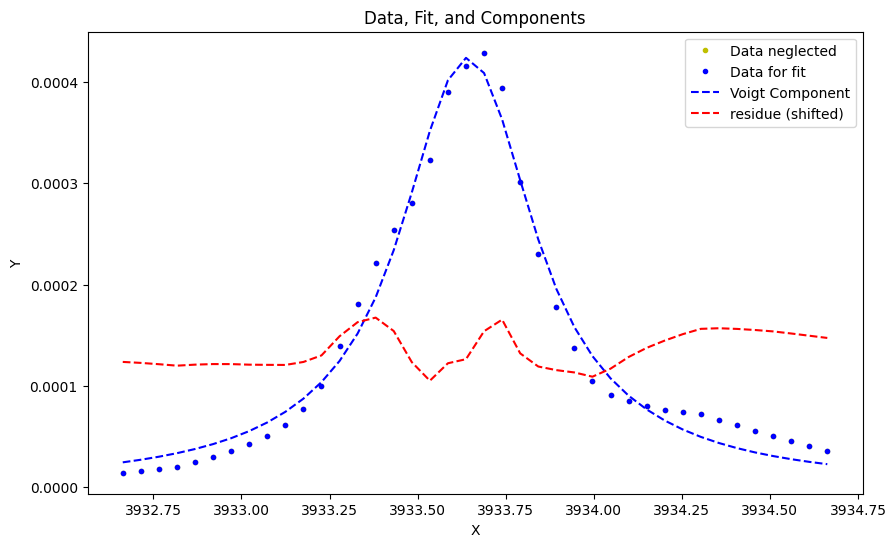

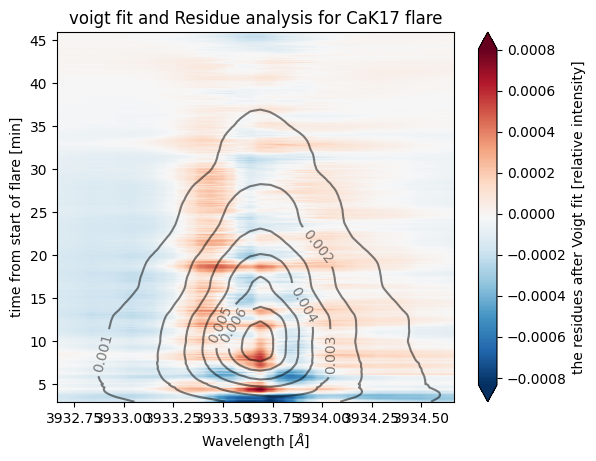

In [57]:
vf.make_analysis('CaK17', data,[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], plot_rate=50, offset=0)

# X2.2 flare at 9 o'clock

In [58]:
lines = ["Ha17_9u"]
long_names = {"Ha17_9u":r"H$\alpha$"}

data = un.load_for_further_analysis(lines)
data.keys()

dict_keys(['area_theta_Ha17_9u', 'FOV_Ha17_9u', 'quiet_sun_Ha17_9u', 'nessi_Ha17_9u', 'TIME_Ha17_9u'])

The average is 1.000072246325216
frame 0 with param_fit[-1] = (array([ 6.26070879e-04,  6.56285398e+03, -5.08433311e-04,  3.41115706e-01]), array([4.11043463e-05, 1.21567567e-02, 8.99600554e+00, 2.14184492e-02])). Here comes the plot:


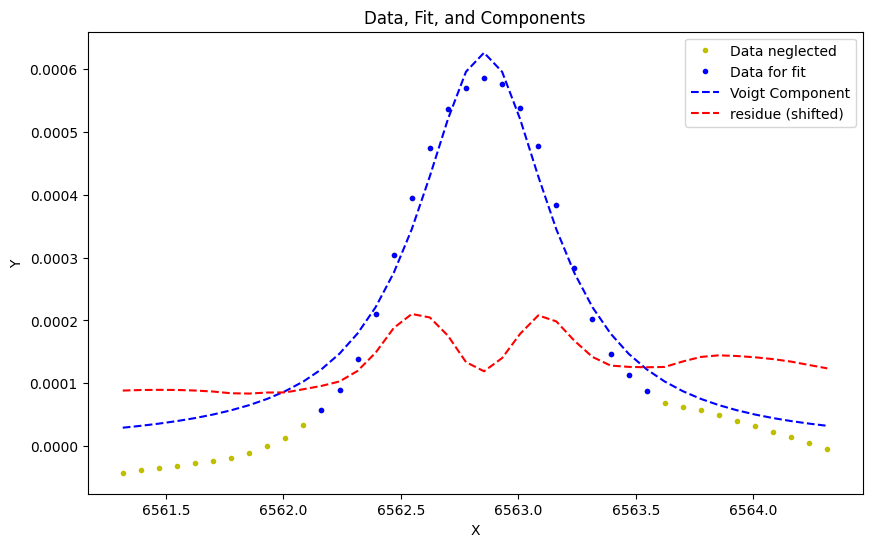

frame 150 with param_fit[-1] = (array([1.09386871e-04, 6.56277519e+03, 2.63236145e-01, 9.28543095e-05]), array([1.88493301e-04, 1.15741950e-02, 1.16159392e-02, 6.43369421e+02])). Here comes the plot:


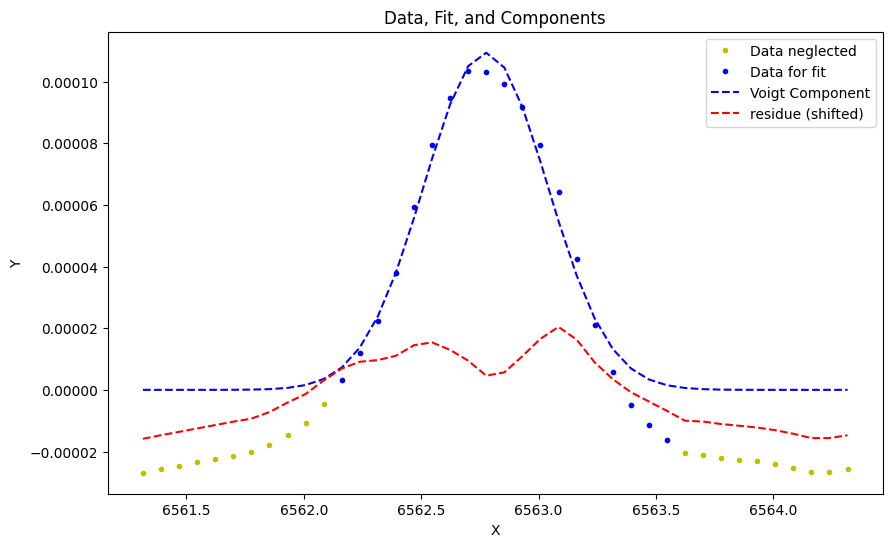

At frame 198 the voigt fitting was not succesfull and previous params are used. 
vmax = 6.50399901940184e-05, vmin = -5.218458678205845e-05


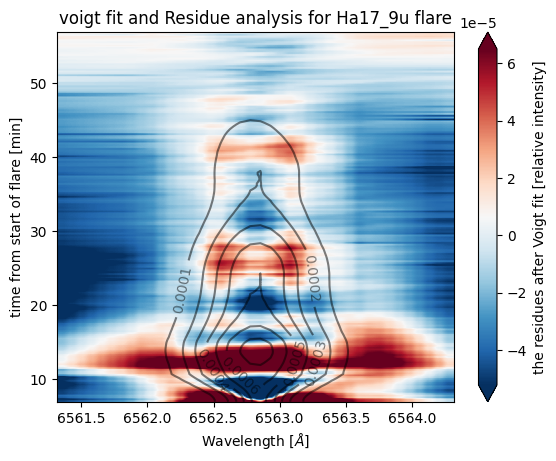

In [59]:
initial_guesses = {'Ha':[5.55265545e-01*0.71, 6.56293638e+03, 5.29257897e-01*0.71, 4.96399919e-01/0.71]}
list_neglect_points = [vf.exc_wings(10,-10)]
make_full_analysis(data, lines, init_guesses=initial_guesses, offsets=[0], 
                   plot_rate=150, list_neglect_points=list_neglect_points)


# the C1.3 flare 2013

dict_keys(['area_theta_Ha13', 'FOV_Ha13', 'quiet_sun_Ha13', 'nessi_Ha13', 'TIME_Ha13'])
The average is 1.0000177737004239
frame 0 with param_fit[-1] = (array([3.32123849e-04, 6.56280555e+03, 2.88133442e-01, 8.52393198e-05]), array([3.14734778e-04, 1.18368858e-02, 1.14311518e-02, 4.91387914e+02])). Here comes the plot:


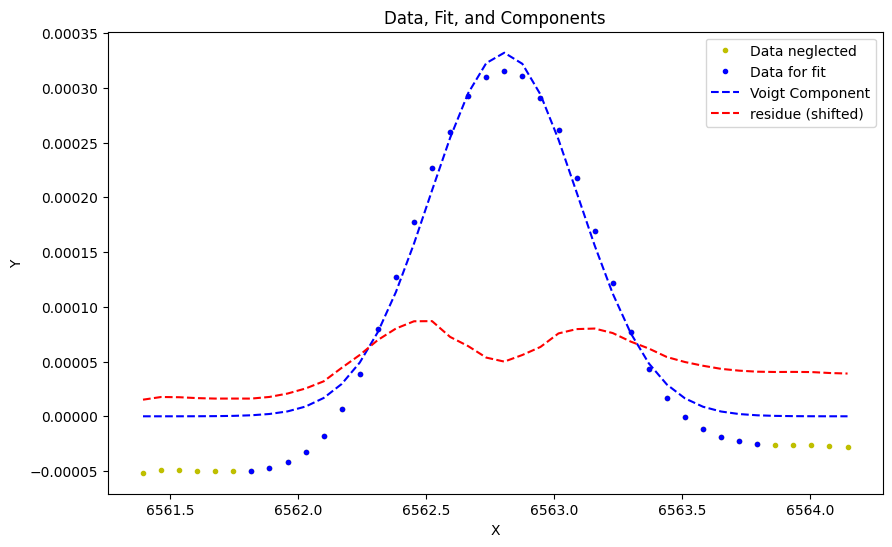

frame 250 with param_fit[-1] = (array([ 3.51118926e-05,  6.56281132e+03,  3.32254628e-01, -2.66830445e-04]), array([3.83704273e-04, 1.74967406e-02, 1.60369442e-02, 2.24988609e+03])). Here comes the plot:


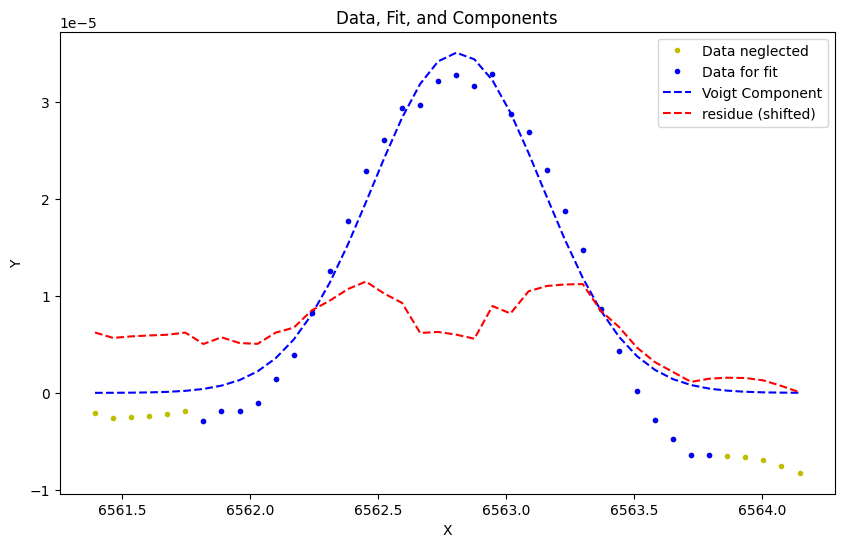

At frame 366 the voigt fitting was not succesfull and previous params are used. 
frame 500 with param_fit[-1] = (array([-6.27976459e-06,  6.56279951e+03,  3.13376827e-01,  1.85385762e-04]), array([2.11605416e-05, 1.37621148e-02, 1.38809608e-02, 9.01610184e+02])). Here comes the plot:


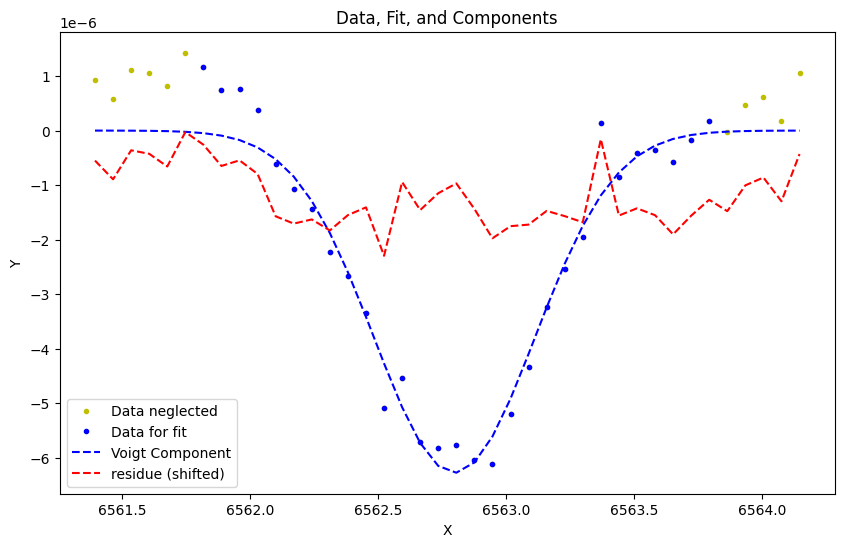

vmax = 3.0204283760739736e-05, vmin = -9.525835060417507e-05


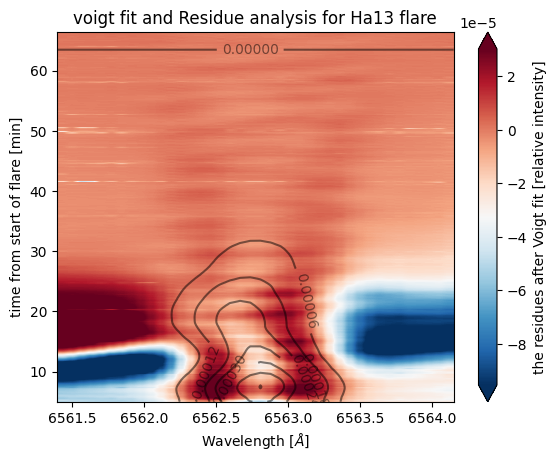

In [60]:
reload(un)
lines = ["Ha13"]
long_names = {"Ha13":r"H$\alpha$ 2013"}

data = un.load_for_further_analysis(lines)
print(data.keys())


initial_guesses = {'Ha':[5.55265545e-01*0.88, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01]}
lnp=[[0,1,2,3,4,5,-5,-4,-3, -2, -1]]
make_full_analysis(data, lines, offsets=[0], plot_rate=250, init_guesses=initial_guesses, list_neglect_points=lnp)

# C2.2 flare 2019

dict_keys(['area_theta_CaIR19', 'FOV_CaIR19', 'quiet_sun_CaIR19', 'nessi_CaIR19', 'TIME_CaIR19', 'area_theta_Fe6173_2019', 'FOV_Fe6173_2019', 'quiet_sun_Fe6173_2019', 'nessi_Fe6173_2019', 'TIME_Fe6173_2019', 'area_theta_CaK19', 'FOV_CaK19', 'quiet_sun_CaK19', 'nessi_CaK19', 'TIME_CaK19'])
The average is 1.0000299224503588
[0 1 2 3 4 5]
frame 10 with param_fit[-1] = (array([-3.24040547e-06,  8.54196662e+03, -2.52162356e-01, -1.92634373e-04]), array([inf, inf, inf, inf])). Here comes the plot:


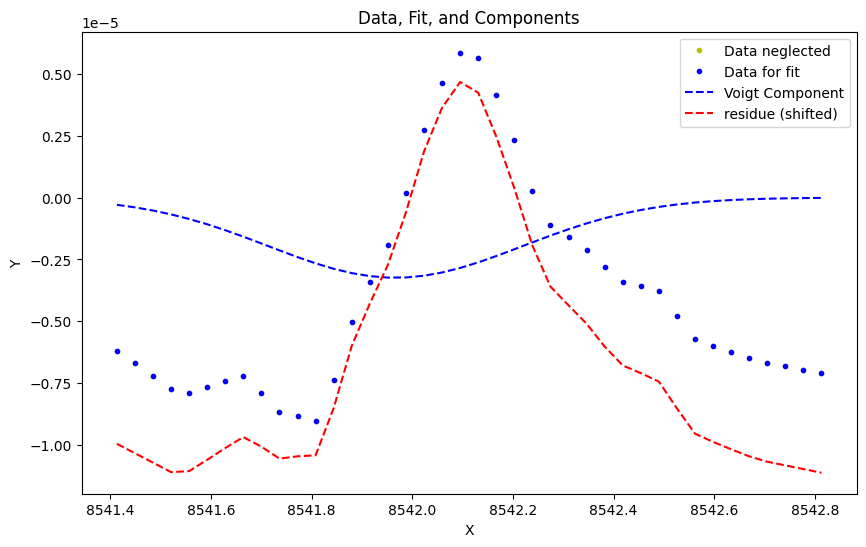

frame 20 with param_fit[-1] = (array([ 9.82356366e-05,  8.54209268e+03, -1.52232434e-01, -2.44874487e-01]), array([7.05694648e-07, 1.46612914e-03, 6.11067702e-03, 2.35932144e-03])). Here comes the plot:


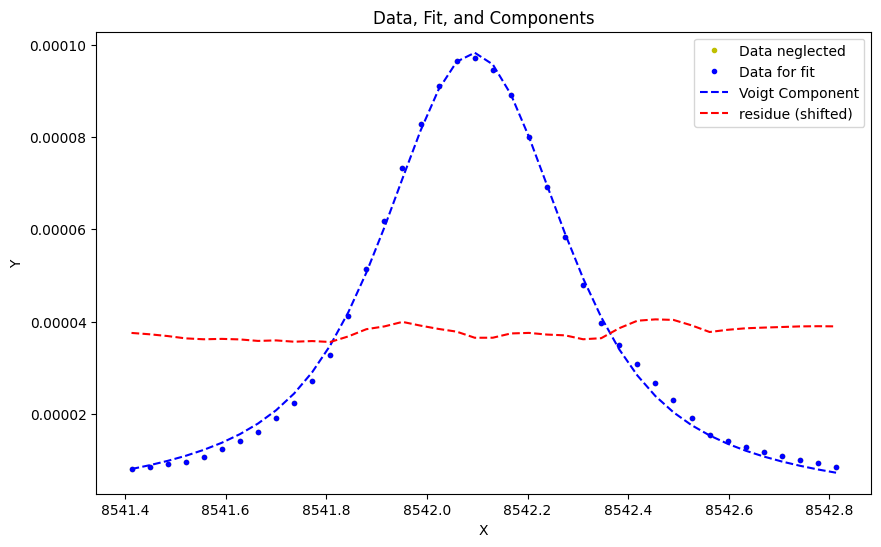

frame 30 with param_fit[-1] = (array([ 1.78066019e-04,  8.54208956e+03, -1.79044574e-01,  2.36916065e-01]), array([1.97410573e-06, 2.40138935e-03, 9.08911794e-03, 5.07702523e-03])). Here comes the plot:


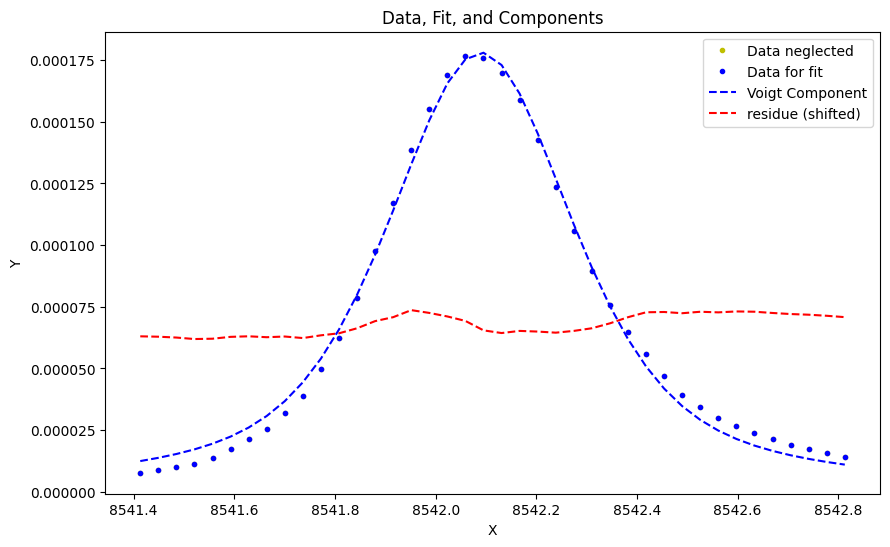

frame 40 with param_fit[-1] = (array([ 1.44621205e-04,  8.54208489e+03, -1.62115751e-01,  7.43594035e-04]), array([4.38416790e-03, 1.33179013e-02, 1.40541494e-02, 6.92627786e+02])). Here comes the plot:


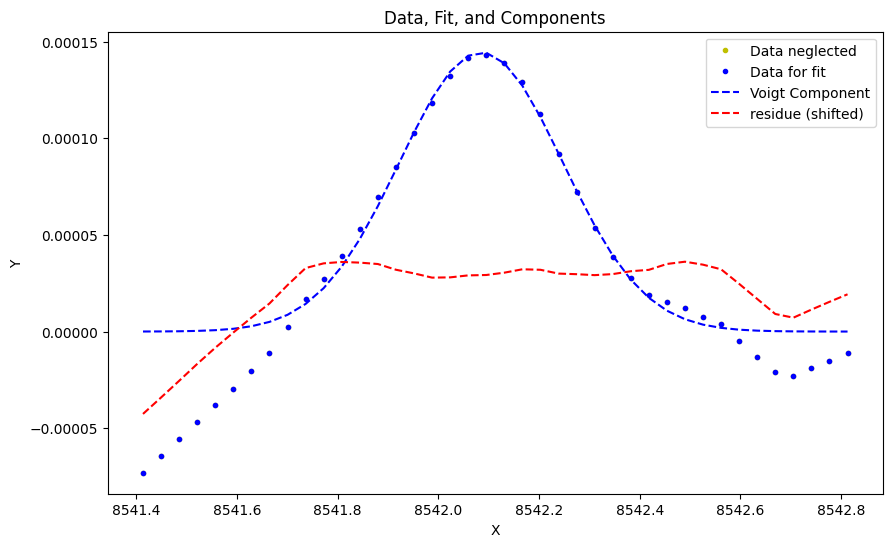

frame 50 with param_fit[-1] = (array([ 2.09678124e-04,  8.54208792e+03, -1.90010235e-01, -1.90346429e-01]), array([1.77353558e-06, 1.75787431e-03, 5.53399183e-03, 7.22966188e-03])). Here comes the plot:


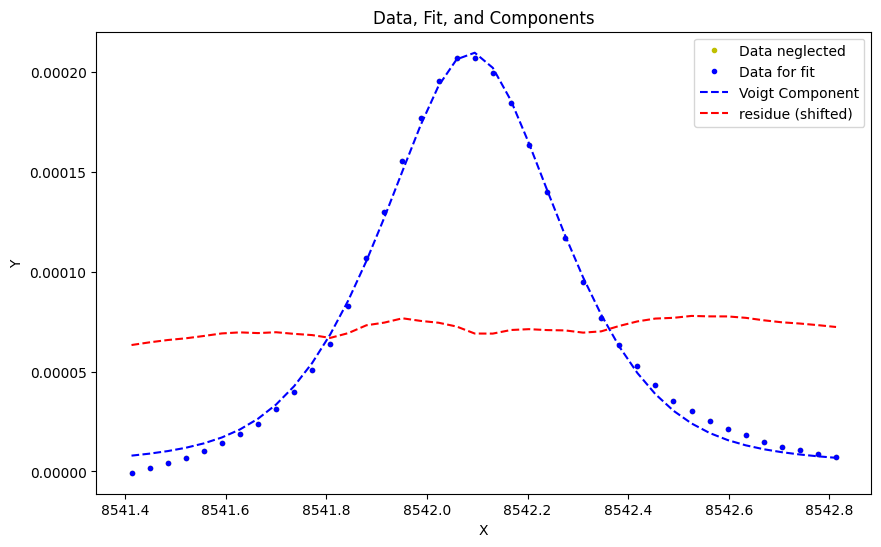

frame 60 with param_fit[-1] = (array([ 1.60899256e-04,  8.54209344e+03, -1.80486096e-01, -5.83387856e-02]), array([2.71914425e-06, 2.59820540e-03, 3.86229475e-03, 1.77098325e-02])). Here comes the plot:


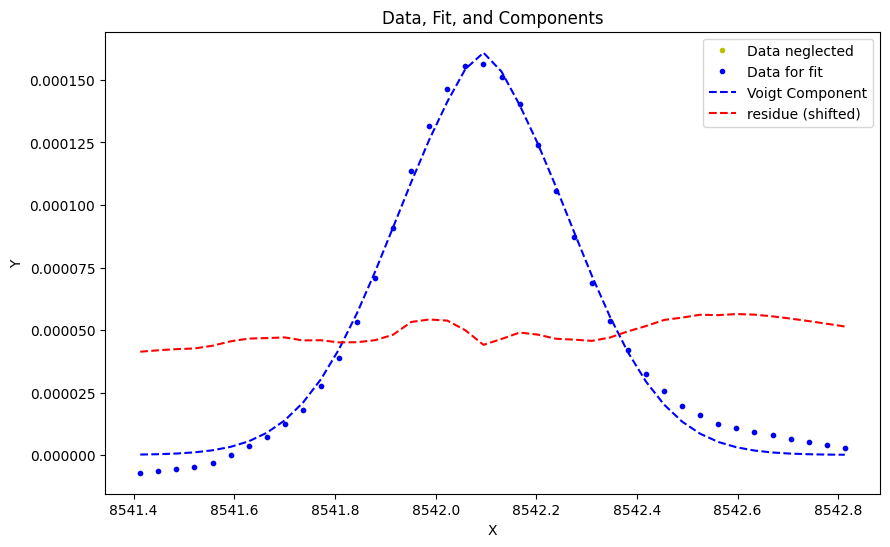

frame 70 with param_fit[-1] = (array([ 1.09453687e-04,  8.54206599e+03, -1.83649085e-01,  1.49361492e-01]), array([7.67403687e-07, 1.34438553e-03, 3.01975075e-03, 8.14582075e-03])). Here comes the plot:


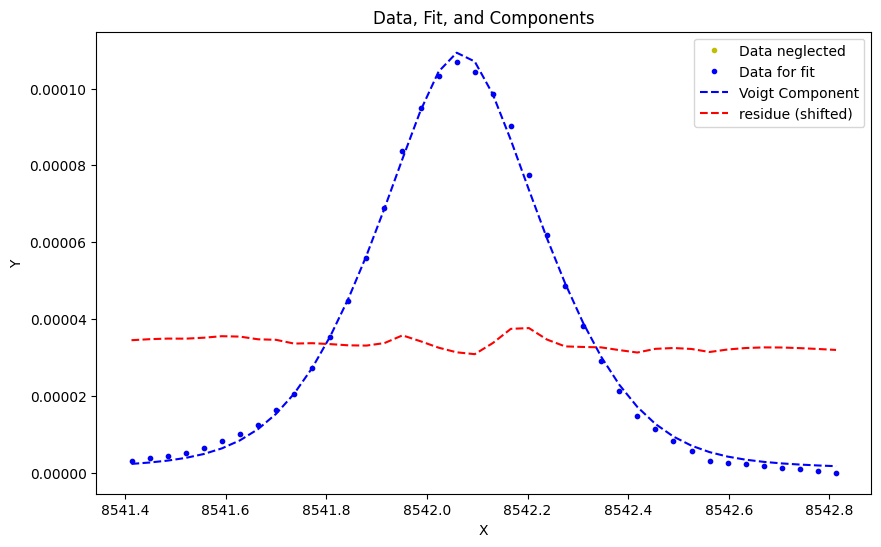

frame 80 with param_fit[-1] = (array([ 9.25538825e-05,  8.54202731e+03, -1.91048030e-01, -1.47422403e-01]), array([1.55844977e-06, 3.33131146e-03, 6.80012386e-03, 2.29736148e-02])). Here comes the plot:


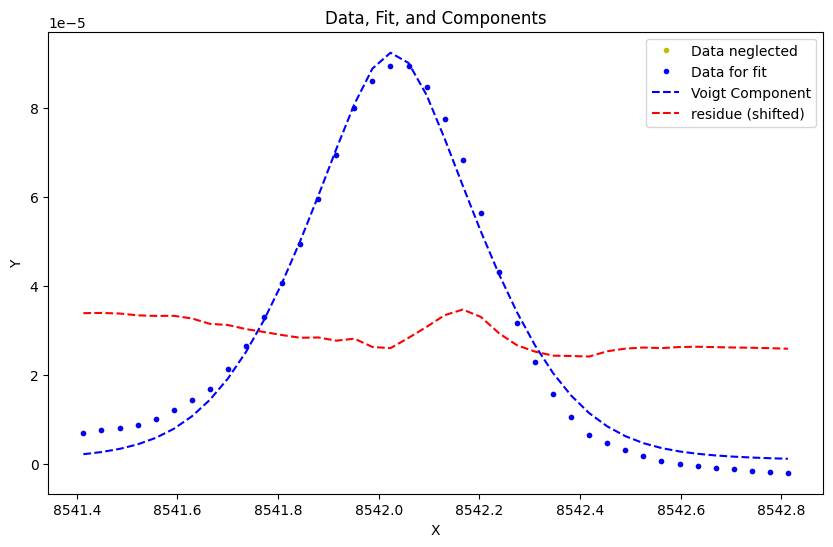

frame 90 with param_fit[-1] = (array([ 7.75750677e-05,  8.54202997e+03, -1.81556762e-01,  5.53482590e-02]), array([9.63890221e-07, 1.86856129e-03, 2.72882884e-03, 1.26129570e-02])). Here comes the plot:


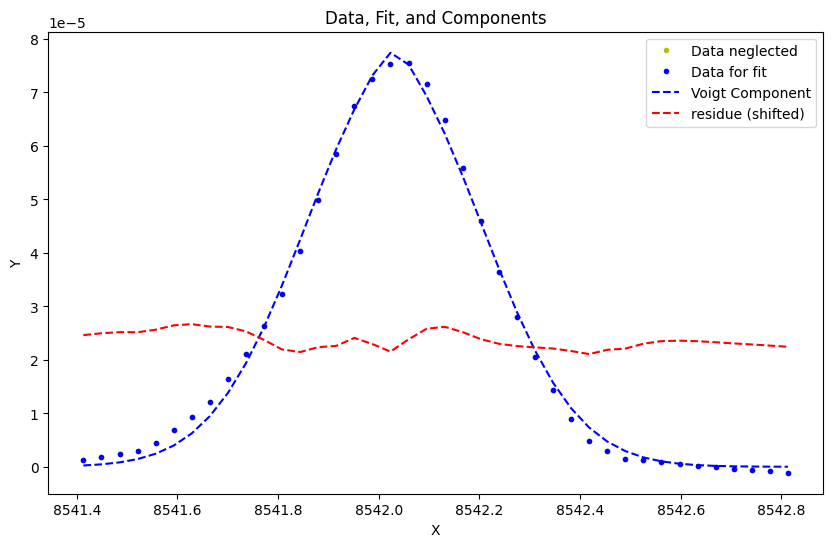

frame 100 with param_fit[-1] = (array([ 7.22552926e-05,  8.54204224e+03, -1.72299175e-01, -1.92642696e-01]), array([8.77559399e-07, 2.36763001e-03, 7.81645146e-03, 7.12069407e-03])). Here comes the plot:


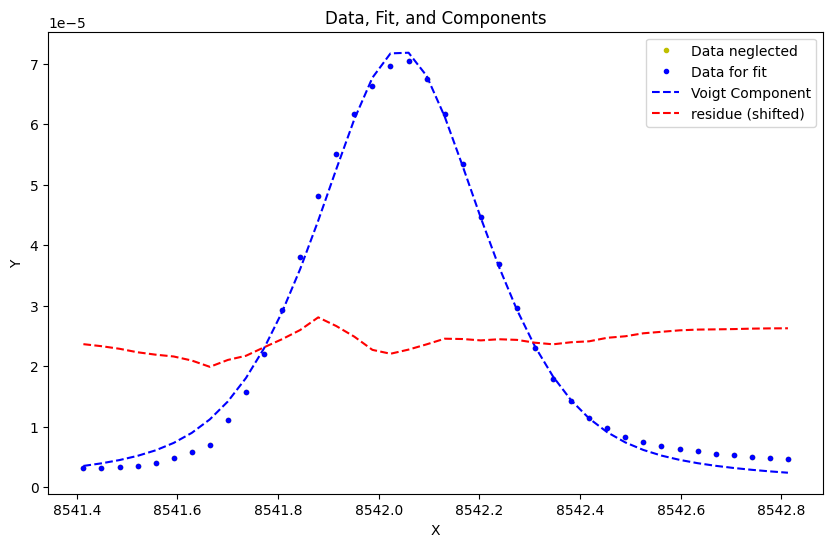

frame 110 with param_fit[-1] = (array([ 6.52949328e-05,  8.54205238e+03, -1.73079988e-01, -1.80212893e-01]), array([6.44205567e-07, 1.88830944e-03, 5.86543707e-03, 6.66179368e-03])). Here comes the plot:


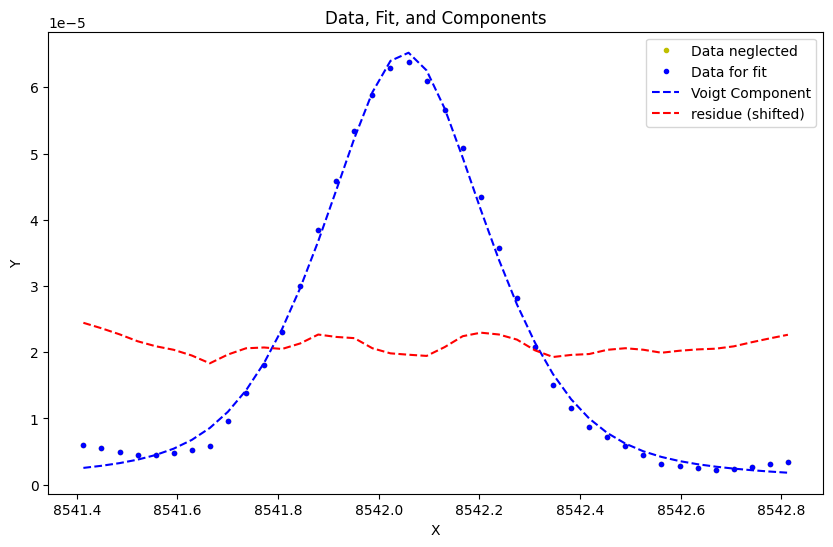

frame 120 with param_fit[-1] = (array([ 5.29693335e-05,  8.54203348e+03, -1.23339817e-01, -2.06856028e-01]), array([9.51291446e-07, 3.04173300e-03, 1.27938707e-02, 4.88900715e-03])). Here comes the plot:


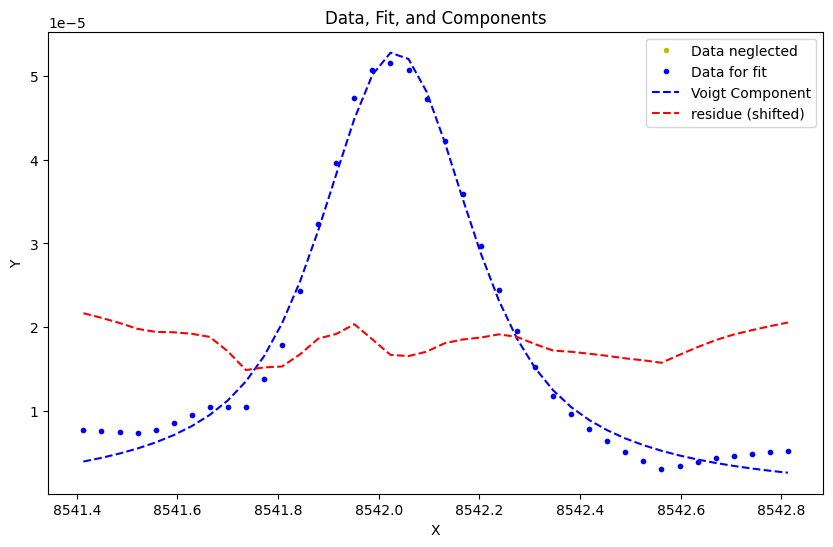

frame 130 with param_fit[-1] = (array([ 4.34753642e-05,  8.54203408e+03, -1.21908748e-01, -2.27565976e-01]), array([1.43791207e-06, 5.89819129e-03, 2.83818338e-02, 1.06924889e-02])). Here comes the plot:


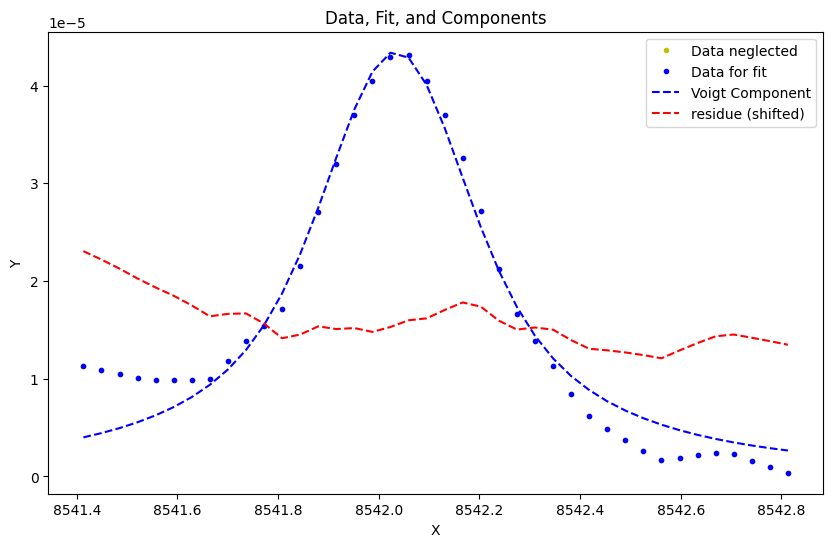

frame 140 with param_fit[-1] = (array([ 4.21268705e-05,  8.54195429e+03, -1.03894711e-01, -3.11046444e-01]), array([2.14423329e-06, 1.08397008e-02, 1.39871473e-01, 6.13067849e-02])). Here comes the plot:


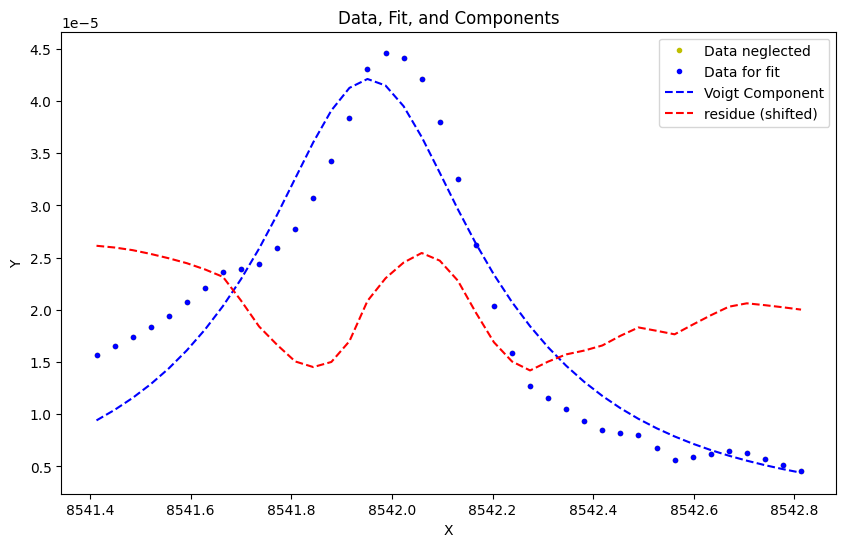

frame 150 with param_fit[-1] = (array([ 5.30555047e-05,  8.54194986e+03, -1.09707748e-01,  3.06065250e-01]), array([2.26808373e-06, 8.85270261e-03, 9.77198032e-02, 4.25179818e-02])). Here comes the plot:


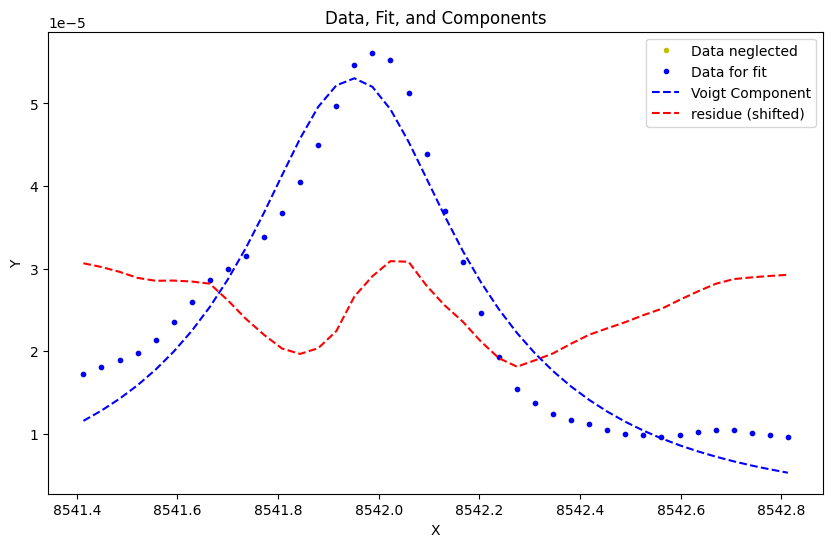

frame 160 with param_fit[-1] = (array([ 6.44420456e-05,  8.54205034e+03, -1.20420113e-01,  2.93342594e-01]), array([6.93373848e-07, 2.21630747e-03, 1.75712629e-02, 7.35997024e-03])). Here comes the plot:


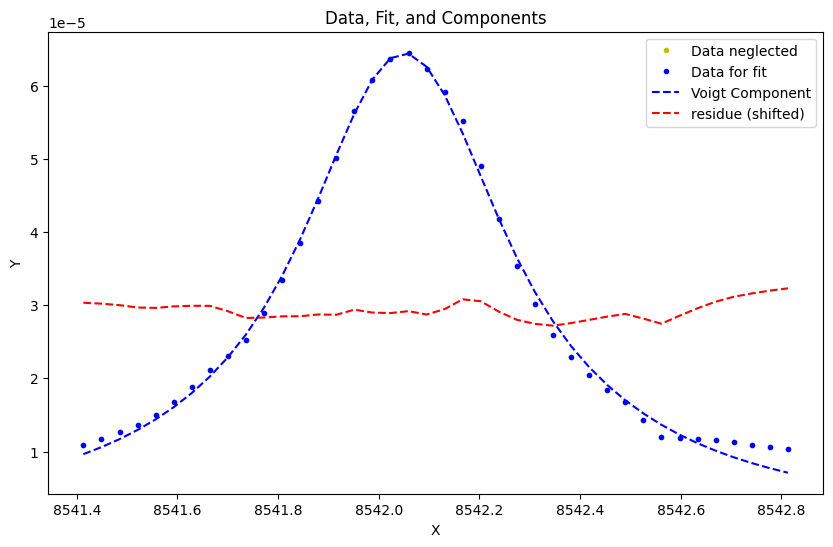

frame 170 with param_fit[-1] = (array([ 8.68837828e-05,  8.54207308e+03, -1.17895580e-01, -2.90749365e-01]), array([1.72777135e-06, 4.03730428e-03, 3.29618972e-02, 1.38751164e-02])). Here comes the plot:


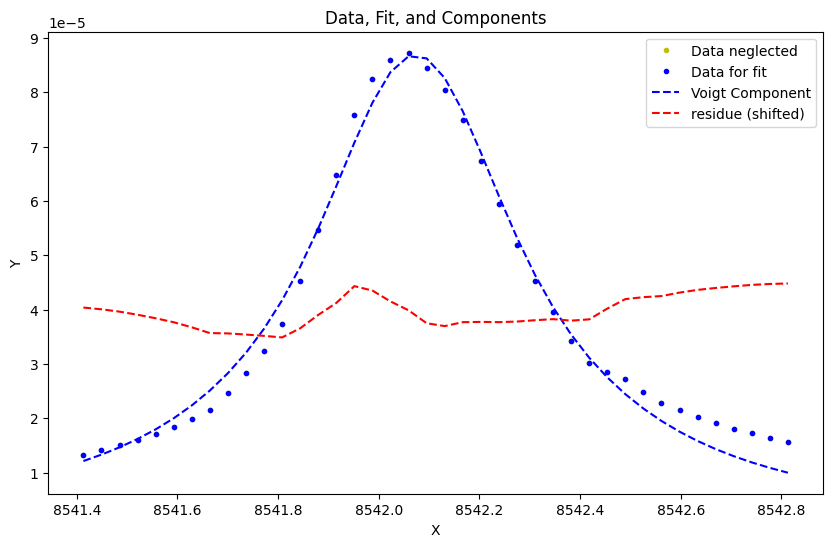

vmax = 3.0582905019087334e-05, vmin = -1.3147484002886451e-05


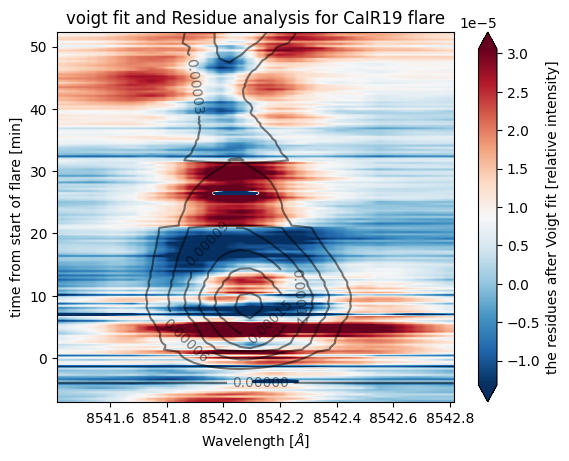

In [61]:
# Go see problematic voight fits! 


# c1 = 0.6934060535332651
# c2 = 0.7912546190700971
# c3 = 0.12995492392730582

# reload(un)
# lines = ["CaIR19", "Fe6173_2019", "CaK19"]
# offsets = [0.0, 0.0, 0.0]
# long_names = {"Fe6173_2019":r"Fe 6173", "CaK19":r'Ca$IIK$', "CaIR19":r'Ca$II 8542 \AA$'}

# data = un.load_for_further_analysis(lines)
# un2.disgard_cont_point("CaK19", data)

# print(data.keys())

# initial_guesses = {'Ha':[5.55265545e-01, 6.56293638e+03, 5.29257897e-01, 4.96399919e-01], 
#                    "CaK":[4.5*c3, 3933.675, -2.66732183e-01, 2.2284e-1], 
#                    "CaIR":[ 2.40164464e-01,  8.54196662e+03, -2.52162356e-01,  -1.92634373e-04],
#                    "Fe6173":[4.13090273e-02*c2, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
# lnp=[[], [0,1,2,3,-9, -8, -7,-6,-5,-4,-3, -2, -1], []]

# i = 0
# l = lines[i]
# make_analysis( l, data, initial_guess=[ 2.40164464e-01,  8.54196662e+03, -2.52162356e-01,  -1.92634373e-04],
#               plot_rate=10, neglect_points=vf.exc_wings(-6, 4), fix_ind=[0,1,2,3])

The average is 1.0000055574980218
[0 1 2 3 4 5]
At frame 7 the voigt fitting was not succesfull and previous params are used. 
At frame 8 the voigt fitting was not succesfull and previous params are used. 
frame 50 with param_fit[-1] = (array([ 5.36155505e+16, -2.67836707e+16, -1.87830126e+12, -2.01950455e+07]), array([inf, inf, inf, inf])). Here comes the plot:


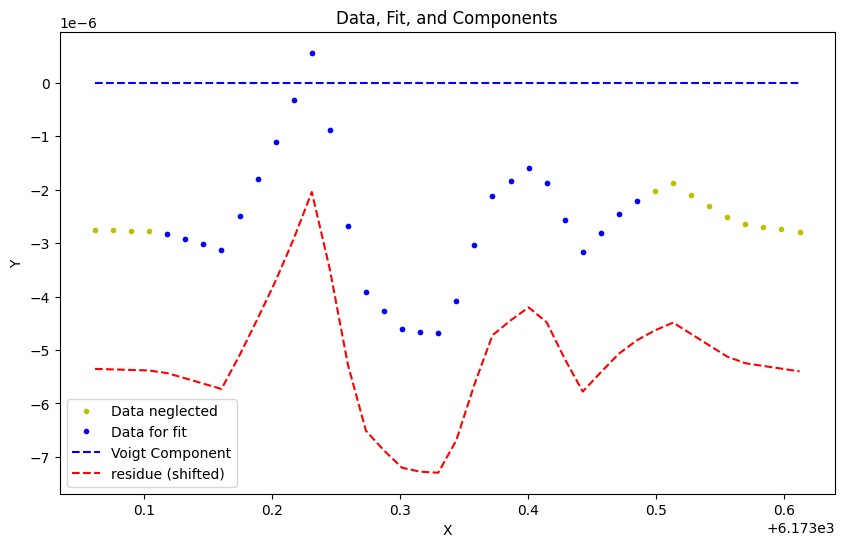

frame 100 with param_fit[-1] = (array([-4.27894761e+40, -3.27213450e+35, -3.32804293e+21, -7.75720680e+15]), array([inf, inf, inf, inf])). Here comes the plot:


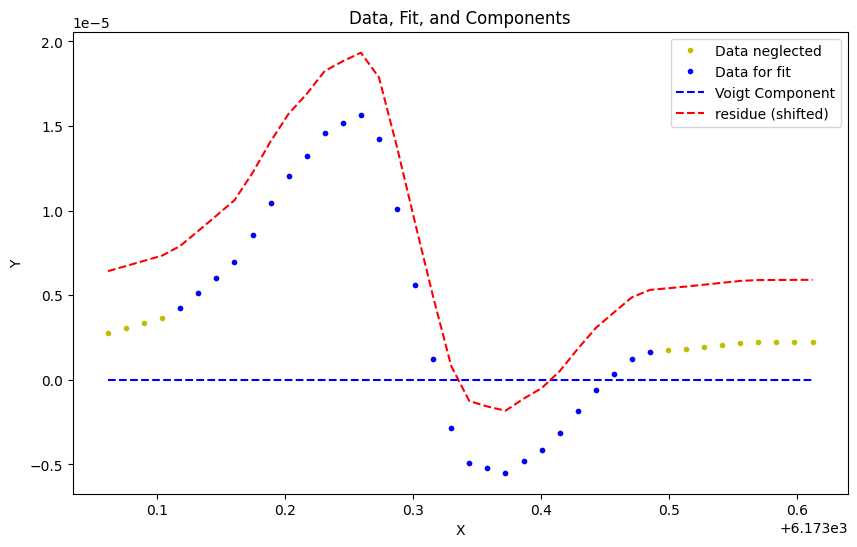

frame 150 with param_fit[-1] = (array([-2.17436196e+39, -1.66274566e+34, -1.69115673e+20, -3.94187137e+14]), array([inf, inf, inf, inf])). Here comes the plot:


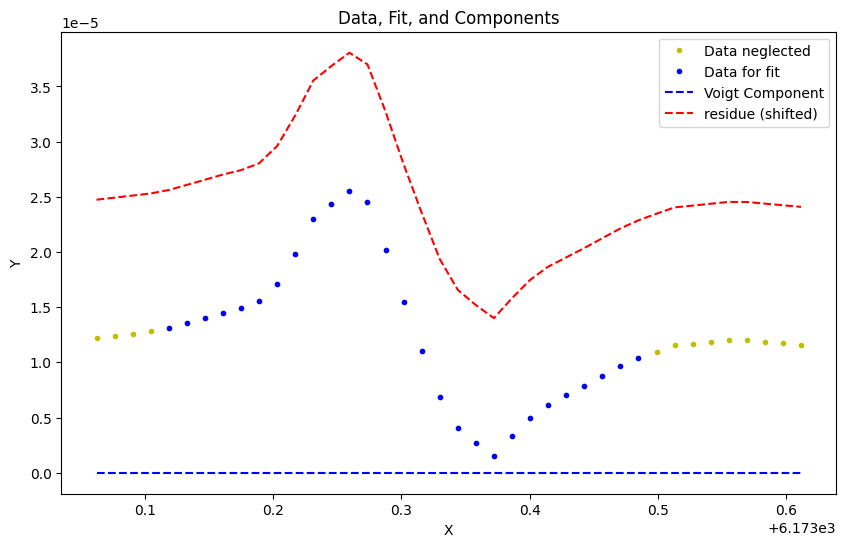

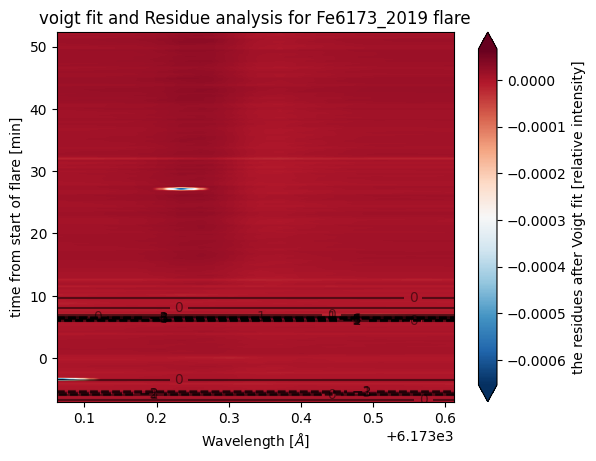

In [62]:
l = "Fe6173_2019"
make_analysis( l, data, initial_guess=[4.13090273e-02*c2, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02],
              plot_rate=50, neglect_points=vf.exc_wings(3,-9))

The average is 1.0000720271856052
At frame 17 the voigt fitting was not succesfull and previous params are used. 


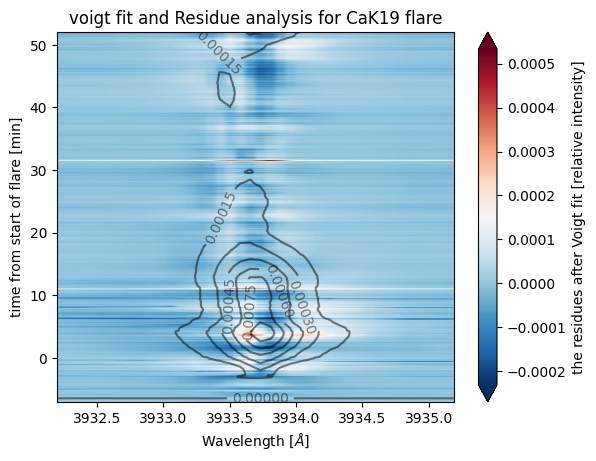

In [ ]:
l = "CaK19"
reload(vf)
vf.make_analysis(l, data, initial_guess=[4.5*c3, 3933.675, -2.66732183e-01, 2.2284e-1],
              plot_rate=500, neglect_points=vf.exc_wings(3,-9))
# Done!

# C5.6

In [ ]:
reload(un)
lines = ["CaIR15", "Ha15"]
offsets = [0,0,0]

data = un.load_for_further_analysis(lines)

print(data.keys())

initial_guesses = {'Ha':[4*10**-5, 6.56287638e+03, 2.29257897e-01, 1.96399919e-01], 
                   "CaK":[4.5, 3933.675, -2.66732183e-01, 2.2284e-1], 
                   "CaIR":[0.12,  8542.1, -2.62017731e-01,  4.46885934e-04],
                   "Fe6173":[4.13090273e-02, 6.1728106e+03, -1.55441909e-03, 4.25981451e-02]}
lnp=[[0,1,2,3,4,5,6,7,8,9,-9,-8,-7,-6, -5,-4,-3,-2,-1], [0,1,2,3,4,-5,-4,-3,-2,-1], []]

# make_full_analysis(data, lines, offsets=offsets, init_guesses=initial_guesses, plot_rate=250, list_neglect_points=lnp)



dict_keys(['area_theta_CaIR15', 'FOV_CaIR15', 'quiet_sun_CaIR15', 'nessi_CaIR15', 'TIME_CaIR15', 'area_theta_Ha15', 'FOV_Ha15', 'quiet_sun_Ha15', 'nessi_Ha15', 'TIME_Ha15'])


Test of contrast profile and associated curves of CaIR15


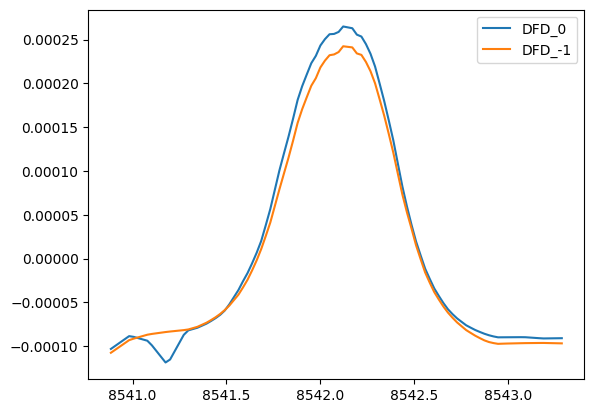

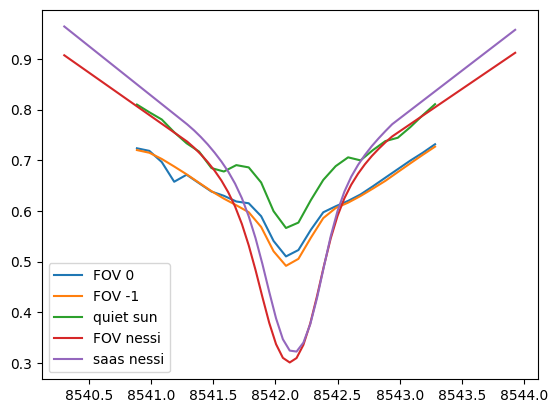

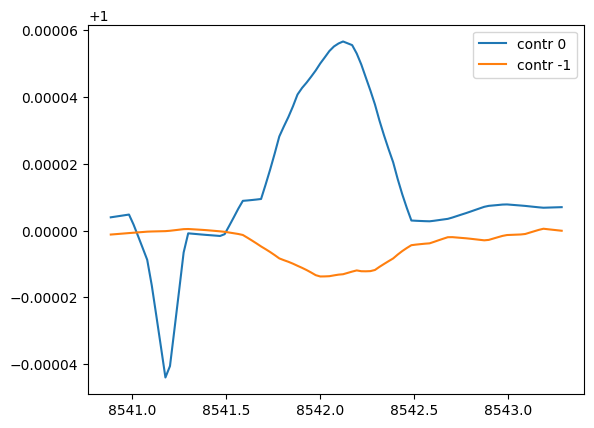

In [ ]:
un2.test_contrast(data, "CaIR15")

The average is 1.000014201786111
frame 0 with param_fit[-1] = (array([ 7.70798835e-05,  8.54207448e+03,  1.83481642e-01, -3.92817644e-01]), array([2.26184101e-06, 8.66043952e-03, 5.83337112e-02, 2.03015966e-02])). Here comes the plot:


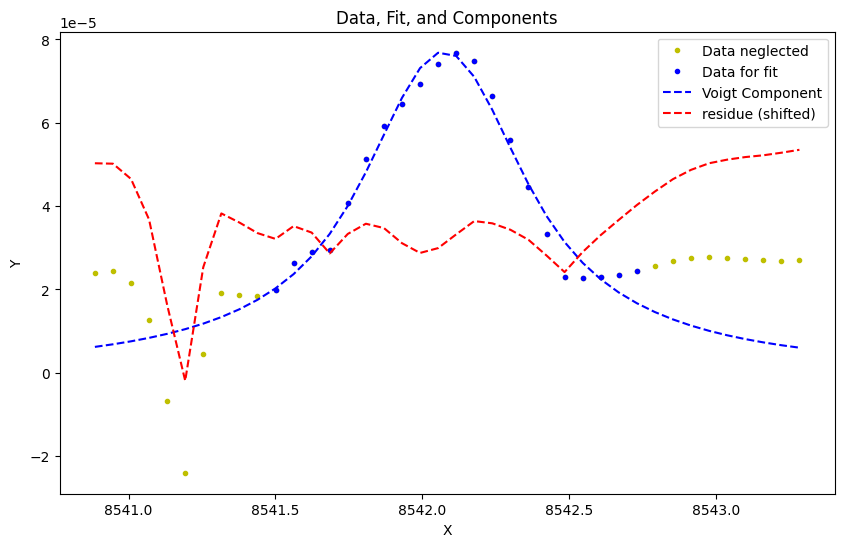

At frame 296 the voigt fitting was not succesfull and previous params are used. 
At frame 302 the voigt fitting was not succesfull and previous params are used. 
At frame 327 the voigt fitting was not succesfull and previous params are used. 
At frame 374 the voigt fitting was not succesfull and previous params are used. 
At frame 455 the voigt fitting was not succesfull and previous params are used. 
At frame 456 the voigt fitting was not succesfull and previous params are used. 
At frame 457 the voigt fitting was not succesfull and previous params are used. 
At frame 458 the voigt fitting was not succesfull and previous params are used. 
At frame 459 the voigt fitting was not succesfull and previous params are used. 
At frame 460 the voigt fitting was not succesfull and previous params are used. 
At frame 462 the voigt fitting was not succesfull and previous params are used. 
vmax = 3.498647147635729e-05, vmin = -2.7940453658724678e-05


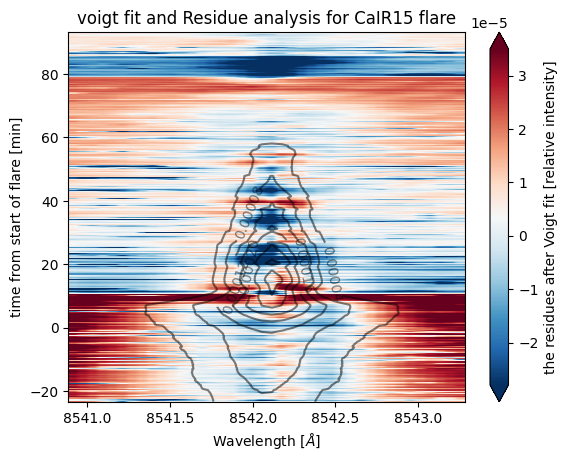

In [ ]:
l = "CaIR15"
vf.make_analysis(l, data, initial_guess=[ 1.16355577e-03,  8.54213207e+03,  2.03198317e-01, -2.19101476e-04],
              plot_rate=5000, neglect_points=vf.exc_wings(9,-9), offset=2*10**-5)
# Done!

The average is 0.9999991274068487
frame 0 with param_fit[-1] = (array([ 1.62282633e-05,  6.56243992e+03, -2.16227013e-01, -4.09813762e-02]), array([7.81149649e-06, 7.12754371e-02, 8.96405600e-02, 5.33869129e-01])). Here comes the plot:


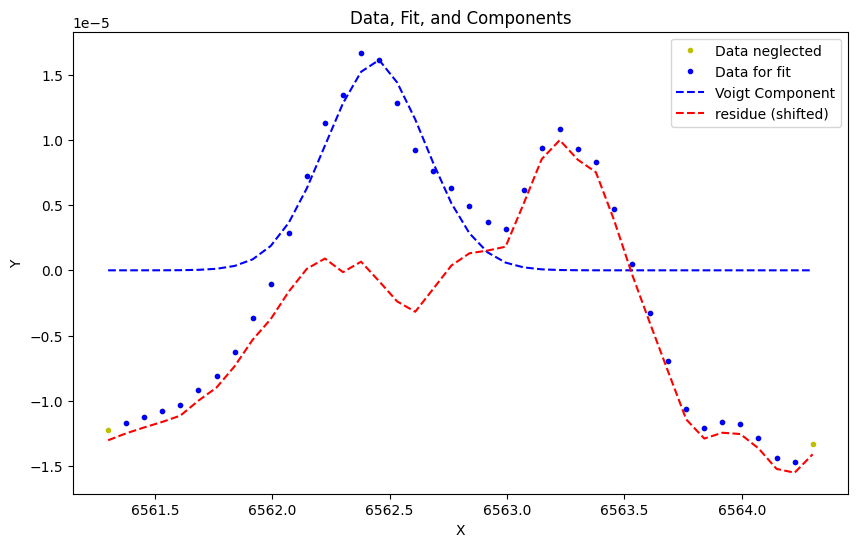

At frame 36 the voigt fitting was not succesfull and previous params are used. 
At frame 362 the voigt fitting was not succesfull and previous params are used. 
At frame 366 the voigt fitting was not succesfull and previous params are used. 
At frame 367 the voigt fitting was not succesfull and previous params are used. 
At frame 368 the voigt fitting was not succesfull and previous params are used. 
At frame 369 the voigt fitting was not succesfull and previous params are used. 
At frame 370 the voigt fitting was not succesfull and previous params are used. 
At frame 371 the voigt fitting was not succesfull and previous params are used. 
At frame 372 the voigt fitting was not succesfull and previous params are used. 
At frame 373 the voigt fitting was not succesfull and previous params are used. 
At frame 374 the voigt fitting was not succesfull and previous params are used. 
At frame 375 the voigt fitting was not succesfull and previous params are used. 
At frame 376 the voigt fittin

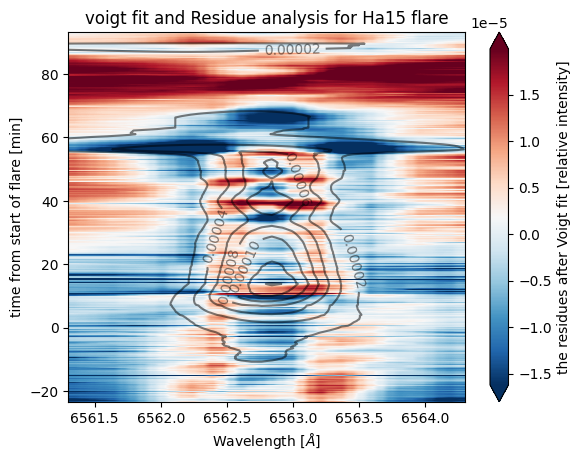

In [ ]:
l = "Ha15"
vf.make_analysis(l, data, initial_guess=[4*10**-5, 6.56287638e+03, 2.29257897e-01, 1.96399919e-01],
              plot_rate=5000, neglect_points=vf.exc_wings(0,-1), offset=2*10**-5)
# Done!

# please go run the file "problematic_voight_fits.ipynb" such that none of the fits are destroyed by this file ;)